In [1]:
#Import Libraries
import os
import random
import numpy as np
import pandas as pd
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from keras.utils import plot_model
from tensorflow.keras import models
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import MaxPooling2D
from tensorflow.keras.layers import Conv2D
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import Flatten
from tensorflow.keras.optimizers import legacy
from tensorflow.keras.optimizers import Nadam
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import classification_report, confusion_matrix 
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import load_img

In [2]:
# Global variables
SAVE = False
SEED = 111

# Setting seed for consistent results
tf.keras.utils.set_random_seed(SEED)
tf.random.set_seed(SEED)
np.random.seed(SEED)

# Data Visualization updates
%config InlineBackend.figure_format = 'retina'
plt.rcParams["figure.figsize"] = (16, 10)
plt.rcParams.update({'font.size': 14})

# Data Classifications
CLASS_TYPES = ['pituitary', 'notumor', 'meningioma', 'glioma']
N_TYPES = len(CLASS_TYPES)

# Image size
image_size = (150, 150)

# Training batch size
batch_size = 32

# Training batch size
epochs = 64

# Image shape: height, width, RBG
image_shape = (image_size[0], image_size[1], 3)

In [3]:
# Function for inporting data           
def get_data_labels(directory, shuffle=True, random_state=0):
    """
    Function used for going into the main training directory
    whose directory has sub-class-types.
    """
    from sklearn.utils import shuffle
    import os

    # Lists to store data and labels
    data_path = []
    data_labels = []
    
    for label in os.listdir(directory):
        label_dir = os.path.join(directory, label)

        # Avoid MacOS storing path
        if not os.path.isdir(label_dir):
            continue

        # Going into each folder and getting image path
        for image in os.listdir(label_dir):
            image_path = os.path.join(label_dir, image)
            data_path.append(image_path)
            data_labels.append(label)
            
    if shuffle:
        data_path, data_labels = shuffle(data_path, data_labels, random_state=random_state)
            
    return data_path, data_labels
# Setting up file paths for training and testing
USER_PATH = "/kaggle/input/brain-tumor-mri-dataset"
train_dir = USER_PATH + "/Training/"
test_dir = USER_PATH + "/Testing/"
save_path = './Optimizer_MRI_E128_BS32_Nadam'
# Getting data using above function
train_paths, train_labels = get_data_labels(train_dir)
test_paths, test_labels = get_data_labels(test_dir)

# Printing traing and testing sample sizes
print('Training')
print(f'Number of Paths: {len(train_paths)}')
print(f'Number of Labels: {len(train_labels)}')
print('\nTesting')
print(f'Number of Paths: {len(test_paths)}')
print(f'Number of Labels: {len(test_labels)}')

Training
Number of Paths: 5712
Number of Labels: 5712

Testing
Number of Paths: 1311
Number of Labels: 1311


In [4]:
# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(rescale=1./255,
                                   rotation_range=10,
                                   brightness_range=(0.9, 1.1),
                                   width_shift_range=0.002,
                                   height_shift_range=0.002,
                                   shear_range=10,
                                   zoom_range=0,
                                   horizontal_flip=True,
                                   vertical_flip=False,
                                   fill_mode="nearest")


# applying the generator to training data with constant seed
train_generator = train_datagen.flow_from_directory(train_dir,
                                                    target_size=image_size,
                                                    batch_size=batch_size,
                                                    class_mode="categorical",
                                                    seed=SEED)

# No augmentation of the test data, just rescaling
test_datagen = ImageDataGenerator(rescale=1./255)

# applying the generator to testing data with constant seed
test_generator = test_datagen.flow_from_directory(test_dir,
                                                  target_size=image_size,
                                                  batch_size=batch_size,
                                                  class_mode="categorical",
                                                  shuffle=False,
                                                  seed=SEED)

# –––––––––––––––––––––––––––––––––––––– #
# Output Images and Labels Visualization #
# –––––––––––––––––––––––––––––––––––––– #
def plot_sample_predictions(model, test_generator, categories, test_dir, num_samples=9, figsize=(12, 8)):
    """
    Nice display of prediction samples to see CNN predictions
    for classification.
    """
    # Make predictions on the test dataset
    predictions = model.predict(test_generator)
    predicted_categories = np.argmax(predictions, axis=1)
    true_categories = test_generator.classes

    # Randomly sample test images
    test_images = np.array(test_generator.filepaths)
    sample_indices = np.random.choice(len(test_images), size=num_samples, replace=False)
    sample_images = test_images[sample_indices]
    sample_predictions = [categories[predicted_categories[i]] for i in sample_indices]
    sample_true_labels = [categories[true_categories[i]] for i in sample_indices]

    # Plot sample images with their predicted and true labels
    plt.figure(figsize=figsize)
    
    # Loop over samples
    for i, image_path in enumerate(sample_images):
        # Form subplot and plot
        plt.subplot(3, 3, i + 1)
        img = plt.imread(image_path)
        plt.imshow(img)
        plt.axis("off")
        
        # Set axis label color depending on correct prediction or not
        prediction_color = 'green' if sample_predictions[i] == sample_true_labels[i] else 'red'
        plt.title(f"Predicted: {sample_predictions[i]}\nTrue: {sample_true_labels[i]}", color=prediction_color)
        
    plt.tight_layout()
    plt.show()

    
# –––––––––––––––––––––––––––––––––––––– #
#            Confusion matrix            #
# –––––––––––––––––––––––––––––––––––––– #
def CM(CNN_model, test_generator, categories):
    """
    Function to return the confusion matrix of a given CNN model.
    """
    from sklearn.metrics import confusion_matrix
    # Predictions on test dataset
    predictions = CNN_model.predict(test_generator)
    predicted_categories = np.argmax(predictions, axis=1)
    true_categories = test_generator.classes

    # Create a confusion matrix
    confusion_matrix_array = confusion_matrix(true_categories, predicted_categories)
    
    return confusion_matrix_array


# –––––––––––––––––––––––––––––––––––––– #
#             Metric Analysis            #
# –––––––––––––––––––––––––––––––––––––– #
def calculate_metrics(confusion_matrix, categories):
    """
    Function to calculate important metrics for multi-classification problems.
    """
    # Calculating 4 different metrics
    precision = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis=0)
    recall = np.diag(confusion_matrix) / np.sum(confusion_matrix, axis=1)
    f1_score = 2 * (precision * recall) / (precision + recall)
    accuracy = np.sum(np.diag(confusion_matrix)) / np.sum(confusion_matrix)

    # Printing the results based on each category
    for i, category in enumerate(categories):
        print(f"Class: {category.title()}")
        print(f"Precision: {precision[i]:.3f}")
        print(f"Recall: {recall[i]:.3f}")
        print(f"F1-Score: {f1_score[i]:.3f}\n")
        
    # Showing the total accuracy of the model
    print(f"\nAccuracy: {accuracy:.3f}")
# Accessing class indices for training data generator
class_indices_train = train_generator.class_indices
class_indices_train_list = list(train_generator.class_indices.keys())

# Displaying categorical types
print("Categorical types for the training data:")
print(class_indices_train)    

# Steps per epoch
steps_per_epoch = train_generator.samples // batch_size

# Validation steps
validation_steps = test_generator.samples // batch_size

print(f'Image shape: {image_shape}')
print(f'Epochs: {epochs}')
print(f'Batch size: {batch_size}')
print(f'Steps Per Epoch: {steps_per_epoch}')
print(f'Validation steps: {validation_steps}')

Found 5712 images belonging to 4 classes.
Found 1311 images belonging to 4 classes.
Categorical types for the training data:
{'glioma': 0, 'meningioma': 1, 'notumor': 2, 'pituitary': 3}
Image shape: (150, 150, 3)
Epochs: 64
Batch size: 32
Steps Per Epoch: 178
Validation steps: 40


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 149, 149, 32)   │           416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 73, 73, 64)     │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 35, 35, 128)    │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 156800)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 512)            │    80,282,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 80,325,732 (306.42 MB)

 Trainable params: 80,325,732 (306.42 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d has kernel size: (2, 2)
Layer conv2d_1 has kernel size: (2, 2)
Layer conv2d_2 has kernel size: (2, 2)
Epoch 1/64


/opt/conda/lib/python3.10/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()
I0000 00:00:1732941176.491746      79 service.cc:145] XLA service 0x7e3198004f90 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732941176.491803      79 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  1/178 ━━━━━━━━━━━━━━━━━━━━ 24:43 8s/step - accuracy: 0.2812 - loss: 1.3824

I0000 00:00:1732941180.511157      79 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


178/178 ━━━━━━━━━━━━━━━━━━━━ 78s 391ms/step - accuracy: 0.5942 - loss: 1.1615 - val_accuracy: 0.6250 - val_loss: 1.4095 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.8125 - loss: 0.3389

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.8125 - loss: 0.3389 - val_accuracy: 0.6452 - val_loss: 0.8587 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.8186 - loss: 0.4782 - val_accuracy: 0.7477 - val_loss: 0.8155 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 269us/step - accuracy: 0.8125 - loss: 0.5223 - val_accuracy: 1.0000 - val_loss: 0.3199 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.8570 - loss: 0.3684 - val_accuracy: 0.8422 - val_loss: 0.4367 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - accuracy: 0.8125 - loss: 0.3455 - val_accuracy: 0.9355 - val_loss: 0.2692 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.8886 - loss: 0.2904 - val_accuracy: 0.8664 - val_loss: 0.3737 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - accuracy: 0.8438 - loss: 0.251

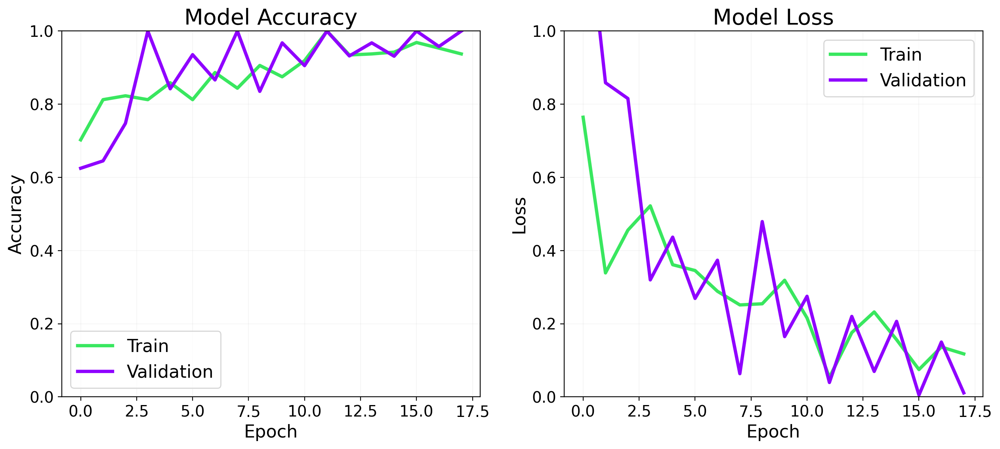

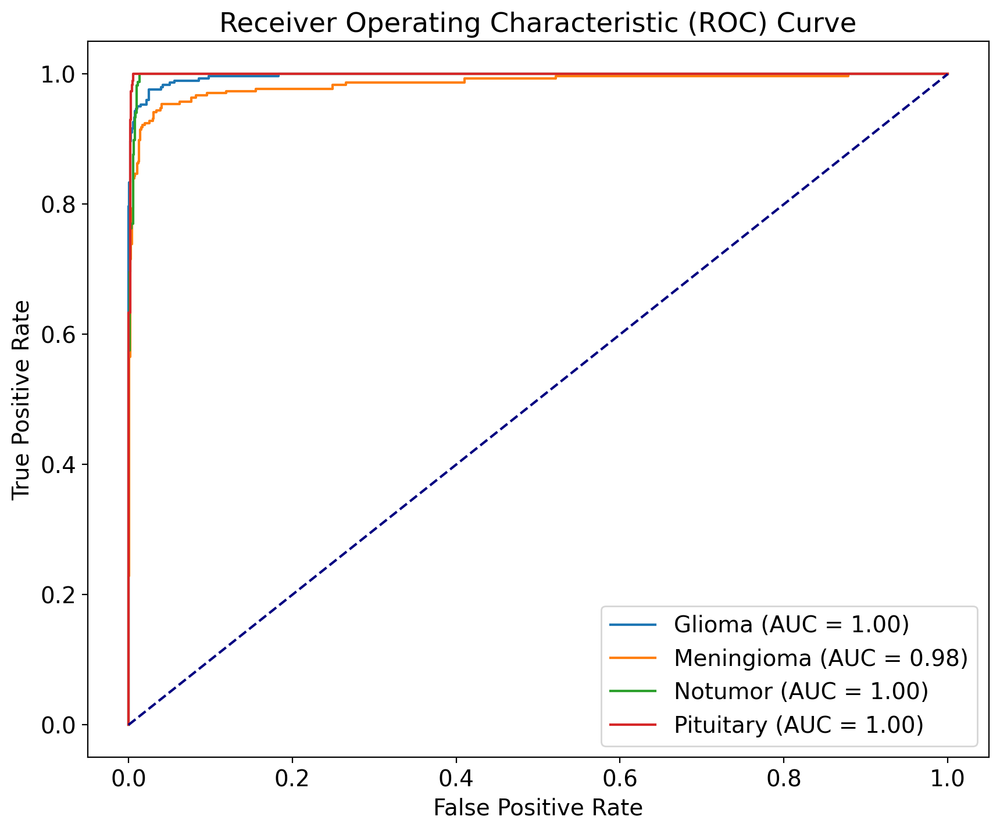

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step


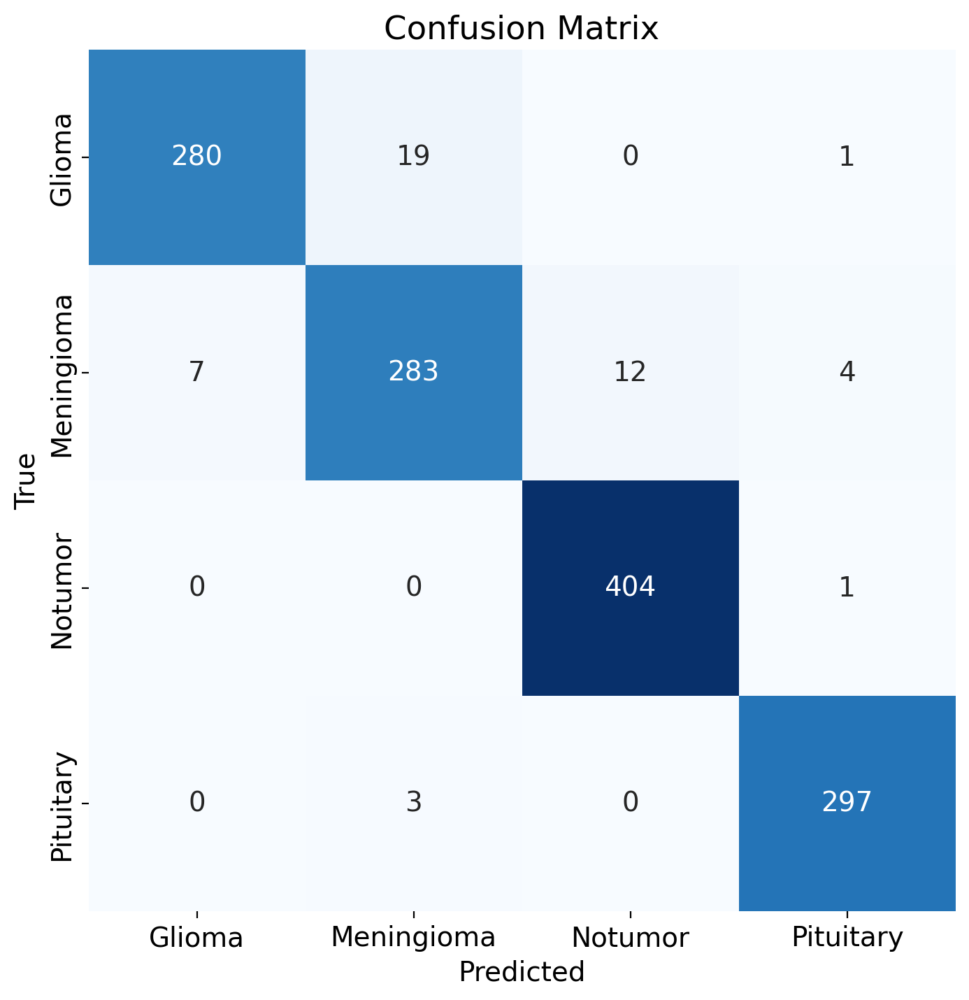

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.975610  0.933333  0.954003       300
  Meningioma   0.927869  0.924837  0.926350       306
     Notumor   0.971154  0.997531  0.984166       405
   Pituitary   0.980198  0.990000  0.985075       300

    accuracy                       0.964150      1311
   macro avg   0.963708  0.961425  0.962398      1311
weighted avg   0.964140  0.964150  0.963977      1311



In [5]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (2, 2), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 2
    Conv2D(64, (2, 2), activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 3
    Conv2D(128, (2, 2), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_3 (Conv2D)               │ (None, 149, 149, 32)   │           416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 49, 49, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 48, 48, 64)     │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 16, 16, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 15, 15, 128)    │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 28800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 512)            │    14,746,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,789,732 (56.42 MB)

 Trainable params: 14,789,732 (56.42 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_3 has kernel size: (2, 2)
Layer conv2d_4 has kernel size: (2, 2)
Layer conv2d_5 has kernel size: (2, 2)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - accuracy: 0.5974 - loss: 0.9520 - val_accuracy: 0.7602 - val_loss: 0.7604 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.7812 - loss: 0.5043

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7812 - loss: 0.5043 - val_accuracy: 0.6774 - val_loss: 0.7970 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 220ms/step - accuracy: 0.8096 - loss: 0.4910 - val_accuracy: 0.7617 - val_loss: 0.6911 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 411us/step - accuracy: 0.8125 - loss: 0.5665 - val_accuracy: 0.8710 - val_loss: 0.2791 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 223ms/step - accuracy: 0.8412 - loss: 0.3989 - val_accuracy: 0.8219 - val_loss: 0.5023 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - accuracy: 0.8438 - loss: 0.3392 - val_accuracy: 0.8387 - val_loss: 0.4078 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.8744 - loss: 0.3072 - val_accuracy: 0.7898 - val_loss: 0.6083 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - accuracy: 0.8438 - loss: 0.399

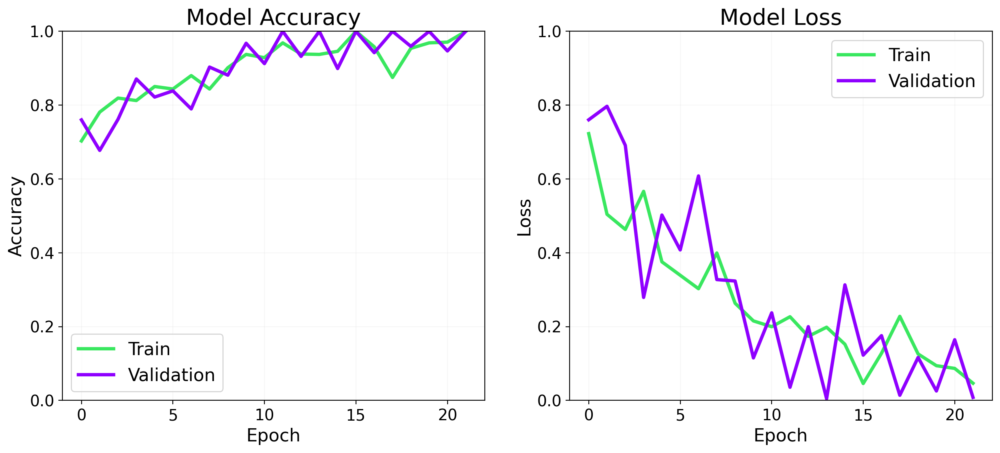

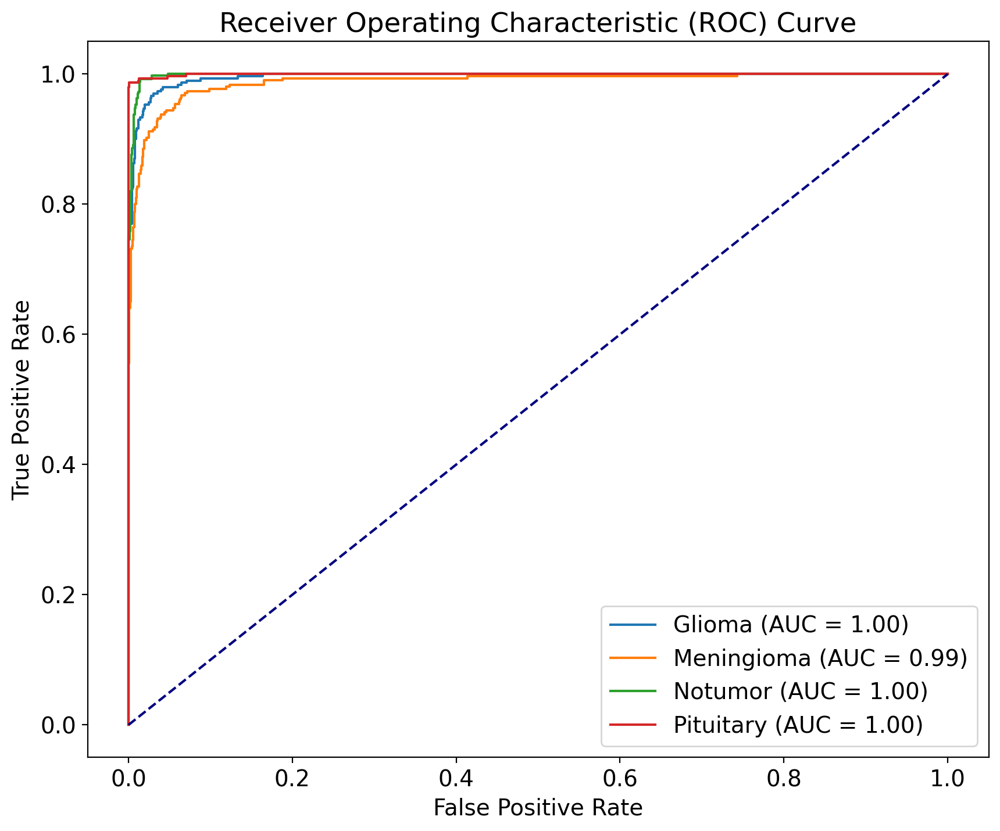

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step


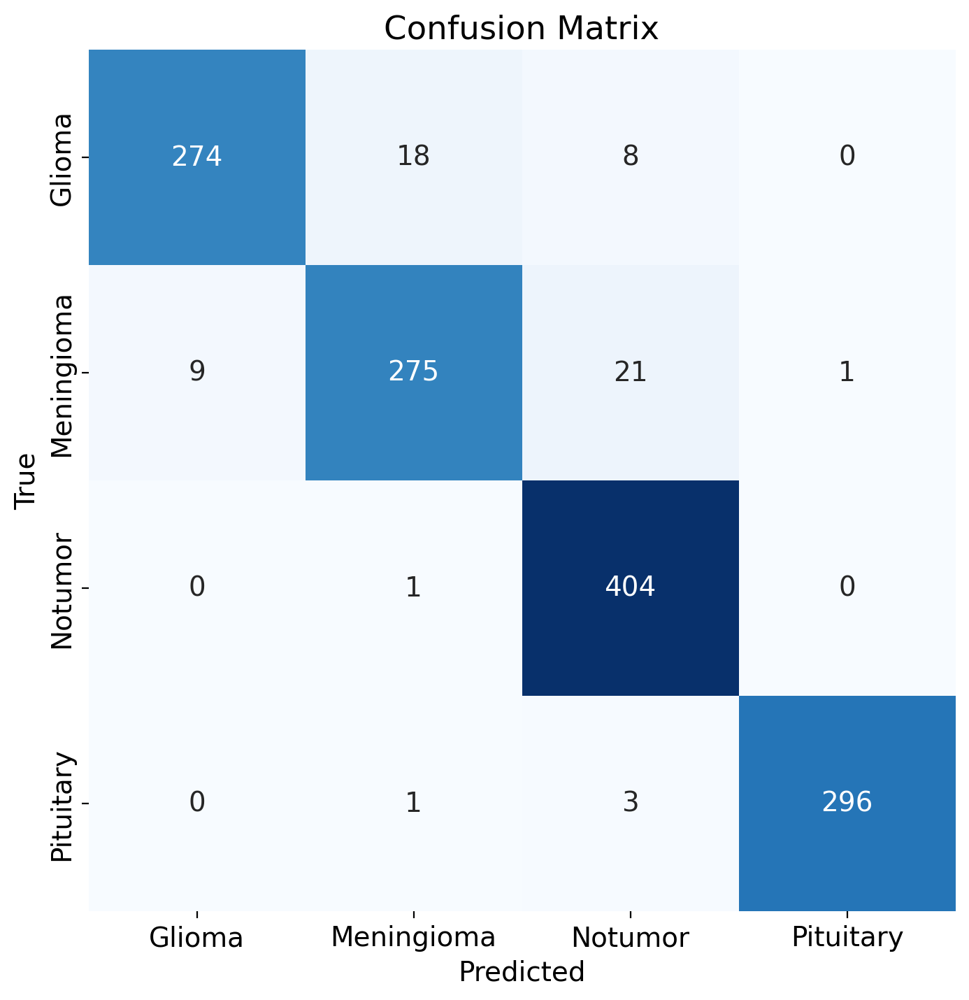

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.968198  0.913333  0.939966       300
  Meningioma   0.932203  0.898693  0.915141       306
     Notumor   0.926606  0.997531  0.960761       405
   Pituitary   0.996633  0.986667  0.991625       300

    accuracy                       0.952708      1311
   macro avg   0.955910  0.949056  0.951873      1311
weighted avg   0.953454  0.952708  0.952417      1311



In [6]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (2, 2), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 2
    Conv2D(64, (2, 2), activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 3
    Conv2D(128, (2, 2), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_6 (Conv2D)               │ (None, 149, 149, 32)   │           416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_7 (Conv2D)               │ (None, 36, 36, 64)     │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 9, 9, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_8 (Conv2D)               │ (None, 8, 8, 128)      │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │     4,194,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,238,436 (16.17 MB)

 Trainable params: 4,238,436 (16.17 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_6 has kernel size: (2, 2)
Layer conv2d_7 has kernel size: (2, 2)
Layer conv2d_8 has kernel size: (2, 2)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 49s 250ms/step - accuracy: 0.6245 - loss: 0.8887 - val_accuracy: 0.6914 - val_loss: 0.8301 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.7500 - loss: 0.6213

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7500 - loss: 0.6213 - val_accuracy: 0.9355 - val_loss: 0.3282 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 223ms/step - accuracy: 0.7973 - loss: 0.5011 - val_accuracy: 0.7914 - val_loss: 0.5955 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 351us/step - accuracy: 0.8125 - loss: 0.5595 - val_accuracy: 0.9677 - val_loss: 0.0865 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 221ms/step - accuracy: 0.8423 - loss: 0.3910 - val_accuracy: 0.7750 - val_loss: 0.5846 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 347us/step - accuracy: 0.9688 - loss: 0.1279 - val_accuracy: 0.7742 - val_loss: 0.5491 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.8786 - loss: 0.3170 - val_accuracy: 0.8523 - val_loss: 0.3484 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - accuracy: 0.8750 - loss: 0.309

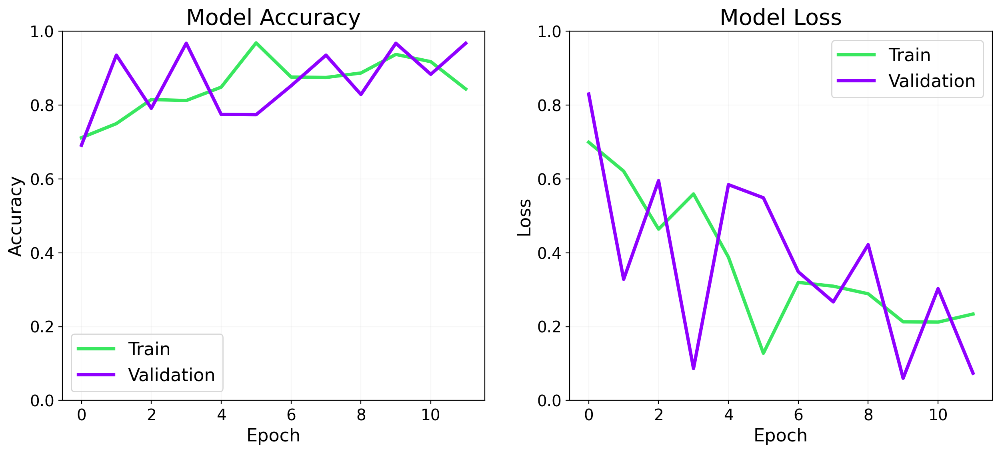

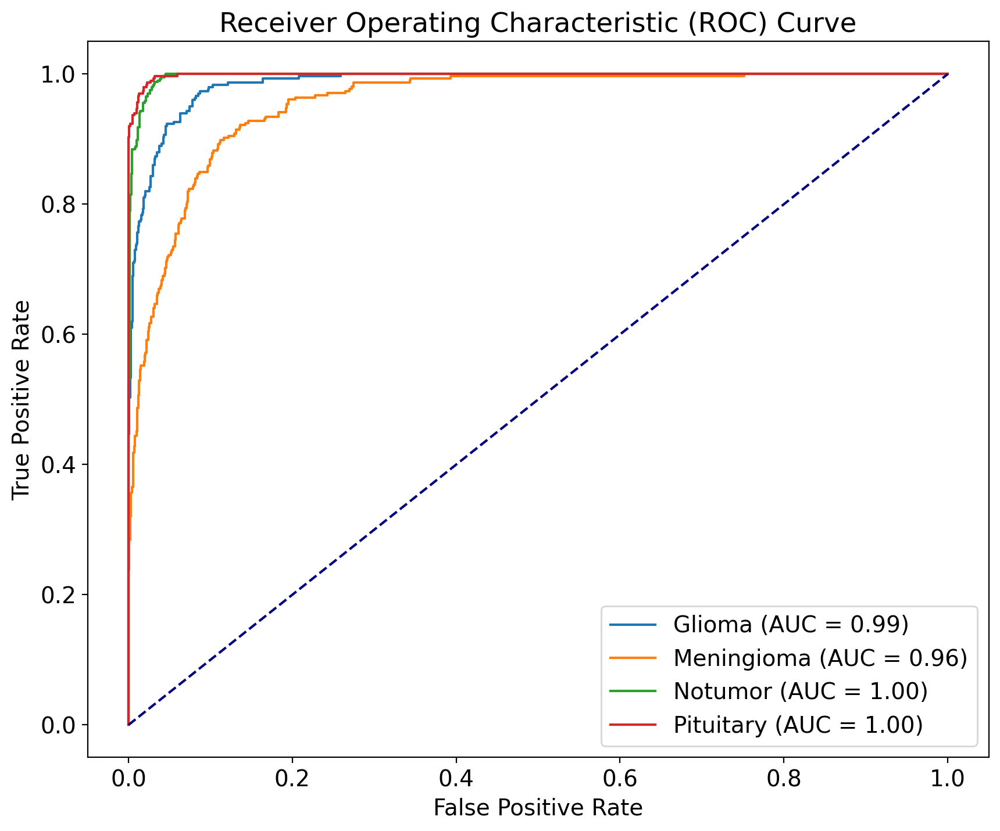

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step


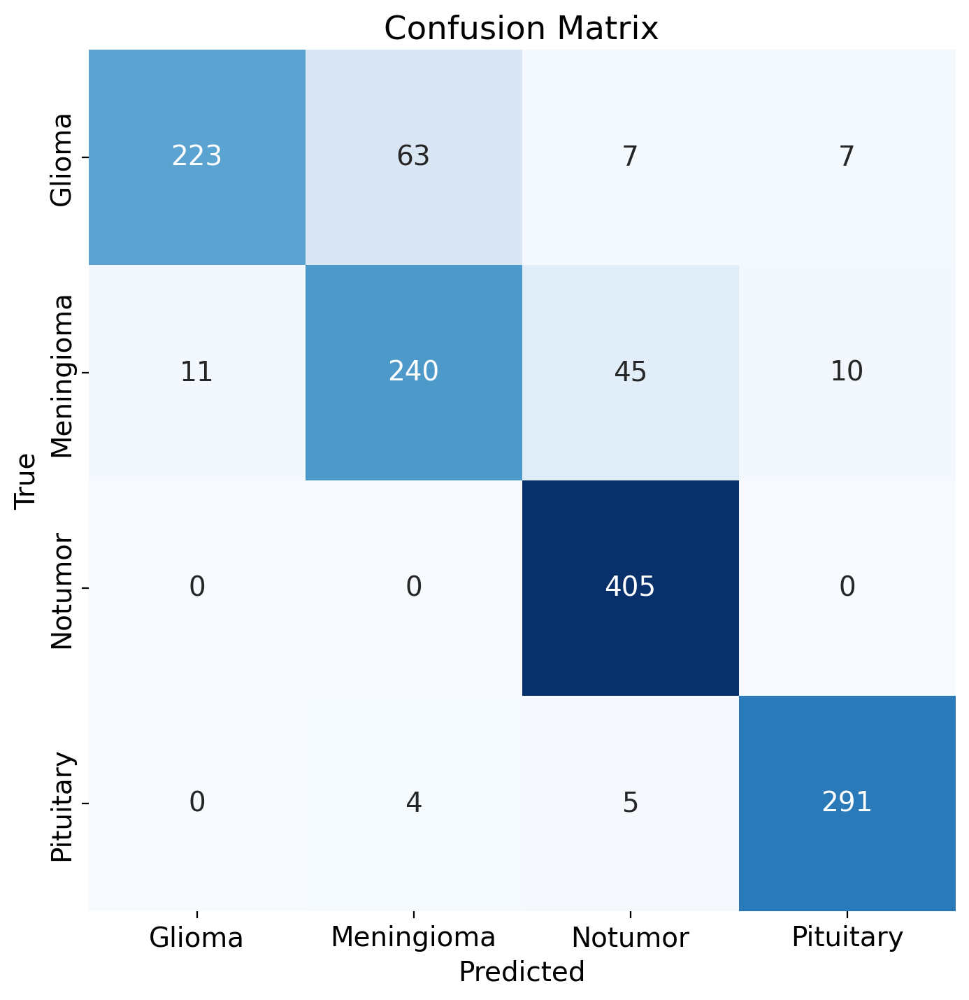

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.952991  0.743333  0.835206       300
  Meningioma   0.781759  0.784314  0.783034       306
     Notumor   0.876623  1.000000  0.934256       405
   Pituitary   0.944805  0.970000  0.957237       300

    accuracy                       0.884058      1311
   macro avg   0.889045  0.874412  0.877433      1311
weighted avg   0.887559  0.884058  0.881552      1311



In [7]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (2, 2), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 2
    Conv2D(64, (2, 2), activation="relu"),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 3
    Conv2D(128, (2, 2), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_9 (Conv2D)               │ (None, 149, 149, 32)   │           416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_6 (MaxPooling2D)  │ (None, 29, 29, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_10 (Conv2D)              │ (None, 28, 28, 64)     │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_7 (MaxPooling2D)  │ (None, 5, 5, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_11 (Conv2D)              │ (None, 4, 4, 128)      │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_3 (Flatten)             │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,092,708 (4.17 MB)

 Trainable params: 1,092,708 (4.17 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_9 has kernel size: (2, 2)
Layer conv2d_10 has kernel size: (2, 2)
Layer conv2d_11 has kernel size: (2, 2)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - accuracy: 0.5477 - loss: 0.9876 - val_accuracy: 0.5742 - val_loss: 1.1154 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6250 - loss: 0.7632

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6250 - loss: 0.7632 - val_accuracy: 0.7419 - val_loss: 0.7942 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 223ms/step - accuracy: 0.7780 - loss: 0.5545 - val_accuracy: 0.7102 - val_loss: 0.8681 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - accuracy: 0.7188 - loss: 0.6228 - val_accuracy: 0.8387 - val_loss: 0.4962 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 40s 218ms/step - accuracy: 0.8133 - loss: 0.4709 - val_accuracy: 0.7391 - val_loss: 0.6950 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - accuracy: 0.9688 - loss: 0.2533 - val_accuracy: 0.8387 - val_loss: 0.3946 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 40s 219ms/step - accuracy: 0.8520 - loss: 0.3748 - val_accuracy: 0.7359 - val_loss: 0.7196 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 332us/step - accuracy: 0.8125 - loss: 0.439

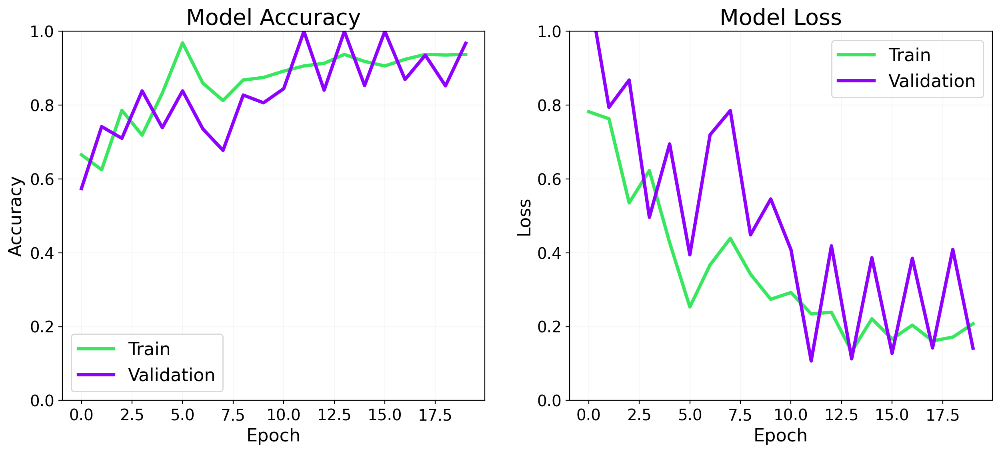

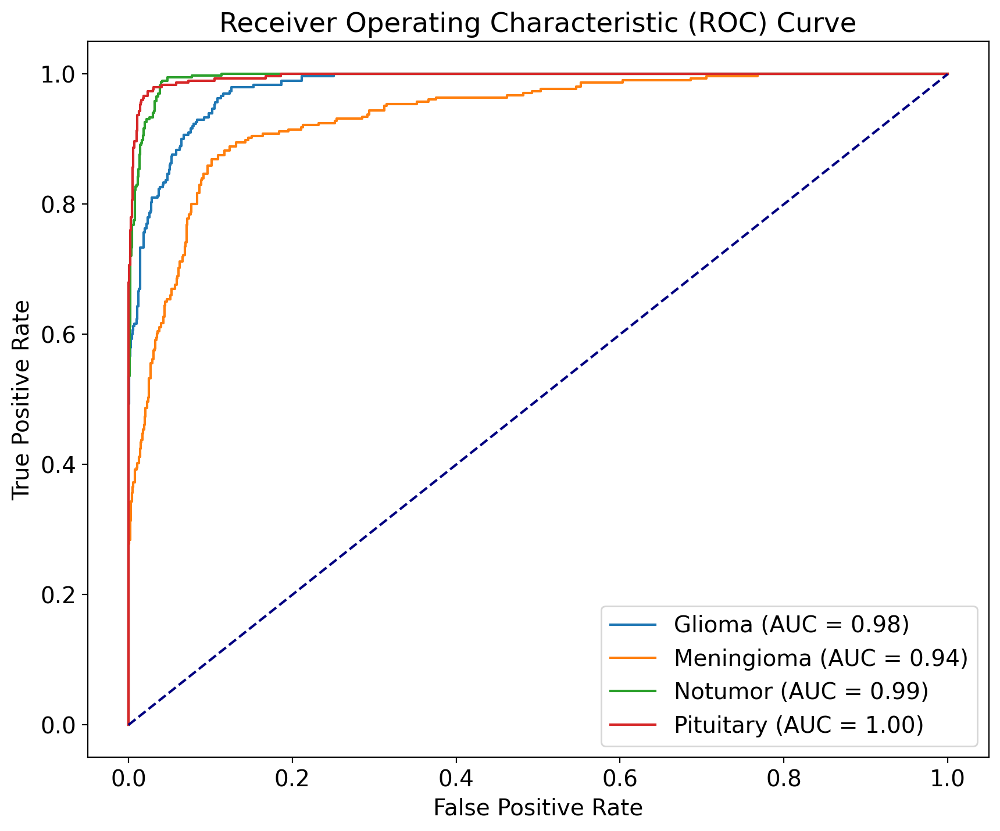

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step


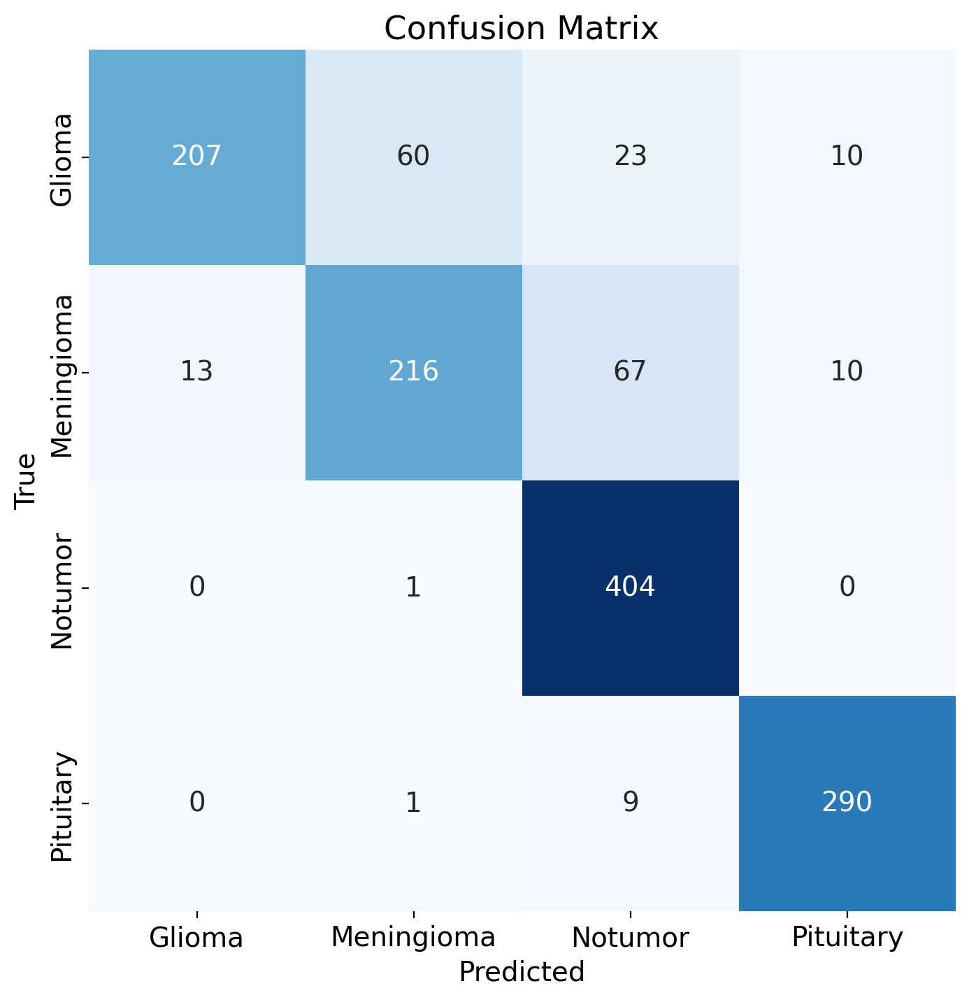

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.940909  0.690000  0.796154       300
  Meningioma   0.776978  0.705882  0.739726       306
     Notumor   0.803181  0.997531  0.889868       405
   Pituitary   0.935484  0.966667  0.950820       300

    accuracy                       0.852021      1311
   macro avg   0.864138  0.840020  0.844142      1311
weighted avg   0.858857  0.852021  0.847326      1311



In [8]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (2, 2), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(5, 5)),

    # Convolutional layer 2
    Conv2D(64, (2, 2), activation="relu"),
    MaxPooling2D(pool_size=(5, 5)),

    # Convolutional layer 3
    Conv2D(128, (2, 2), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_12 (Conv2D)              │ (None, 149, 149, 32)   │           416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_8 (MaxPooling2D)  │ (None, 24, 24, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_13 (Conv2D)              │ (None, 23, 23, 64)     │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_9 (MaxPooling2D)  │ (None, 3, 3, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_14 (Conv2D)              │ (None, 2, 2, 128)      │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_4 (Flatten)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_4 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 306,276 (1.17 MB)

 Trainable params: 306,276 (1.17 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_12 has kernel size: (2, 2)
Layer conv2d_13 has kernel size: (2, 2)
Layer conv2d_14 has kernel size: (2, 2)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - accuracy: 0.4667 - loss: 1.1251 - val_accuracy: 0.6562 - val_loss: 0.8378 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 1s 8ms/step - accuracy: 0.7188 - loss: 0.7258

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7188 - loss: 0.7258 - val_accuracy: 0.6452 - val_loss: 0.7566 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.7302 - loss: 0.6735 - val_accuracy: 0.7047 - val_loss: 0.7760 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - accuracy: 0.8125 - loss: 0.4149 - val_accuracy: 0.8710 - val_loss: 0.3850 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 221ms/step - accuracy: 0.7800 - loss: 0.5524 - val_accuracy: 0.7328 - val_loss: 0.6787 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 289us/step - accuracy: 0.6875 - loss: 0.7158 - val_accuracy: 0.9355 - val_loss: 0.2980 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 40s 217ms/step - accuracy: 0.8061 - loss: 0.4766 - val_accuracy: 0.7352 - val_loss: 0.7175 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 407us/step - accuracy: 0.7812 - loss: 0.466

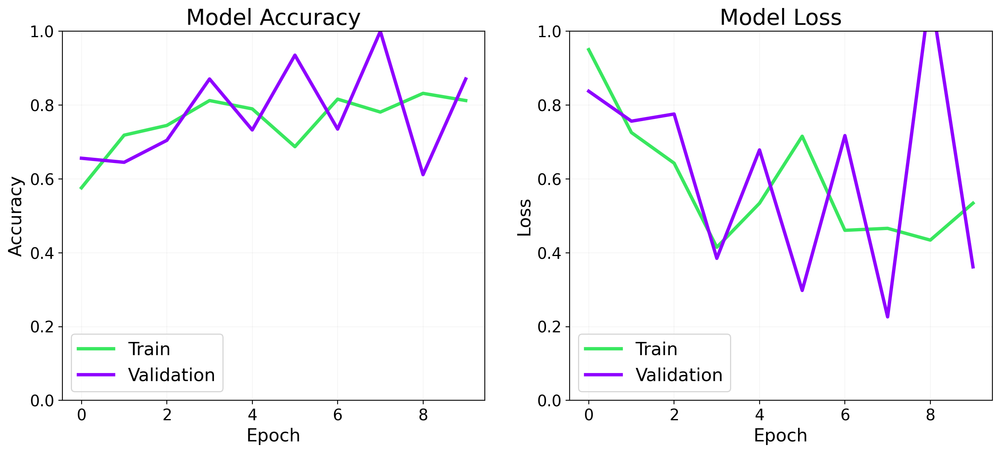

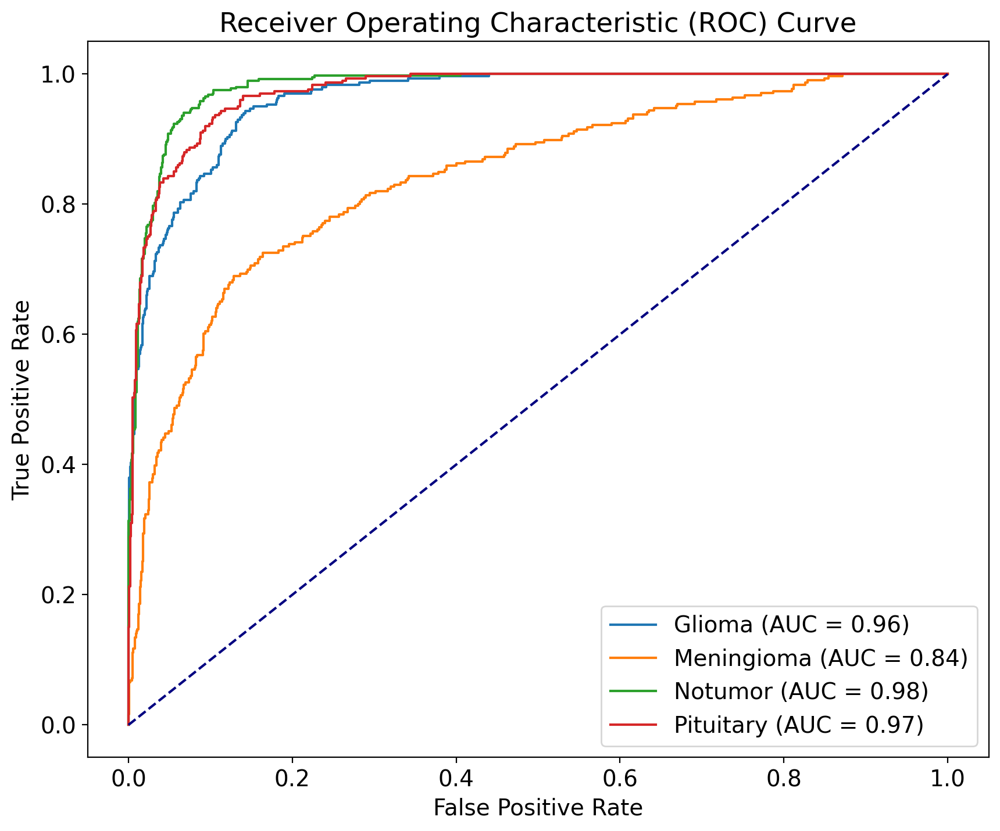

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step


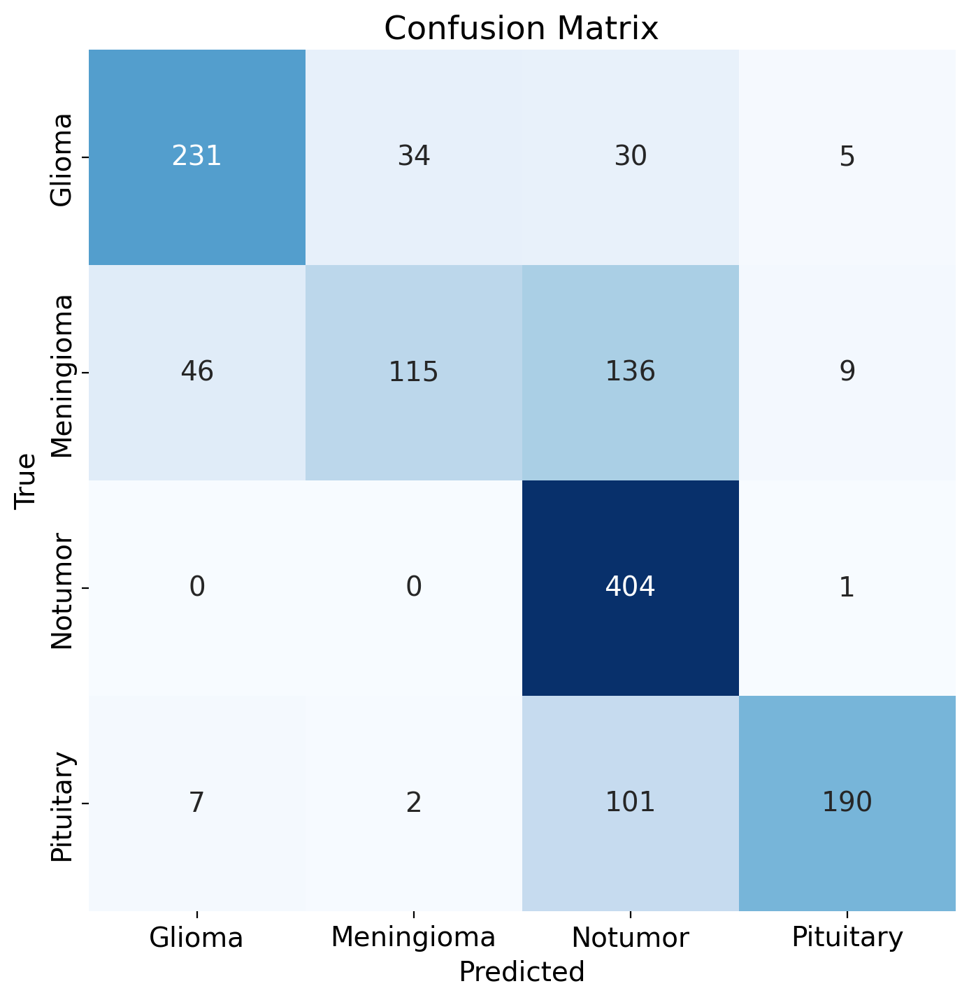

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.813380  0.770000  0.791096       300
  Meningioma   0.761589  0.375817  0.503282       306
     Notumor   0.602086  0.997531  0.750929       405
   Pituitary   0.926829  0.633333  0.752475       300

    accuracy                       0.717010      1311
   macro avg   0.775971  0.694170  0.699446      1311
weighted avg   0.761979  0.717010  0.702671      1311



In [9]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (2, 2), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(6, 6)),

    # Convolutional layer 2
    Conv2D(64, (2, 2), activation="relu"),
    MaxPooling2D(pool_size=(6, 6)),

    # Convolutional layer 3
    Conv2D(128, (2, 2), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_15 (Conv2D)              │ (None, 149, 149, 32)   │           416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_10 (MaxPooling2D) │ (None, 21, 21, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_16 (Conv2D)              │ (None, 20, 20, 64)     │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_11 (MaxPooling2D) │ (None, 2, 2, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_17 (Conv2D)              │ (None, 1, 1, 128)      │        32,896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_5 (Flatten)             │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_5 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 109,668 (428.39 KB)

 Trainable params: 109,668 (428.39 KB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_15 has kernel size: (2, 2)
Layer conv2d_16 has kernel size: (2, 2)
Layer conv2d_17 has kernel size: (2, 2)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - accuracy: 0.4031 - loss: 1.1966 - val_accuracy: 0.6445 - val_loss: 0.9027 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.6875 - loss: 0.9190

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6875 - loss: 0.9190 - val_accuracy: 0.9677 - val_loss: 0.4148 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 226ms/step - accuracy: 0.7203 - loss: 0.7081 - val_accuracy: 0.6664 - val_loss: 0.9243 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 331us/step - accuracy: 0.7812 - loss: 0.6702 - val_accuracy: 0.9677 - val_loss: 0.2997 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 222ms/step - accuracy: 0.7692 - loss: 0.6041 - val_accuracy: 0.7594 - val_loss: 0.6511 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 319us/step - accuracy: 0.7500 - loss: 0.5571 - val_accuracy: 0.9677 - val_loss: 0.2242 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 226ms/step - accuracy: 0.7899 - loss: 0.5183 - val_accuracy: 0.7258 - val_loss: 0.7724 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - accuracy: 0.8750 - loss: 0.354

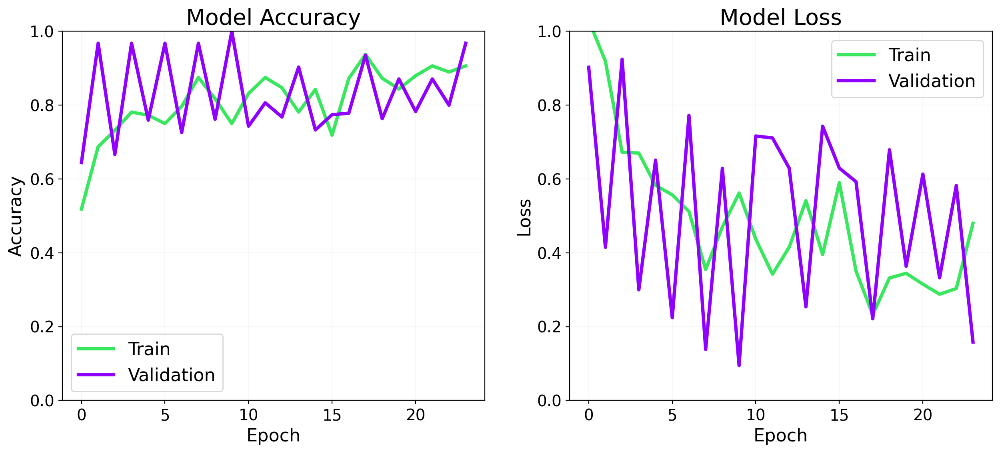

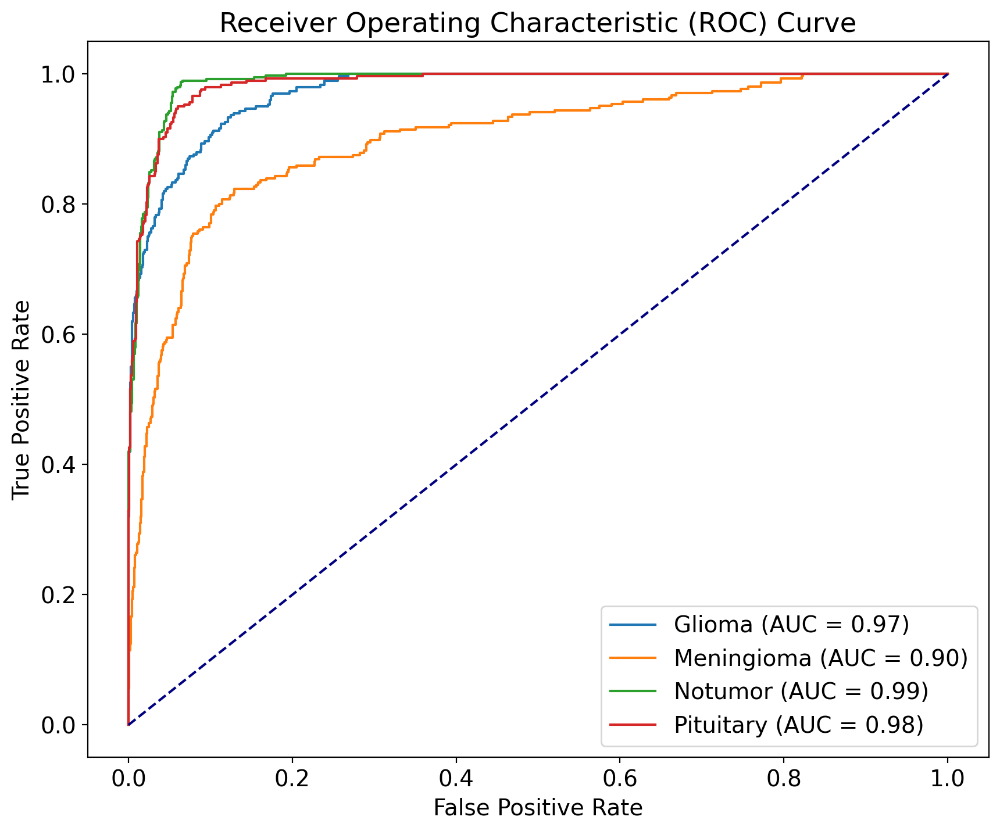

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step


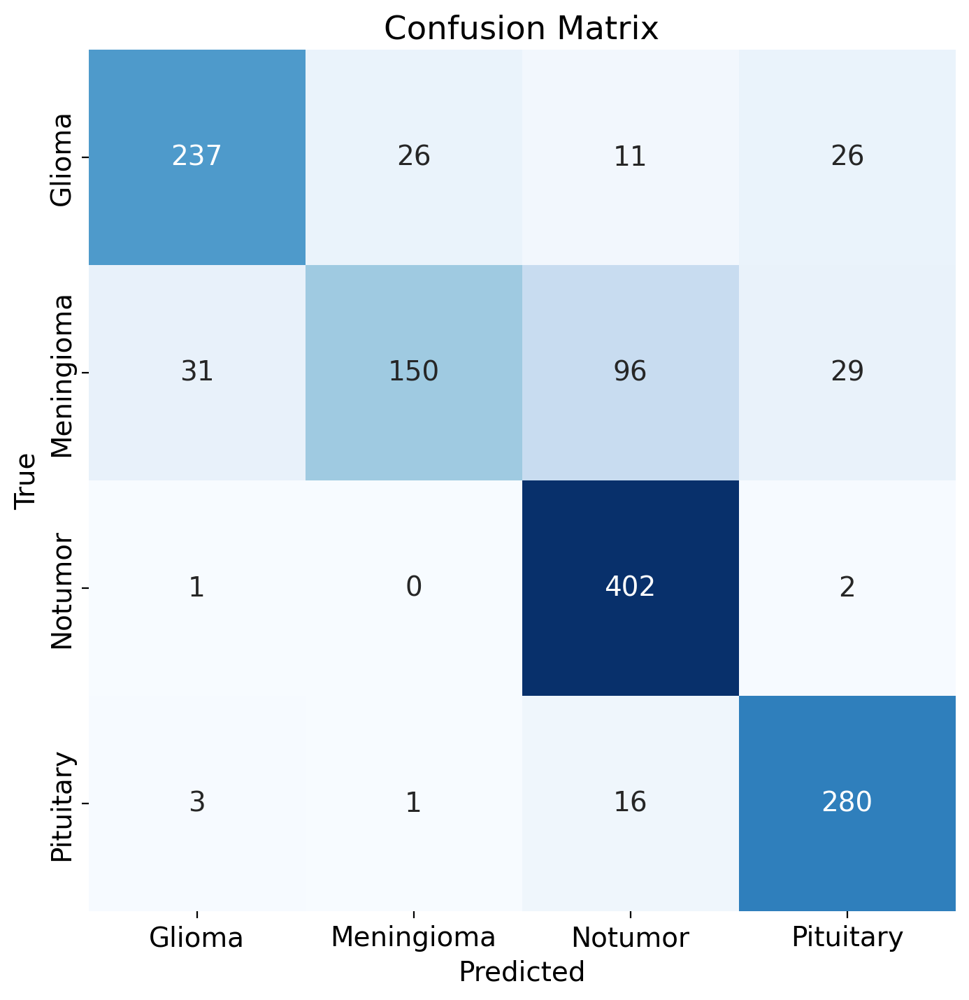

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.871324  0.790000  0.828671       300
  Meningioma   0.847458  0.490196  0.621118       306
     Notumor   0.765714  0.992593  0.864516       405
   Pituitary   0.830861  0.933333  0.879121       300

    accuracy                       0.815408      1311
   macro avg   0.828839  0.801531  0.798357      1311
weighted avg   0.823868  0.815408  0.802844      1311



In [10]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (2, 2), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(7, 7)),

    # Convolutional layer 2
    Conv2D(64, (2, 2), activation="relu"),
    MaxPooling2D(pool_size=(7, 7)),

    # Convolutional layer 3
    Conv2D(128, (2, 2), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_18 (Conv2D)              │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_12 (MaxPooling2D) │ (None, 74, 74, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_19 (Conv2D)              │ (None, 72, 72, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_13 (MaxPooling2D) │ (None, 36, 36, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_20 (Conv2D)              │ (None, 34, 34, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_6 (Flatten)             │ (None, 147968)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 512)            │    75,760,128 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_6 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 75,855,428 (289.37 MB)

 Trainable params: 75,855,428 (289.37 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_18 has kernel size: (3, 3)
Layer conv2d_19 has kernel size: (3, 3)
Layer conv2d_20 has kernel size: (3, 3)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 54s 265ms/step - accuracy: 0.5925 - loss: 1.3716 - val_accuracy: 0.7523 - val_loss: 0.6506 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 3s 21ms/step - accuracy: 0.6875 - loss: 0.8634

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.6875 - loss: 0.8634 - val_accuracy: 0.9032 - val_loss: 0.6492 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - accuracy: 0.8170 - loss: 0.4708 - val_accuracy: 0.8266 - val_loss: 0.4551 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 296us/step - accuracy: 0.7500 - loss: 0.8760 - val_accuracy: 1.0000 - val_loss: 0.0455 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 224ms/step - accuracy: 0.8438 - loss: 0.3936 - val_accuracy: 0.8820 - val_loss: 0.3260 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 279us/step - accuracy: 0.8125 - loss: 0.3543 - val_accuracy: 0.9355 - val_loss: 0.1794 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.8831 - loss: 0.2999 - val_accuracy: 0.8539 - val_loss: 0.4152 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 293us/step - accuracy: 0.9375 - loss: 0.155

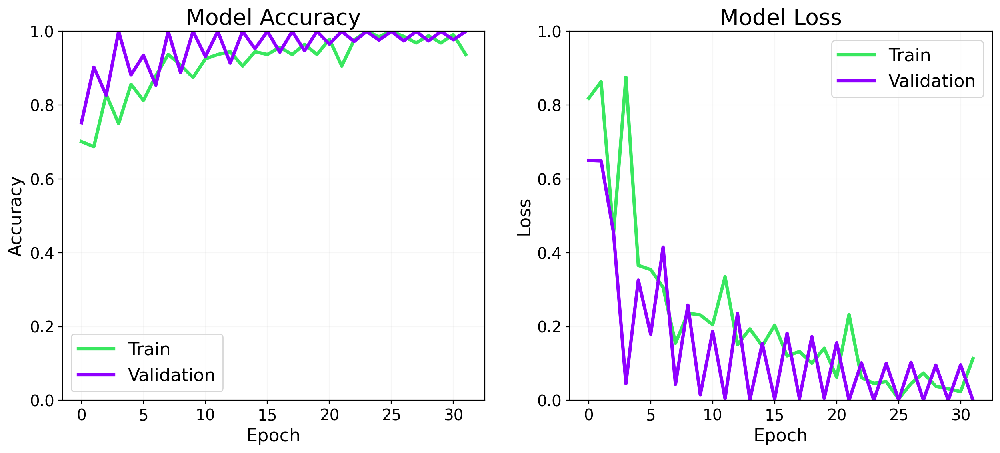

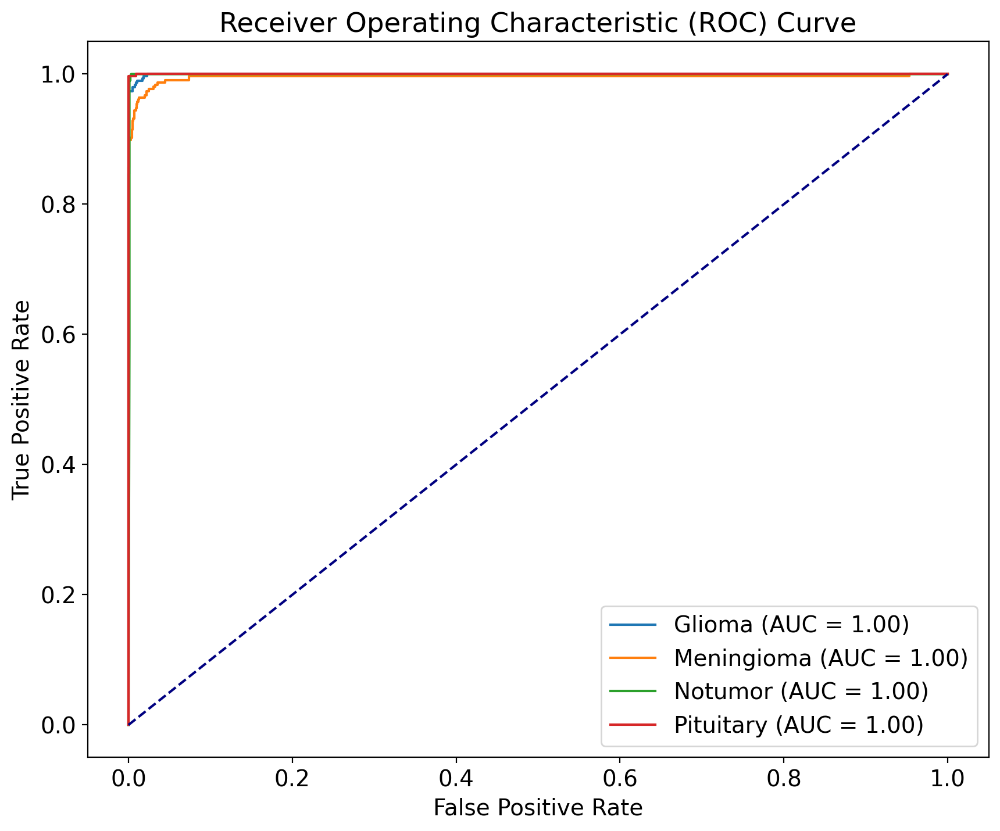

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step


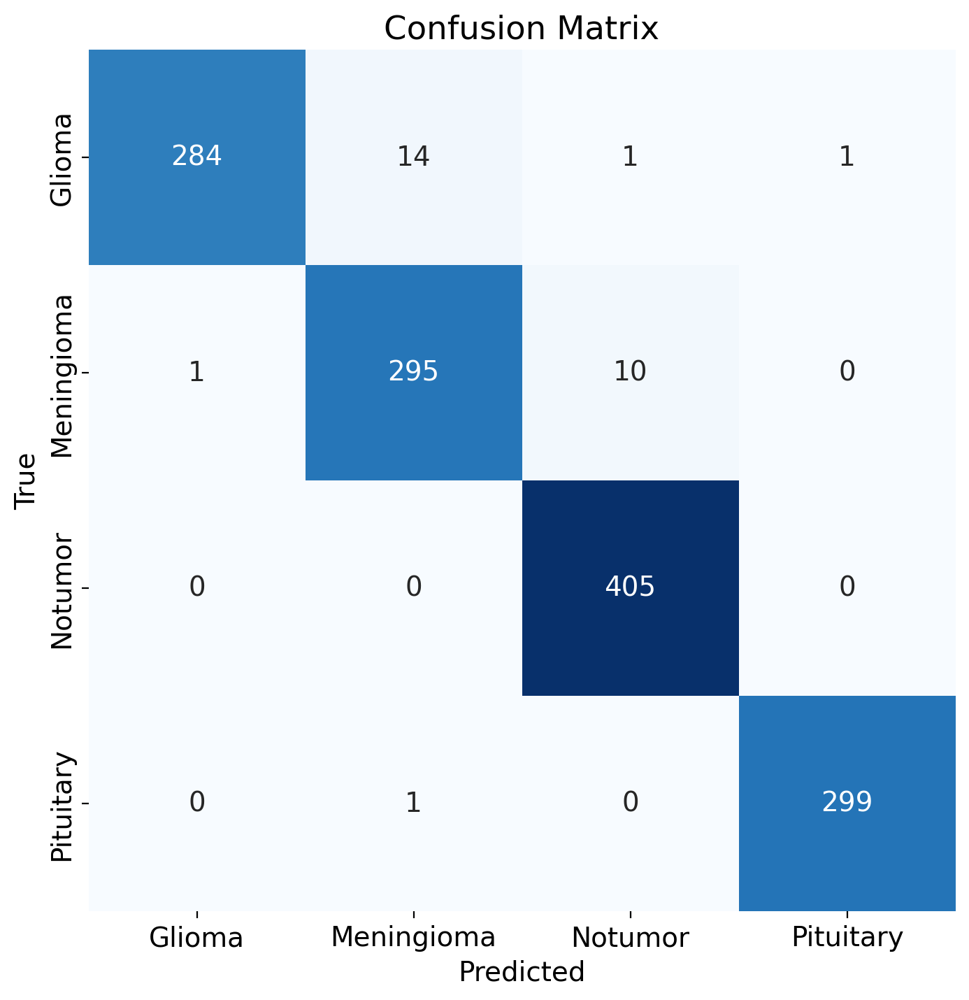

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.996491  0.946667  0.970940       300
  Meningioma   0.951613  0.964052  0.957792       306
     Notumor   0.973558  1.000000  0.986602       405
   Pituitary   0.996667  0.996667  0.996667       300

    accuracy                       0.978642      1311
   macro avg   0.979582  0.976846  0.978000      1311
weighted avg   0.978972  0.978642  0.978597      1311



In [11]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (3, 3), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 2
    Conv2D(64, (3, 3), activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 3
    Conv2D(128, (3, 3), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_21 (Conv2D)              │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_14 (MaxPooling2D) │ (None, 49, 49, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_22 (Conv2D)              │ (None, 47, 47, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_15 (MaxPooling2D) │ (None, 15, 15, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_23 (Conv2D)              │ (None, 13, 13, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_7 (Flatten)             │ (None, 21632)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 512)            │    11,076,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_7 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 11,171,396 (42.62 MB)

 Trainable params: 11,171,396 (42.62 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_21 has kernel size: (3, 3)
Layer conv2d_22 has kernel size: (3, 3)
Layer conv2d_23 has kernel size: (3, 3)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 52s 259ms/step - accuracy: 0.6350 - loss: 0.8914 - val_accuracy: 0.7594 - val_loss: 0.6034 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.8750 - loss: 0.3678

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8750 - loss: 0.3678 - val_accuracy: 1.0000 - val_loss: 0.1674 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - accuracy: 0.8174 - loss: 0.4571 - val_accuracy: 0.7977 - val_loss: 0.4932 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 360us/step - accuracy: 0.7812 - loss: 0.5006 - val_accuracy: 1.0000 - val_loss: 0.0867 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.8443 - loss: 0.3843 - val_accuracy: 0.8391 - val_loss: 0.3940 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 317us/step - accuracy: 0.7500 - loss: 0.5654 - val_accuracy: 0.9355 - val_loss: 0.1351 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 222ms/step - accuracy: 0.8902 - loss: 0.2906 - val_accuracy: 0.8727 - val_loss: 0.3117 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - accuracy: 0.9062 - loss: 0.142

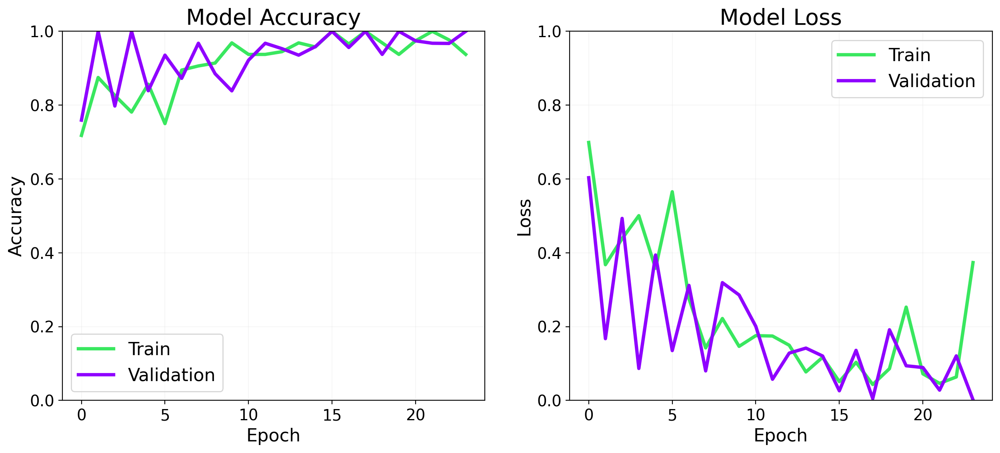

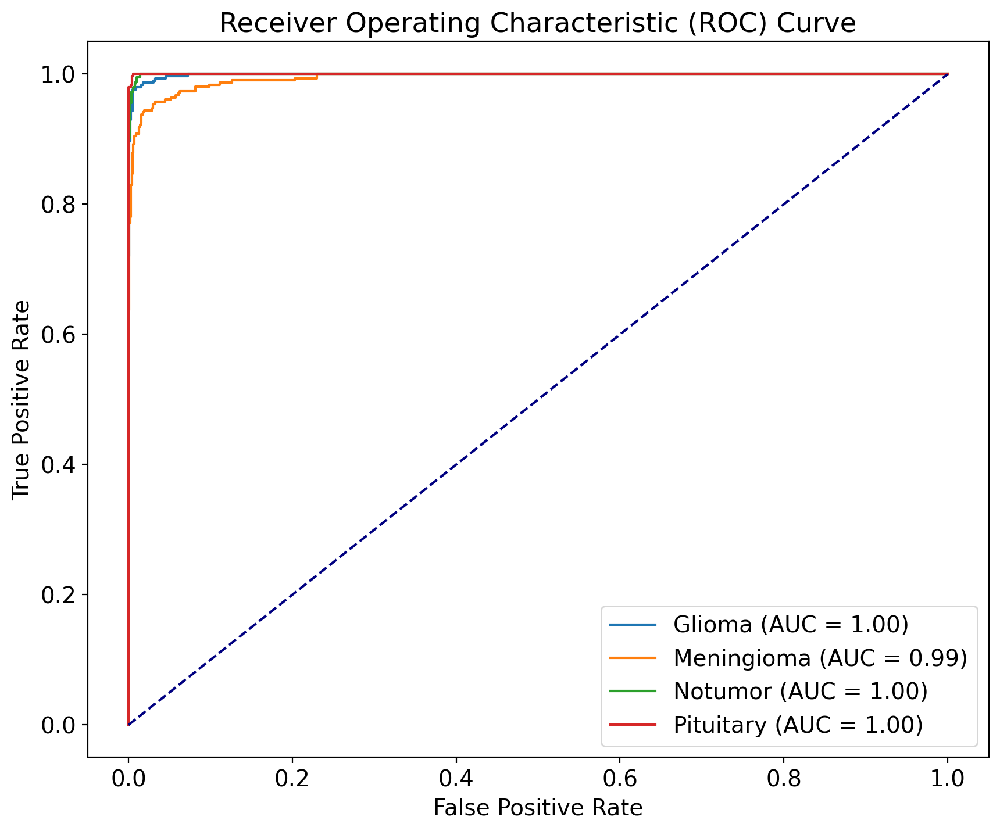

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step


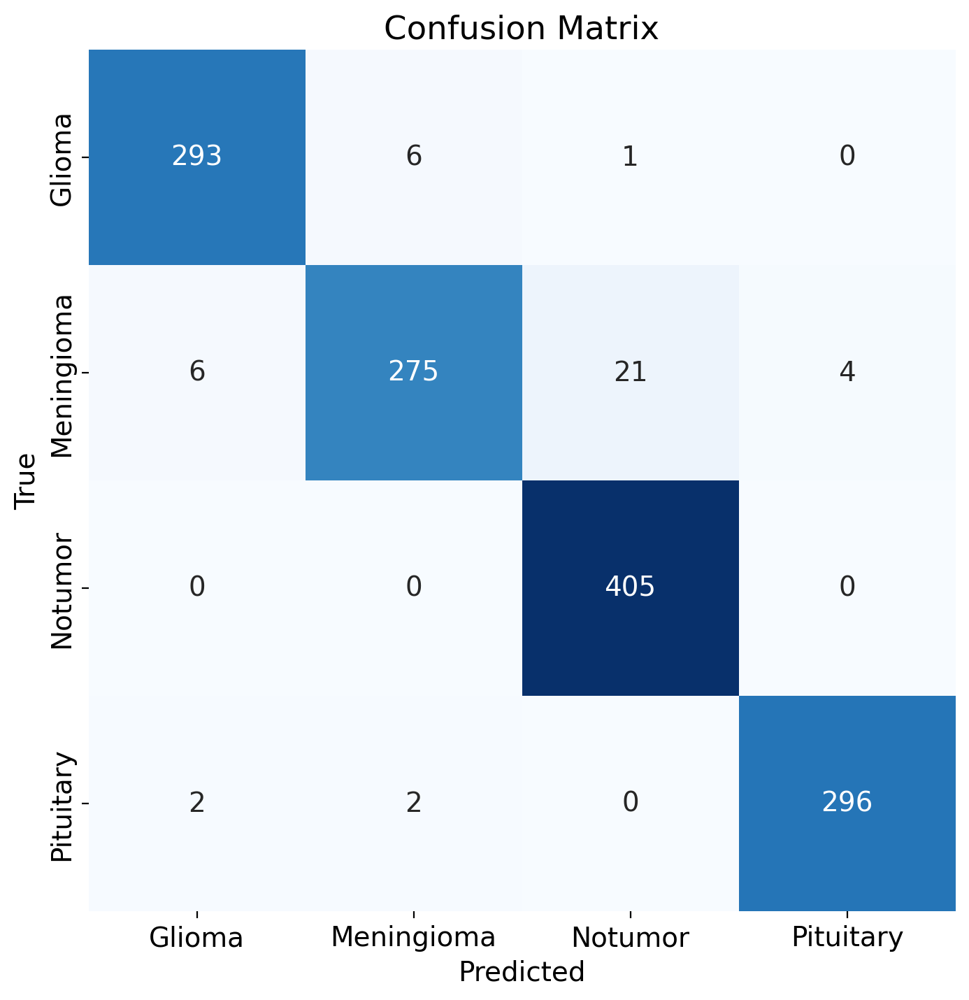

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.973422  0.976667  0.975042       300
  Meningioma   0.971731  0.898693  0.933786       306
     Notumor   0.948478  1.000000  0.973558       405
   Pituitary   0.986667  0.986667  0.986667       300

    accuracy                       0.967963      1311
   macro avg   0.970074  0.965507  0.967263      1311
weighted avg   0.968352  0.967963  0.967614      1311



In [12]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (3, 3), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 2
    Conv2D(64, (3, 3), activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 3
    Conv2D(128, (3, 3), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_24 (Conv2D)              │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_16 (MaxPooling2D) │ (None, 37, 37, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_25 (Conv2D)              │ (None, 35, 35, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_17 (MaxPooling2D) │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_26 (Conv2D)              │ (None, 6, 6, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_8 (Flatten)             │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 512)            │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_8 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,455,108 (9.37 MB)

 Trainable params: 2,455,108 (9.37 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_24 has kernel size: (3, 3)
Layer conv2d_25 has kernel size: (3, 3)
Layer conv2d_26 has kernel size: (3, 3)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 50s 256ms/step - accuracy: 0.5597 - loss: 0.9538 - val_accuracy: 0.6930 - val_loss: 0.8422 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.7812 - loss: 0.5193

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7812 - loss: 0.5193 - val_accuracy: 1.0000 - val_loss: 0.2102 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - accuracy: 0.7985 - loss: 0.5009 - val_accuracy: 0.7727 - val_loss: 0.5325 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 424us/step - accuracy: 0.9062 - loss: 0.3074 - val_accuracy: 0.9355 - val_loss: 0.2521 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - accuracy: 0.8438 - loss: 0.3970 - val_accuracy: 0.8219 - val_loss: 0.4712 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 339us/step - accuracy: 0.8438 - loss: 0.2975 - val_accuracy: 0.9677 - val_loss: 0.1625 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 43s 232ms/step - accuracy: 0.8735 - loss: 0.3284 - val_accuracy: 0.8266 - val_loss: 0.5078 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 354us/step - accuracy: 0.8750 - loss: 0.298

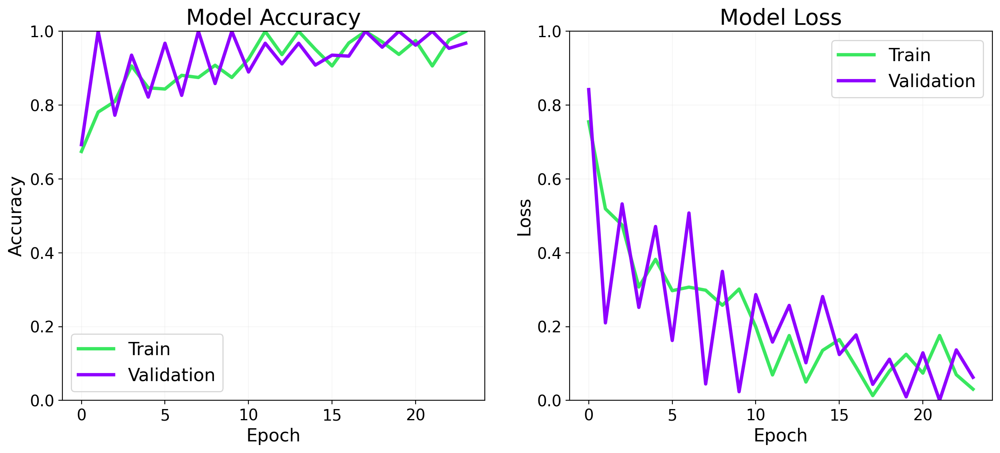

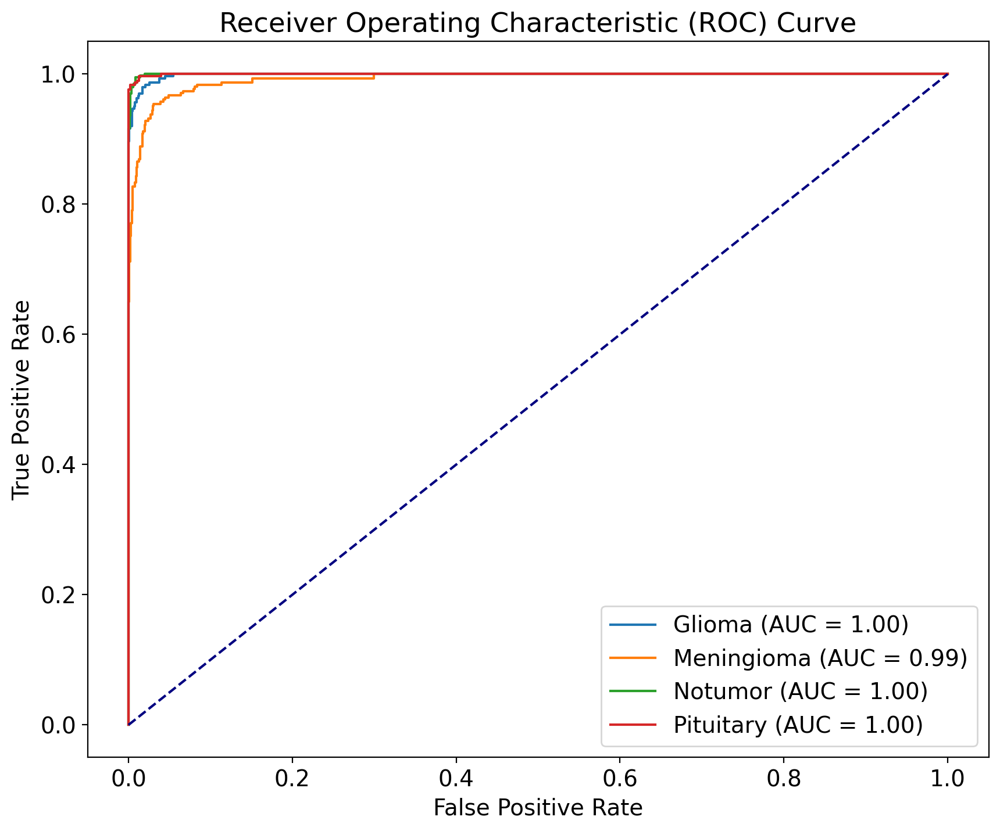

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step


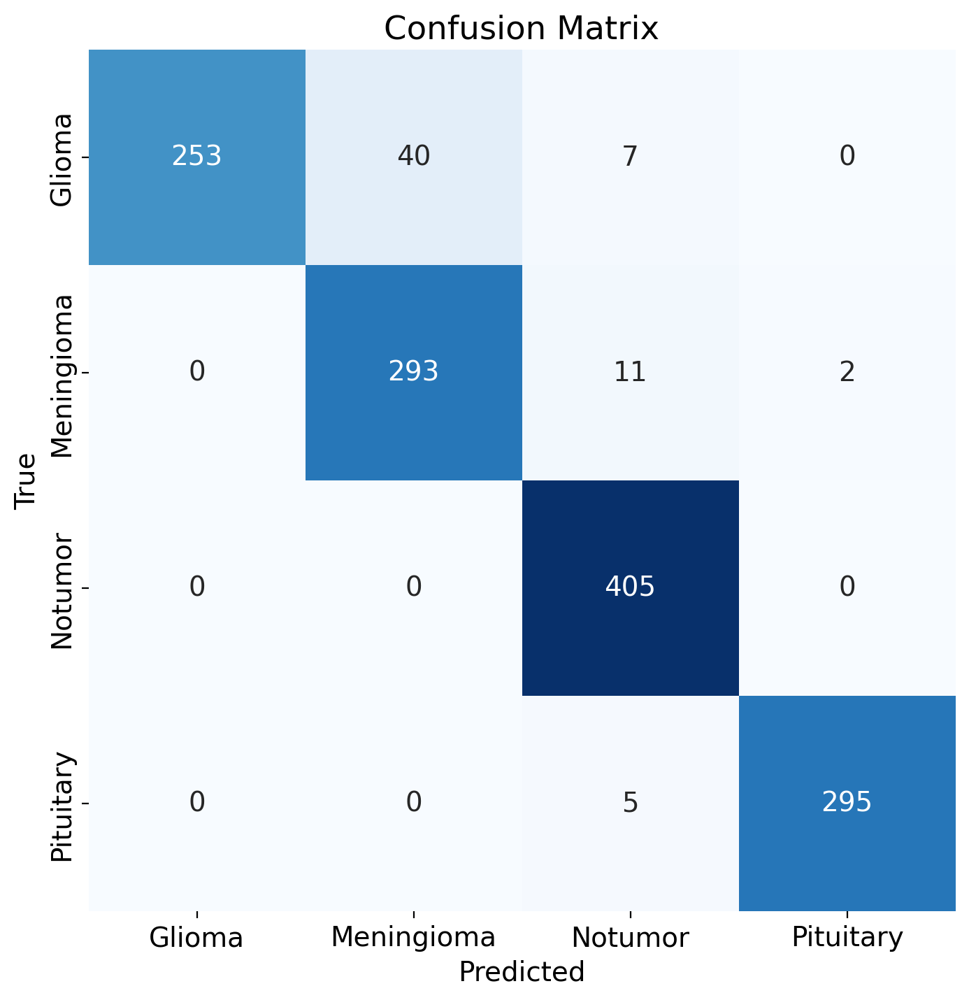

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   1.000000  0.843333  0.915009       300
  Meningioma   0.879880  0.957516  0.917058       306
     Notumor   0.946262  1.000000  0.972389       405
   Pituitary   0.993266  0.983333  0.988275       300

    accuracy                       0.950420      1311
   macro avg   0.954852  0.946046  0.948183      1311
weighted avg   0.953821  0.950420  0.949979      1311



In [13]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (3, 3), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 2
    Conv2D(64, (3, 3), activation="relu"),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 3
    Conv2D(128, (3, 3), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_27 (Conv2D)              │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_18 (MaxPooling2D) │ (None, 29, 29, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_28 (Conv2D)              │ (None, 27, 27, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_19 (MaxPooling2D) │ (None, 5, 5, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_29 (Conv2D)              │ (None, 3, 3, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_9 (Flatten)             │ (None, 1152)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 512)            │       590,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_9 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 685,636 (2.62 MB)

 Trainable params: 685,636 (2.62 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_27 has kernel size: (3, 3)
Layer conv2d_28 has kernel size: (3, 3)
Layer conv2d_29 has kernel size: (3, 3)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 51s 256ms/step - accuracy: 0.5280 - loss: 1.0331 - val_accuracy: 0.6484 - val_loss: 1.1938 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.8438 - loss: 0.6147

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8438 - loss: 0.6147 - val_accuracy: 0.8710 - val_loss: 0.2669 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 229ms/step - accuracy: 0.7843 - loss: 0.5376 - val_accuracy: 0.7477 - val_loss: 0.6535 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 404us/step - accuracy: 0.7500 - loss: 0.6268 - val_accuracy: 0.6774 - val_loss: 0.8707 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - accuracy: 0.8267 - loss: 0.4384 - val_accuracy: 0.7867 - val_loss: 0.5426 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 374us/step - accuracy: 0.7812 - loss: 0.5157 - val_accuracy: 0.7742 - val_loss: 0.5831 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 216ms/step - accuracy: 0.8583 - loss: 0.3757
Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 229ms/step - accuracy: 0.8583 - loss: 0.3755

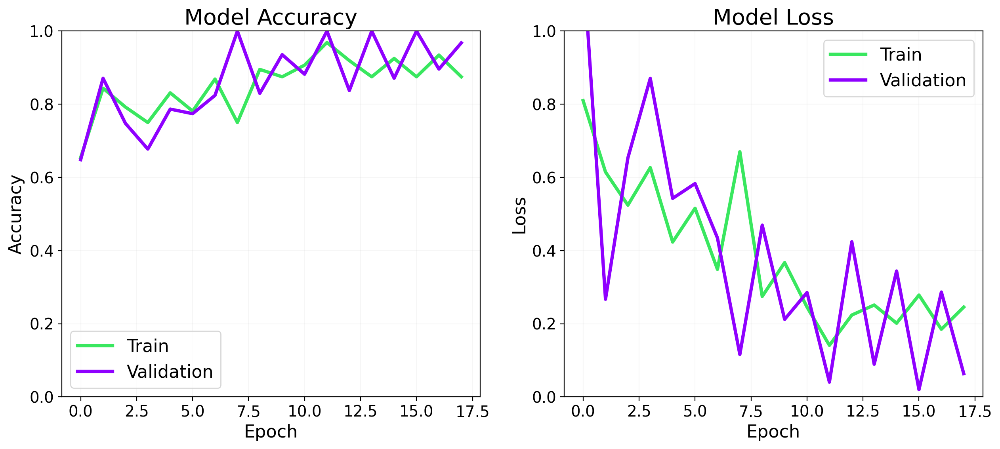

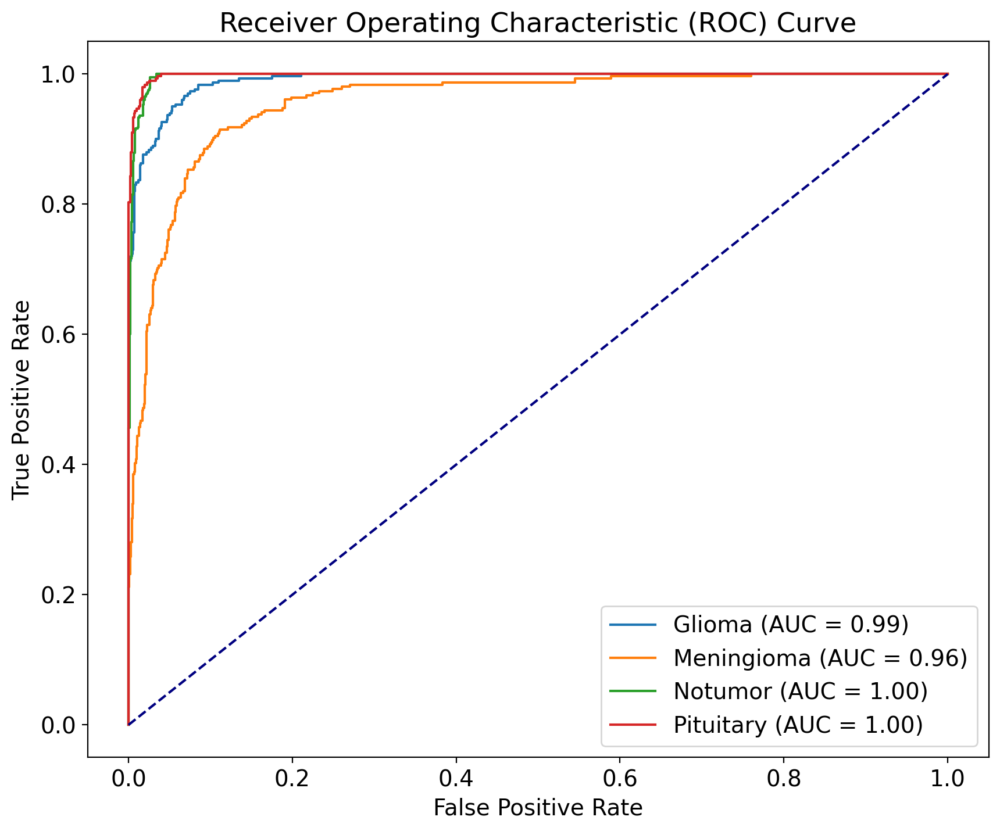

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step


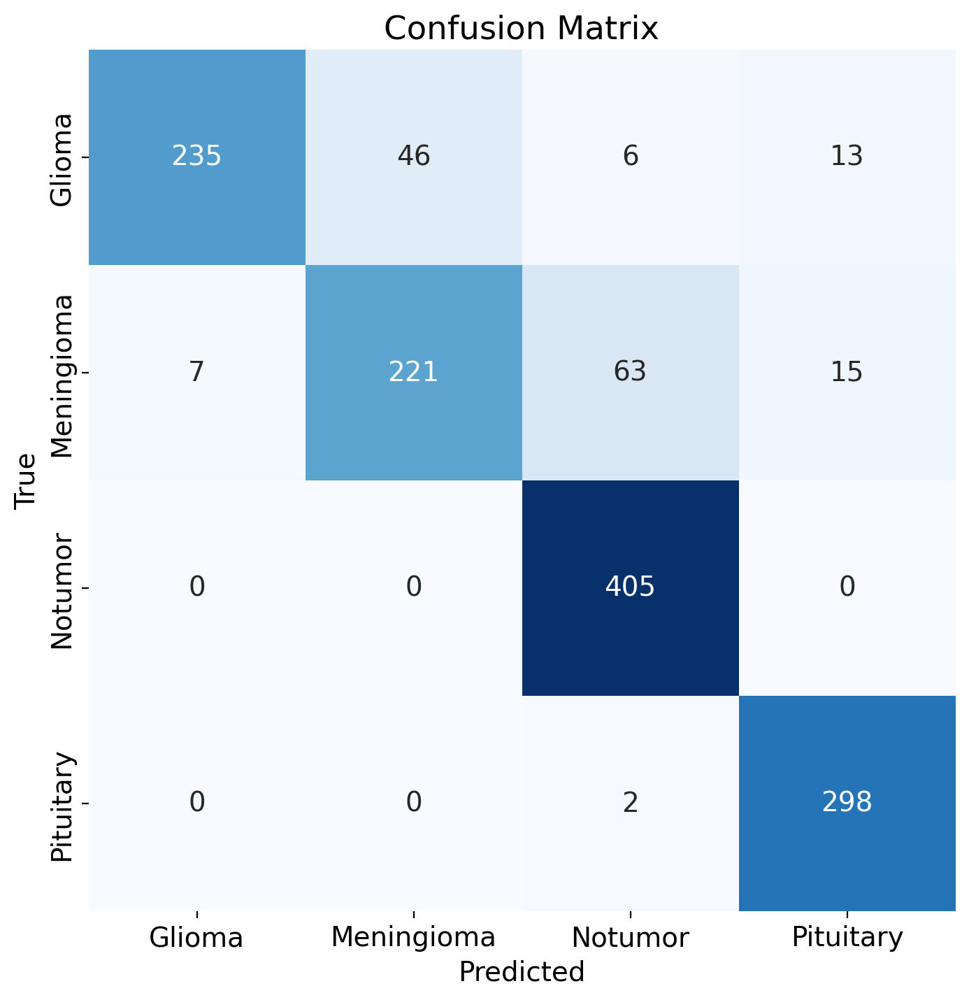

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.971074  0.783333  0.867159       300
  Meningioma   0.827715  0.722222  0.771379       306
     Notumor   0.850840  1.000000  0.919410       405
   Pituitary   0.914110  0.993333  0.952077       300

    accuracy                       0.884058      1311
   macro avg   0.890935  0.874722  0.877506      1311
weighted avg   0.887435  0.884058  0.880376      1311



In [14]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (3, 3), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(5, 5)),

    # Convolutional layer 2
    Conv2D(64, (3, 3), activation="relu"),
    MaxPooling2D(pool_size=(5, 5)),

    # Convolutional layer 3
    Conv2D(128, (3, 3), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_30 (Conv2D)              │ (None, 148, 148, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_20 (MaxPooling2D) │ (None, 24, 24, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_31 (Conv2D)              │ (None, 22, 22, 64)     │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_21 (MaxPooling2D) │ (None, 3, 3, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_32 (Conv2D)              │ (None, 1, 1, 128)      │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_10 (Flatten)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_10 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 161,348 (630.27 KB)

 Trainable params: 161,348 (630.27 KB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_30 has kernel size: (3, 3)
Layer conv2d_31 has kernel size: (3, 3)
Layer conv2d_32 has kernel size: (3, 3)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 47s 240ms/step - accuracy: 0.4506 - loss: 1.1164 - val_accuracy: 0.6508 - val_loss: 0.8848 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 3s 18ms/step - accuracy: 0.6875 - loss: 0.7811

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.6875 - loss: 0.7811 - val_accuracy: 1.0000 - val_loss: 0.2242 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.7461 - loss: 0.6270 - val_accuracy: 0.6766 - val_loss: 0.8106 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - accuracy: 0.7500 - loss: 0.5080 - val_accuracy: 1.0000 - val_loss: 0.2375 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 230ms/step - accuracy: 0.7922 - loss: 0.5058 - val_accuracy: 0.7930 - val_loss: 0.5227 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 373us/step - accuracy: 0.8125 - loss: 0.4639 - val_accuracy: 0.8710 - val_loss: 0.3500 - learning_rate: 0.0010
Epoch 7/64
172/178 ━━━━━━━━━━━━━━━━━━━━ 1s 217ms/step - accuracy: 0.8191 - loss: 0.4493
Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.8193 - loss: 0.4490

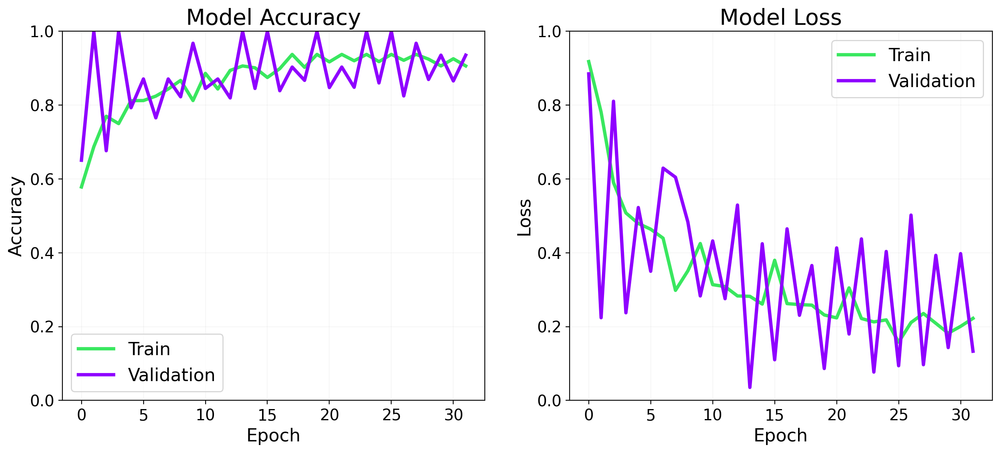

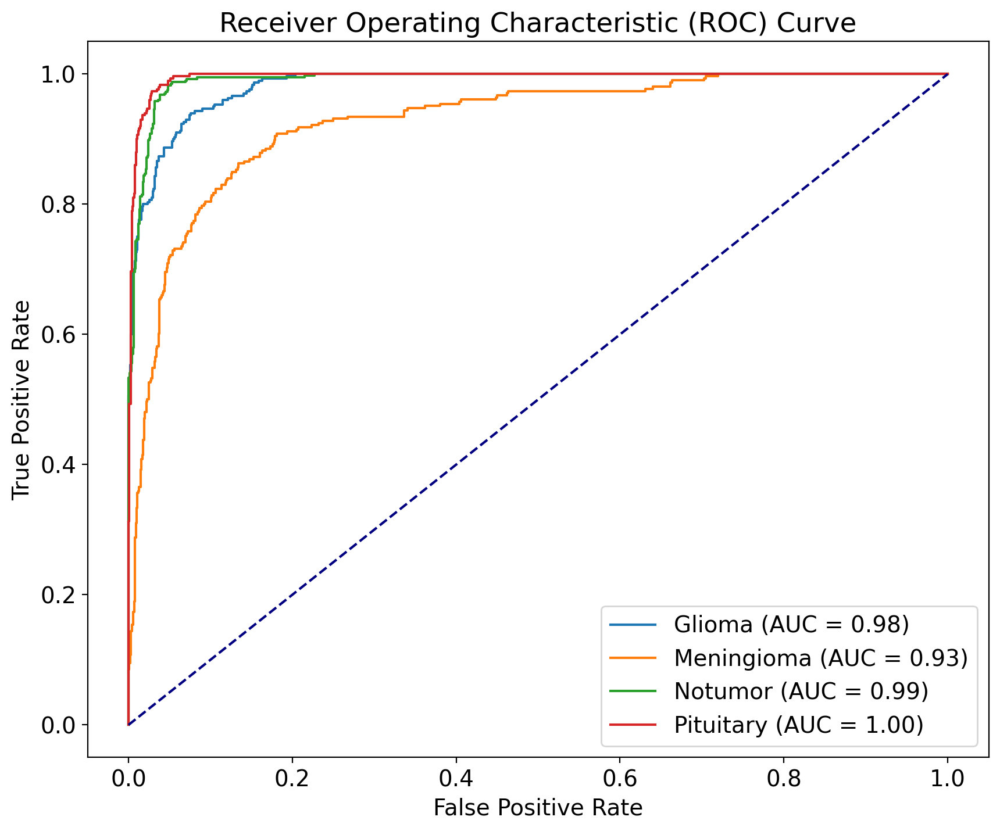

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step


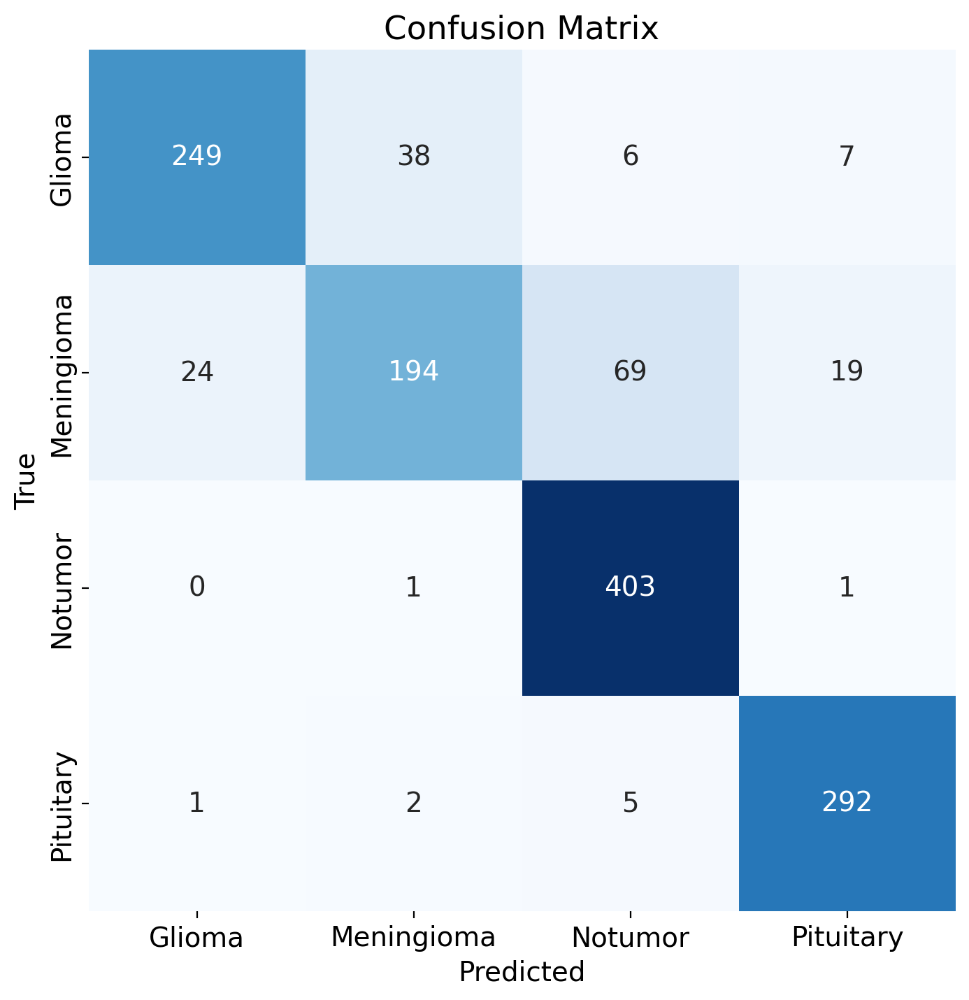

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.908759  0.830000  0.867596       300
  Meningioma   0.825532  0.633987  0.717190       306
     Notumor   0.834369  0.995062  0.907658       405
   Pituitary   0.915361  0.973333  0.943457       300

    accuracy                       0.868040      1311
   macro avg   0.871005  0.858095  0.858975      1311
weighted avg   0.867863  0.868040  0.862225      1311



In [15]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (3, 3), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(6, 6)),

    # Convolutional layer 2
    Conv2D(64, (3, 3), activation="relu"),
    MaxPooling2D(pool_size=(6, 6)),

    # Convolutional layer 3
    Conv2D(128, (3, 3), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))


/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_33 (Conv2D)              │ (None, 147, 147, 32)   │         1,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_22 (MaxPooling2D) │ (None, 73, 73, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_34 (Conv2D)              │ (None, 70, 70, 64)     │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_23 (MaxPooling2D) │ (None, 35, 35, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_35 (Conv2D)              │ (None, 32, 32, 128)    │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_11 (Flatten)            │ (None, 131072)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 512)            │    67,109,376 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_11 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 67,277,028 (256.64 MB)

 Trainable params: 67,277,028 (256.64 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_33 has kernel size: (4, 4)
Layer conv2d_34 has kernel size: (4, 4)
Layer conv2d_35 has kernel size: (4, 4)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 52s 260ms/step - accuracy: 0.5874 - loss: 1.0938 - val_accuracy: 0.7445 - val_loss: 0.7020 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 4s 23ms/step - accuracy: 0.7188 - loss: 0.5223

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 5ms/step - accuracy: 0.7188 - loss: 0.5223 - val_accuracy: 0.9355 - val_loss: 0.3816 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.8106 - loss: 0.4809 - val_accuracy: 0.8016 - val_loss: 0.4597 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - accuracy: 0.8750 - loss: 0.3343 - val_accuracy: 0.9677 - val_loss: 0.1869 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 43s 232ms/step - accuracy: 0.8693 - loss: 0.3557 - val_accuracy: 0.8266 - val_loss: 0.4845 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 324us/step - accuracy: 0.9375 - loss: 0.2654 - val_accuracy: 0.9355 - val_loss: 0.1849 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 43s 233ms/step - accuracy: 0.8927 - loss: 0.2804 - val_accuracy: 0.8750 - val_loss: 0.3065 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 260us/step - accuracy: 0.9062 - loss: 0.186

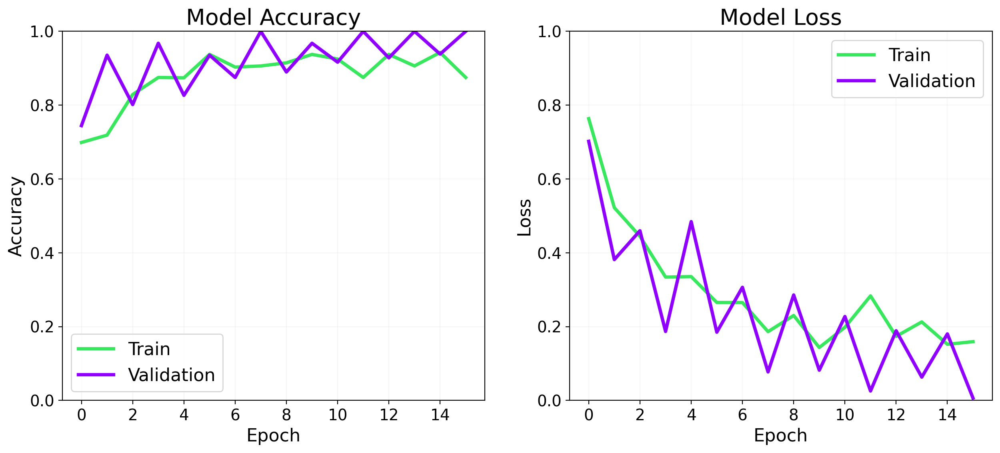

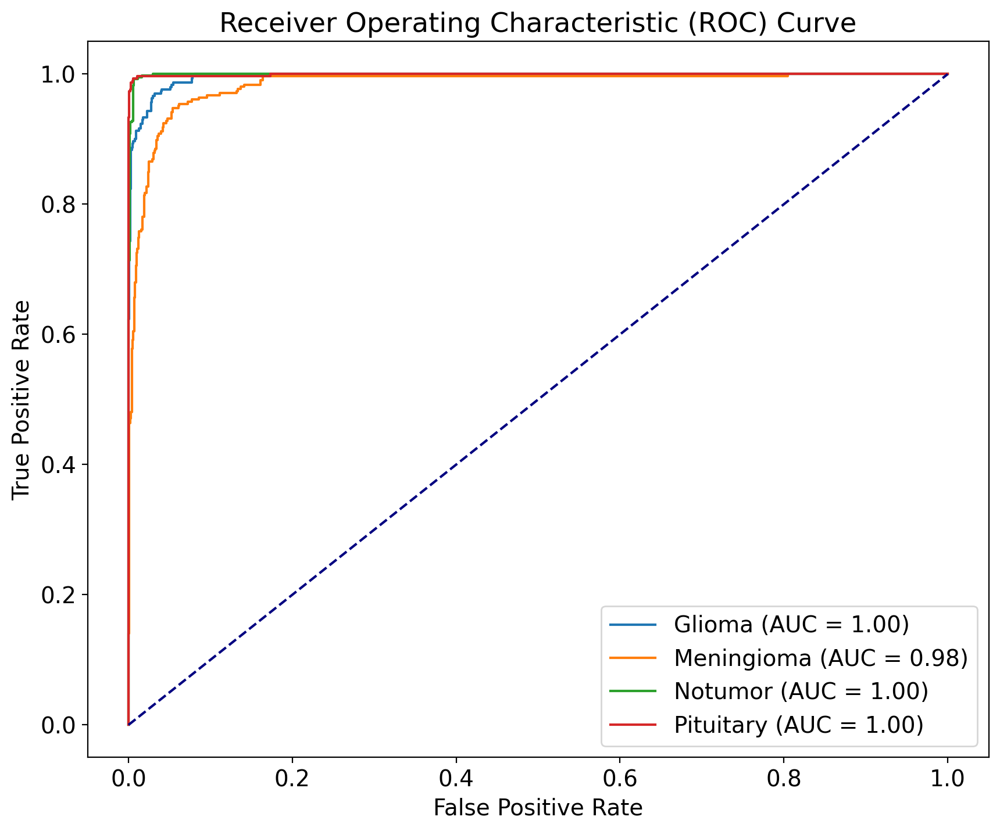

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step


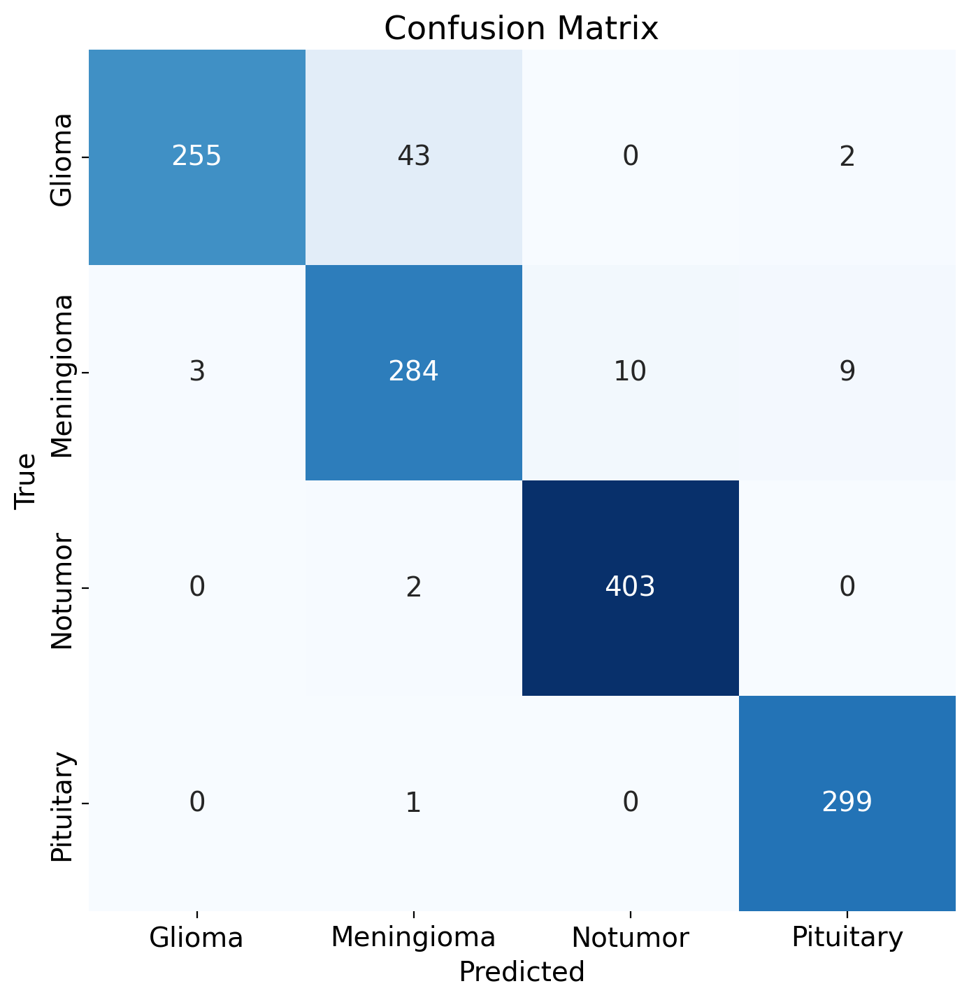

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.988372  0.850000  0.913978       300
  Meningioma   0.860606  0.928105  0.893082       306
     Notumor   0.975787  0.995062  0.985330       405
   Pituitary   0.964516  0.996667  0.980328       300

    accuracy                       0.946606      1311
   macro avg   0.947320  0.942458  0.943180      1311
weighted avg   0.949203  0.946606  0.946326      1311



In [16]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (4, 4), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 2
    Conv2D(64, (4, 4), activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 3
    Conv2D(128, (4, 4), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_12"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_36 (Conv2D)              │ (None, 147, 147, 32)   │         1,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_24 (MaxPooling2D) │ (None, 49, 49, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_37 (Conv2D)              │ (None, 46, 46, 64)     │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_25 (MaxPooling2D) │ (None, 15, 15, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_38 (Conv2D)              │ (None, 12, 12, 128)    │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_12 (Flatten)            │ (None, 18432)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_24 (Dense)                │ (None, 512)            │     9,437,696 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 9,605,348 (36.64 MB)

 Trainable params: 9,605,348 (36.64 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_36 has kernel size: (4, 4)
Layer conv2d_37 has kernel size: (4, 4)
Layer conv2d_38 has kernel size: (4, 4)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 49s 247ms/step - accuracy: 0.5802 - loss: 0.9885 - val_accuracy: 0.7164 - val_loss: 0.8220 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.7500 - loss: 0.5338

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7500 - loss: 0.5338 - val_accuracy: 0.7742 - val_loss: 0.6181 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 223ms/step - accuracy: 0.8212 - loss: 0.4547 - val_accuracy: 0.8016 - val_loss: 0.4632 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 336us/step - accuracy: 0.8750 - loss: 0.3442 - val_accuracy: 1.0000 - val_loss: 0.0610 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 230ms/step - accuracy: 0.8646 - loss: 0.3460 - val_accuracy: 0.8477 - val_loss: 0.3467 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 355us/step - accuracy: 0.9062 - loss: 0.2309 - val_accuracy: 0.9677 - val_loss: 0.0809 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - accuracy: 0.8946 - loss: 0.2800 - val_accuracy: 0.8547 - val_loss: 0.4042 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 329us/step - accuracy: 0.9375 - loss: 0.267

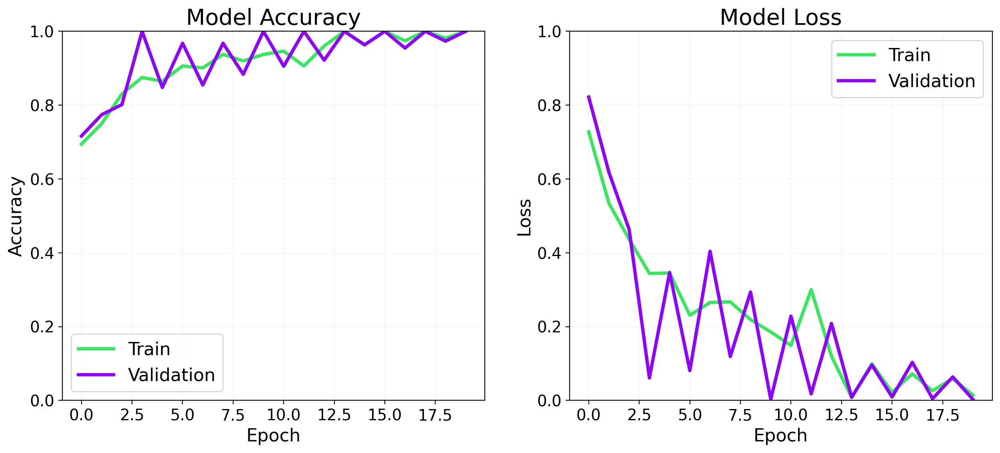

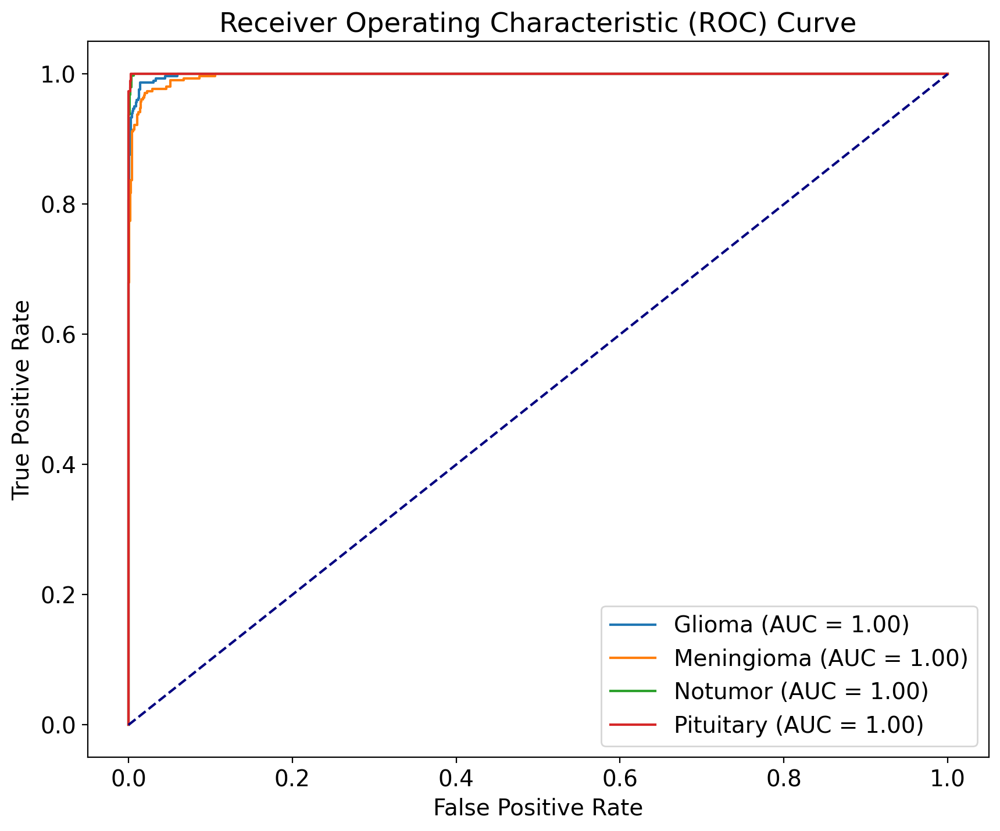

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step


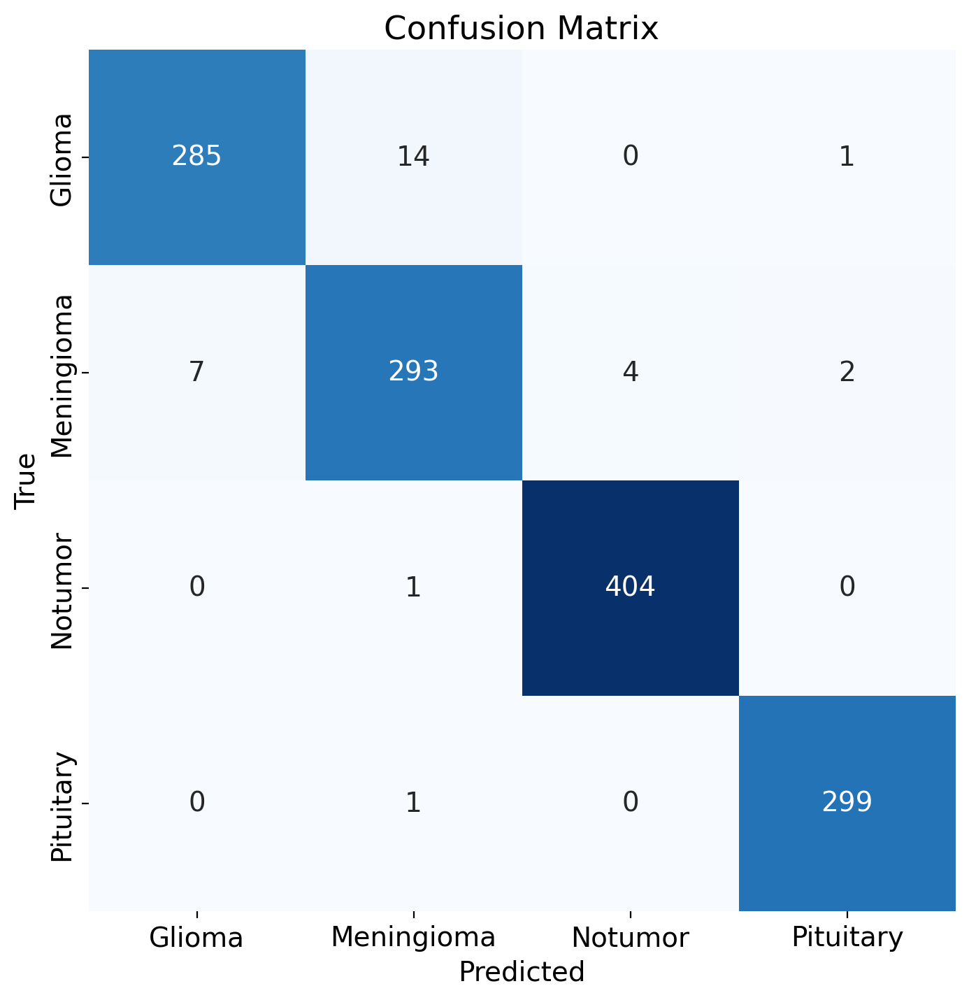

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 60ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.976027  0.950000  0.962838       300
  Meningioma   0.948220  0.957516  0.952846       306
     Notumor   0.990196  0.997531  0.993850       405
   Pituitary   0.990066  0.996667  0.993355       300

    accuracy                       0.977117      1311
   macro avg   0.976127  0.975428  0.975722      1311
weighted avg   0.977126  0.977117  0.977069      1311



In [17]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (4, 4), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 2
    Conv2D(64, (4, 4), activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 3
    Conv2D(128, (4, 4), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_13"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_39 (Conv2D)              │ (None, 147, 147, 32)   │         1,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_26 (MaxPooling2D) │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_40 (Conv2D)              │ (None, 33, 33, 64)     │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_27 (MaxPooling2D) │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_41 (Conv2D)              │ (None, 5, 5, 128)      │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_13 (Flatten)            │ (None, 3200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 512)            │     1,638,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_13 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,806,564 (6.89 MB)

 Trainable params: 1,806,564 (6.89 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_39 has kernel size: (4, 4)
Layer conv2d_40 has kernel size: (4, 4)
Layer conv2d_41 has kernel size: (4, 4)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 50s 251ms/step - accuracy: 0.5499 - loss: 0.9858 - val_accuracy: 0.7297 - val_loss: 0.7340 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.8125 - loss: 0.4239

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.8125 - loss: 0.4239 - val_accuracy: 0.8387 - val_loss: 0.4497 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 225ms/step - accuracy: 0.8098 - loss: 0.5003 - val_accuracy: 0.8109 - val_loss: 0.4756 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 343us/step - accuracy: 0.9062 - loss: 0.3414 - val_accuracy: 1.0000 - val_loss: 0.1665 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - accuracy: 0.8401 - loss: 0.4071 - val_accuracy: 0.8211 - val_loss: 0.4530 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - accuracy: 0.8750 - loss: 0.3234 - val_accuracy: 0.9677 - val_loss: 0.0852 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.8855 - loss: 0.3004 - val_accuracy: 0.8680 - val_loss: 0.3285 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - accuracy: 0.8750 - loss: 0.297

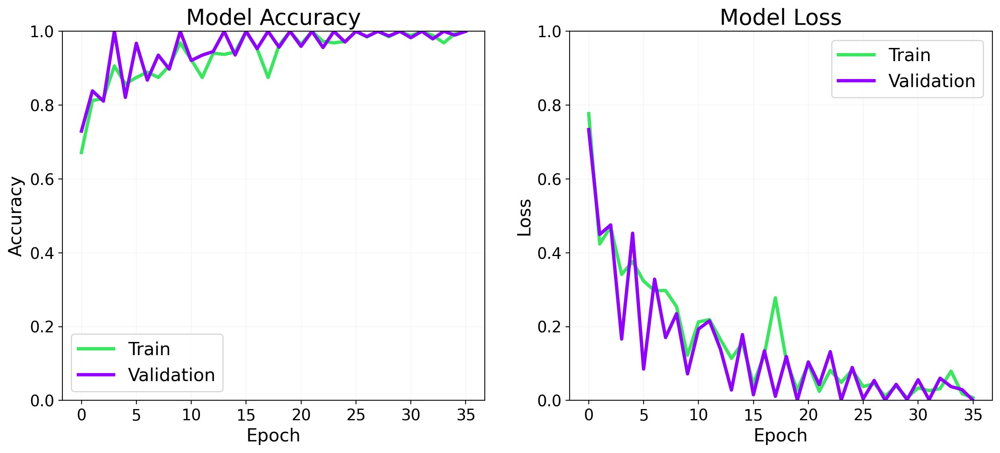

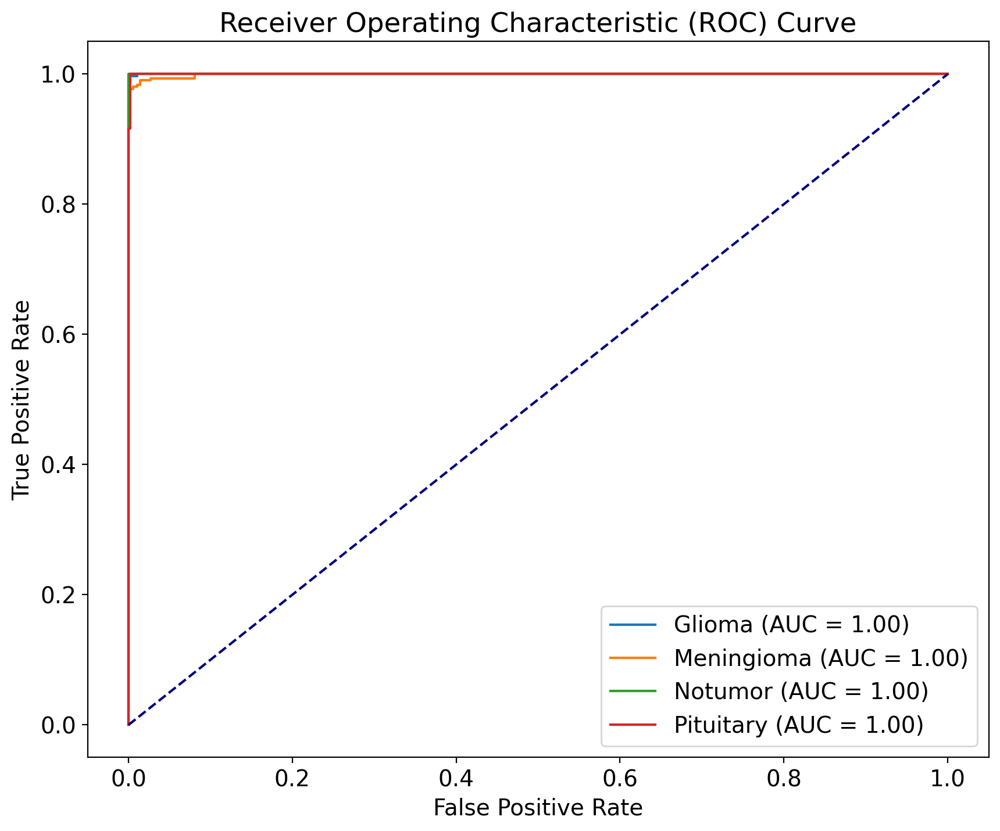

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step


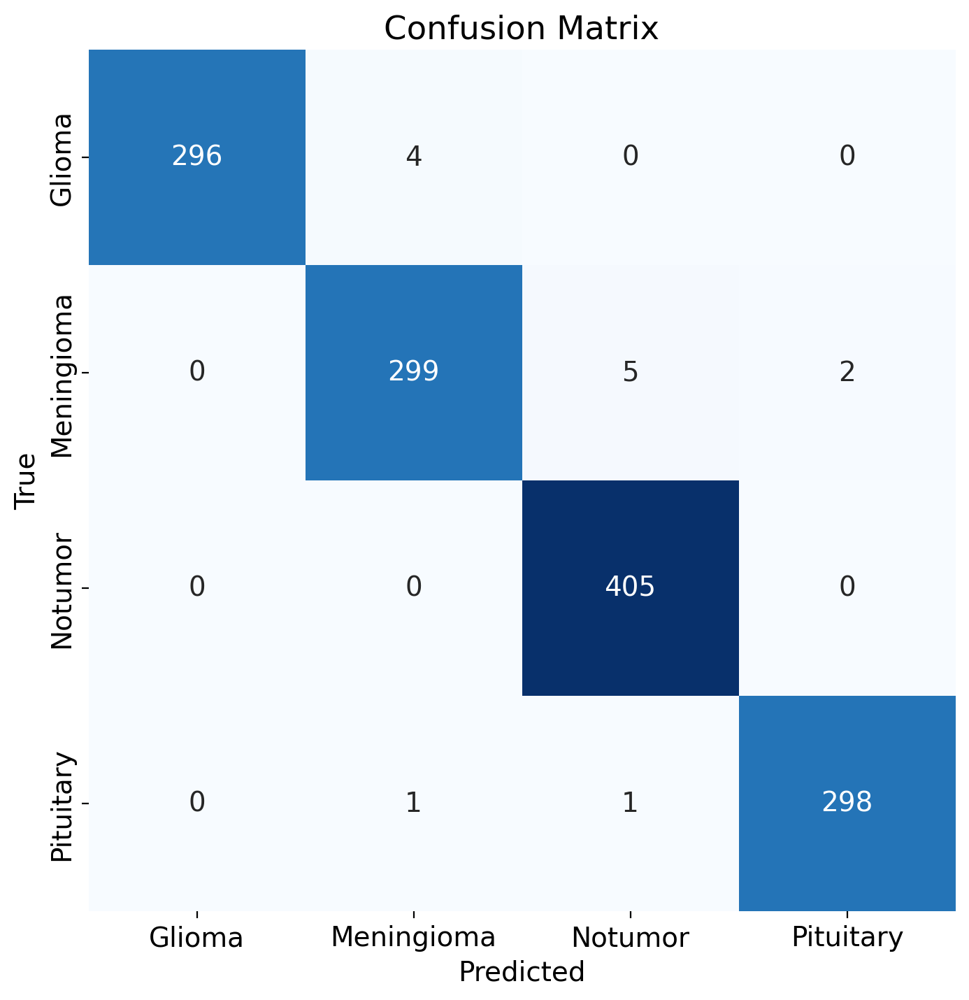

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   1.000000  0.986667  0.993289       300
  Meningioma   0.983553  0.977124  0.980328       306
     Notumor   0.985401  1.000000  0.992647       405
   Pituitary   0.993333  0.993333  0.993333       300

    accuracy                       0.990084      1311
   macro avg   0.990572  0.989281  0.989899      1311
weighted avg   0.990126  0.990084  0.990075      1311



In [18]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (4, 4), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 2
    Conv2D(64, (4, 4), activation="relu"),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 3
    Conv2D(128, (4, 4), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_14"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_42 (Conv2D)              │ (None, 147, 147, 32)   │         1,568 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_28 (MaxPooling2D) │ (None, 29, 29, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_43 (Conv2D)              │ (None, 26, 26, 64)     │        32,832 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_29 (MaxPooling2D) │ (None, 5, 5, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_44 (Conv2D)              │ (None, 2, 2, 128)      │       131,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_14 (Flatten)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_28 (Dense)                │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_14 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 430,308 (1.64 MB)

 Trainable params: 430,308 (1.64 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_42 has kernel size: (4, 4)
Layer conv2d_43 has kernel size: (4, 4)
Layer conv2d_44 has kernel size: (4, 4)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - accuracy: 0.5103 - loss: 1.0488 - val_accuracy: 0.7391 - val_loss: 0.6650 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 1s 9ms/step - accuracy: 0.7188 - loss: 0.6358

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7188 - loss: 0.6358 - val_accuracy: 1.0000 - val_loss: 0.2203 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 229ms/step - accuracy: 0.7871 - loss: 0.5439 - val_accuracy: 0.7563 - val_loss: 0.6095 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 420us/step - accuracy: 0.9062 - loss: 0.3210 - val_accuracy: 0.9032 - val_loss: 0.4918 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.8104 - loss: 0.4505 - val_accuracy: 0.8102 - val_loss: 0.4545 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 387us/step - accuracy: 0.7500 - loss: 0.5193 - val_accuracy: 0.9677 - val_loss: 0.2364 - learning_rate: 0.0010
Epoch 7/64
172/178 ━━━━━━━━━━━━━━━━━━━━ 1s 219ms/step - accuracy: 0.8586 - loss: 0.3668
Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
178/178 ━━━━━━━━━━━━━━━━━━━━ 82s 225ms/step - accuracy: 0.8590 - loss: 0.3660

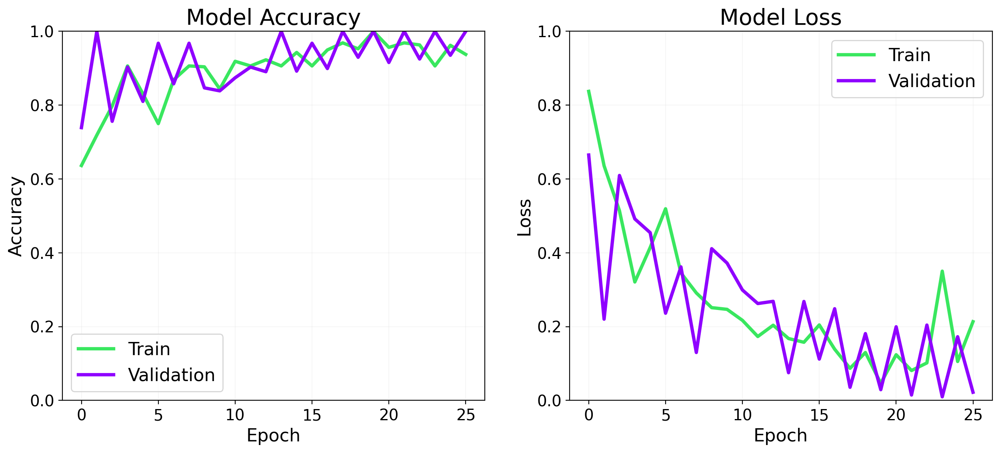

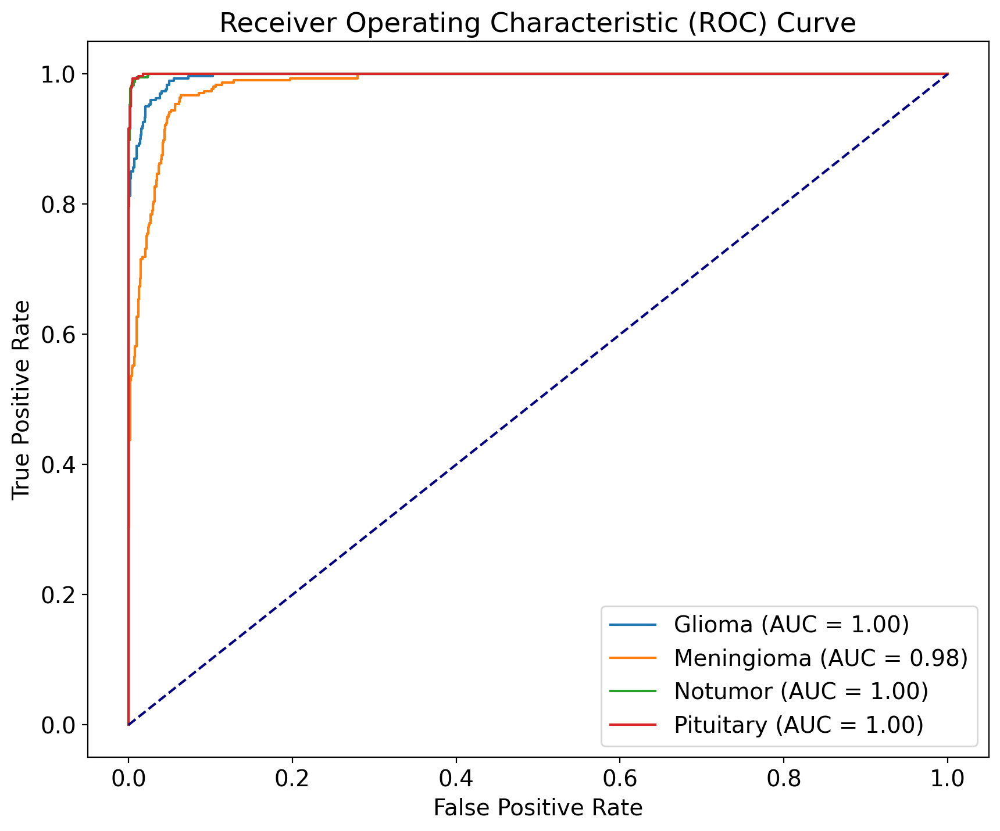

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step


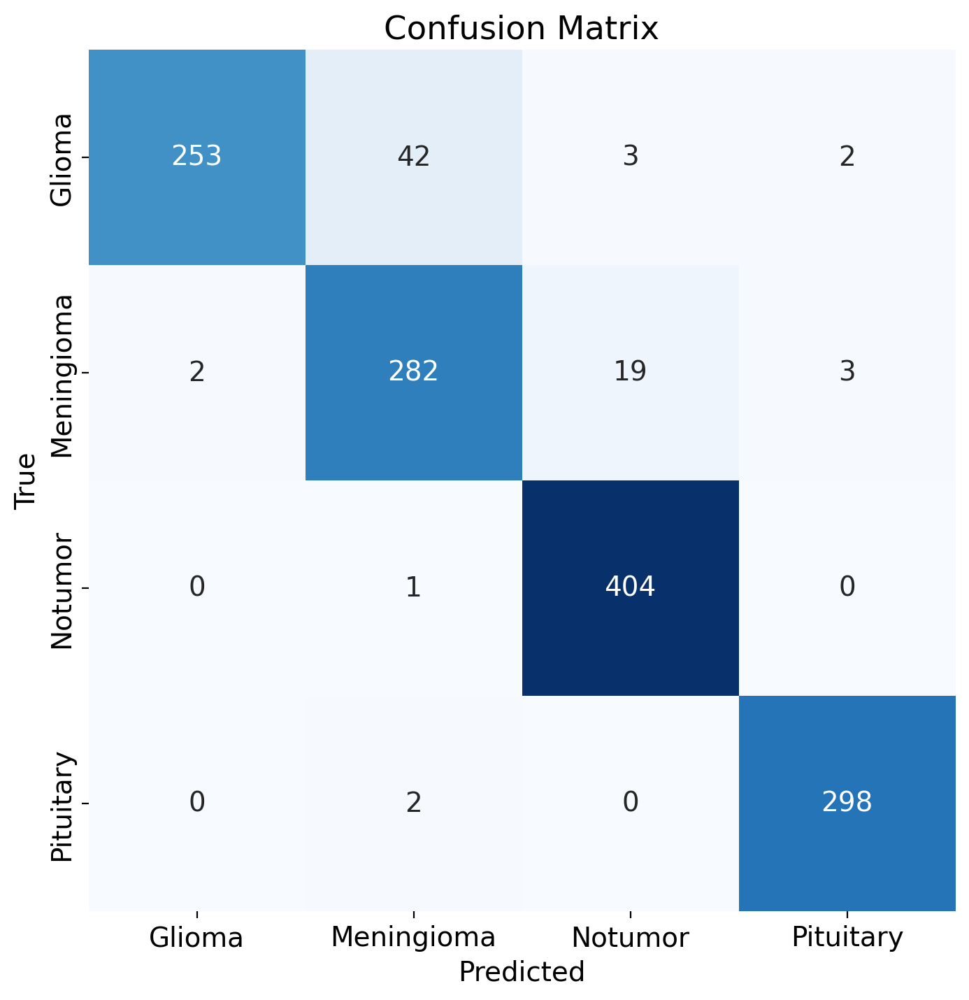

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.992157  0.843333  0.911712       300
  Meningioma   0.862385  0.921569  0.890995       306
     Notumor   0.948357  0.997531  0.972323       405
   Pituitary   0.983498  0.993333  0.988391       300

    accuracy                       0.943555      1311
   macro avg   0.946599  0.938942  0.940855      1311
weighted avg   0.946355  0.943555  0.943147      1311



In [19]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (4, 4), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(5, 5)),

    # Convolutional layer 2
    Conv2D(64, (4, 4), activation="relu"),
    MaxPooling2D(pool_size=(5, 5)),

    # Convolutional layer 3
    Conv2D(128, (4, 4), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_15"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_45 (Conv2D)              │ (None, 146, 146, 32)   │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_30 (MaxPooling2D) │ (None, 73, 73, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_46 (Conv2D)              │ (None, 69, 69, 64)     │        51,264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_31 (MaxPooling2D) │ (None, 34, 34, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_47 (Conv2D)              │ (None, 30, 30, 128)    │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_15 (Flatten)            │ (None, 115200)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 512)            │    58,982,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_15 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 59,243,588 (226.00 MB)

 Trainable params: 59,243,588 (226.00 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_45 has kernel size: (5, 5)
Layer conv2d_46 has kernel size: (5, 5)
Layer conv2d_47 has kernel size: (5, 5)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 53s 261ms/step - accuracy: 0.5764 - loss: 1.2294 - val_accuracy: 0.7547 - val_loss: 0.5757 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 3s 22ms/step - accuracy: 0.7500 - loss: 0.4418

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7500 - loss: 0.4418 - val_accuracy: 0.9032 - val_loss: 0.2899 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 228ms/step - accuracy: 0.8315 - loss: 0.4298 - val_accuracy: 0.8313 - val_loss: 0.4320 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 288us/step - accuracy: 0.8438 - loss: 0.3595 - val_accuracy: 1.0000 - val_loss: 0.1373 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 43s 234ms/step - accuracy: 0.8711 - loss: 0.3296 - val_accuracy: 0.8750 - val_loss: 0.3749 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 301us/step - accuracy: 0.8438 - loss: 0.3360 - val_accuracy: 1.0000 - val_loss: 0.0579 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 43s 230ms/step - accuracy: 0.9127 - loss: 0.2438 - val_accuracy: 0.9031 - val_loss: 0.2545 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 277us/step - accuracy: 0.9375 - loss: 0.158

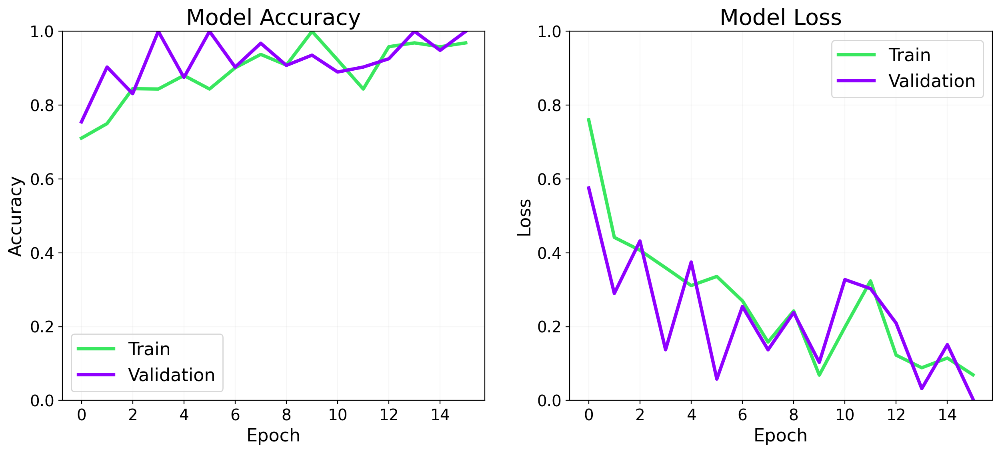

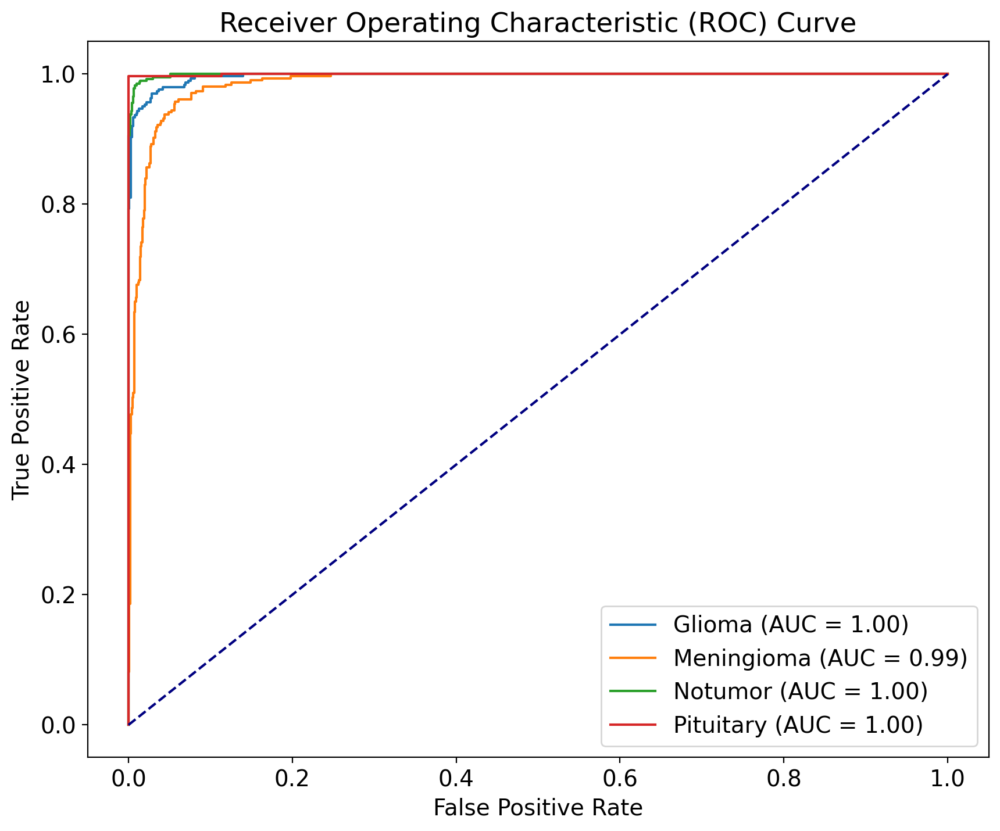

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 64ms/step


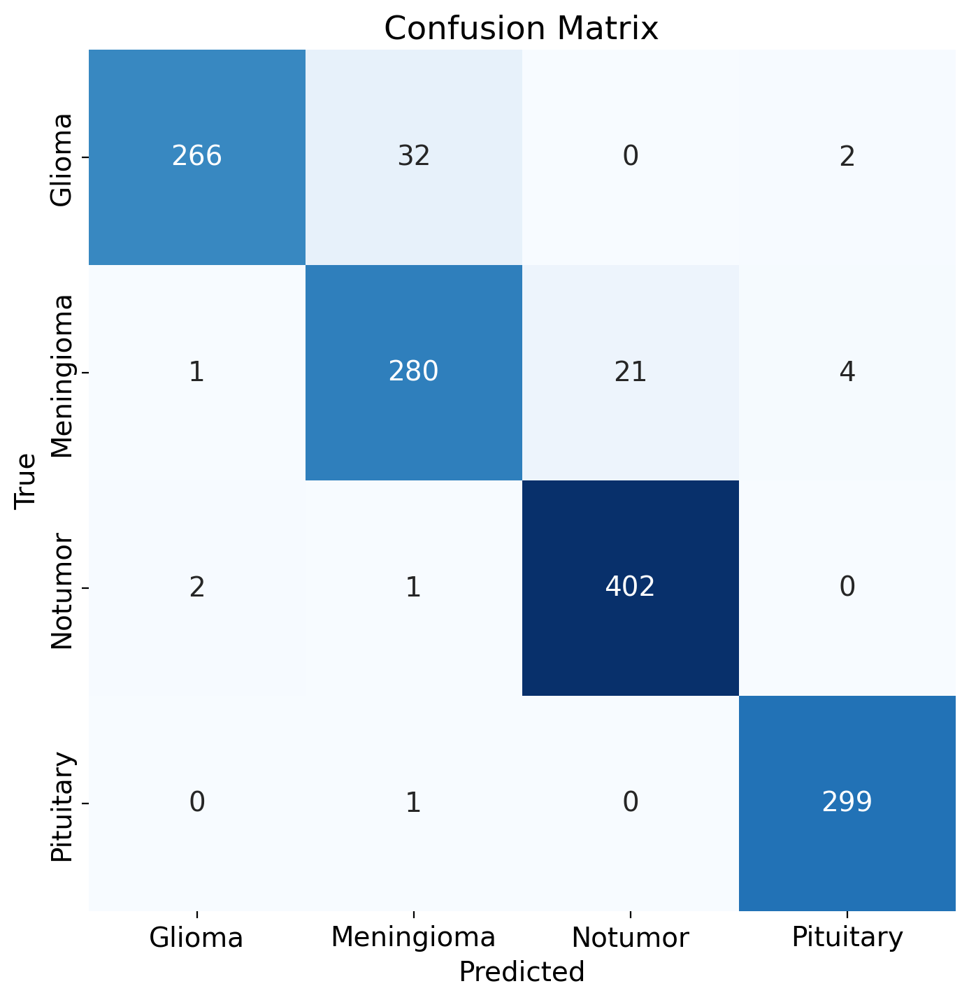

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.988848  0.886667  0.934974       300
  Meningioma   0.891720  0.915033  0.903226       306
     Notumor   0.950355  0.992593  0.971014       405
   Pituitary   0.980328  0.996667  0.988430       300

    accuracy                       0.951182      1311
   macro avg   0.952812  0.947740  0.949411      1311
weighted avg   0.952336  0.951182  0.950930      1311



In [20]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (5, 5), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 2
    Conv2D(64, (5, 5), activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 3
    Conv2D(128, (5, 5), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_48 (Conv2D)              │ (None, 146, 146, 32)   │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_32 (MaxPooling2D) │ (None, 48, 48, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_49 (Conv2D)              │ (None, 44, 44, 64)     │        51,264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_33 (MaxPooling2D) │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_50 (Conv2D)              │ (None, 10, 10, 128)    │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_16 (Flatten)            │ (None, 12800)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_32 (Dense)                │ (None, 512)            │     6,554,112 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_16 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,814,788 (26.00 MB)

 Trainable params: 6,814,788 (26.00 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_48 has kernel size: (5, 5)
Layer conv2d_49 has kernel size: (5, 5)
Layer conv2d_50 has kernel size: (5, 5)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 50s 254ms/step - accuracy: 0.5595 - loss: 0.9786 - val_accuracy: 0.7578 - val_loss: 0.6781 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.8125 - loss: 0.4811

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8125 - loss: 0.4811 - val_accuracy: 0.9677 - val_loss: 0.1972 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - accuracy: 0.8243 - loss: 0.4652 - val_accuracy: 0.7781 - val_loss: 0.6498 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - accuracy: 0.8750 - loss: 0.2589 - val_accuracy: 0.6129 - val_loss: 1.0237 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 222ms/step - accuracy: 0.8622 - loss: 0.3664 - val_accuracy: 0.8391 - val_loss: 0.4001 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - accuracy: 0.8438 - loss: 0.3646 - val_accuracy: 1.0000 - val_loss: 0.0876 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 224ms/step - accuracy: 0.8855 - loss: 0.3147 - val_accuracy: 0.8898 - val_loss: 0.2856 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - accuracy: 0.9688 - loss: 0.164

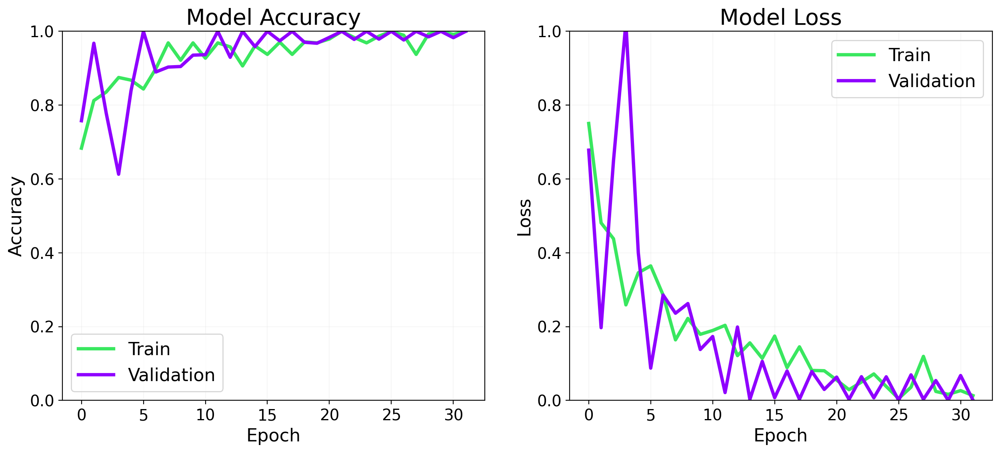

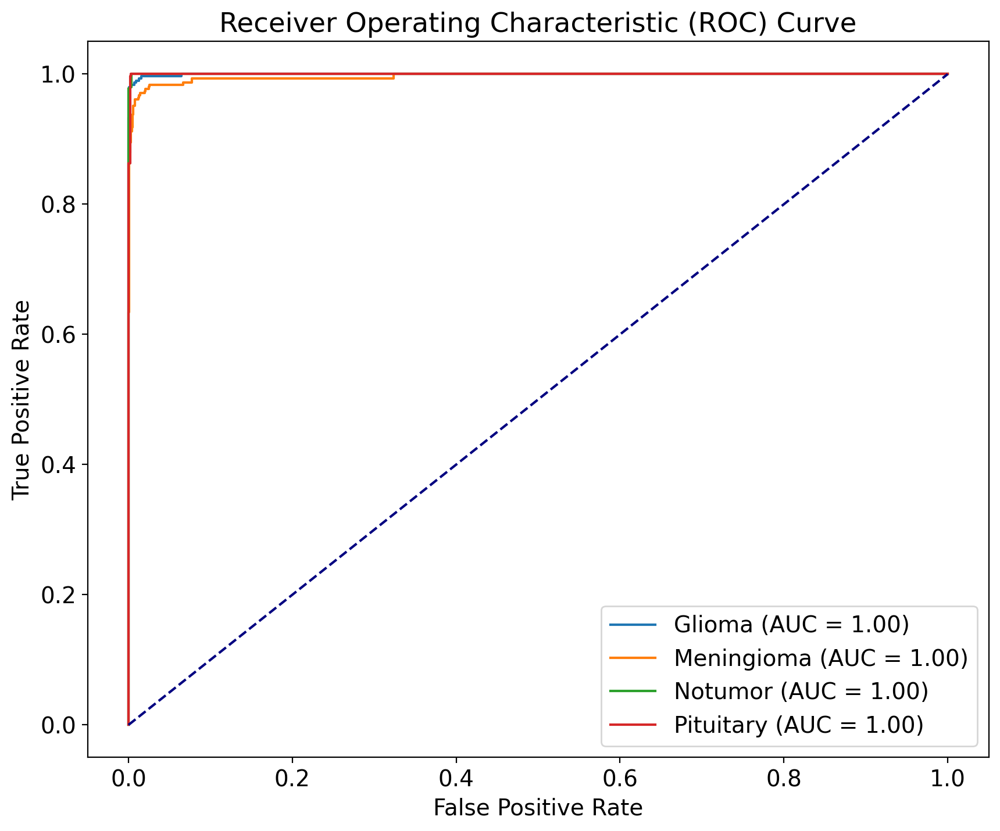

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 67ms/step


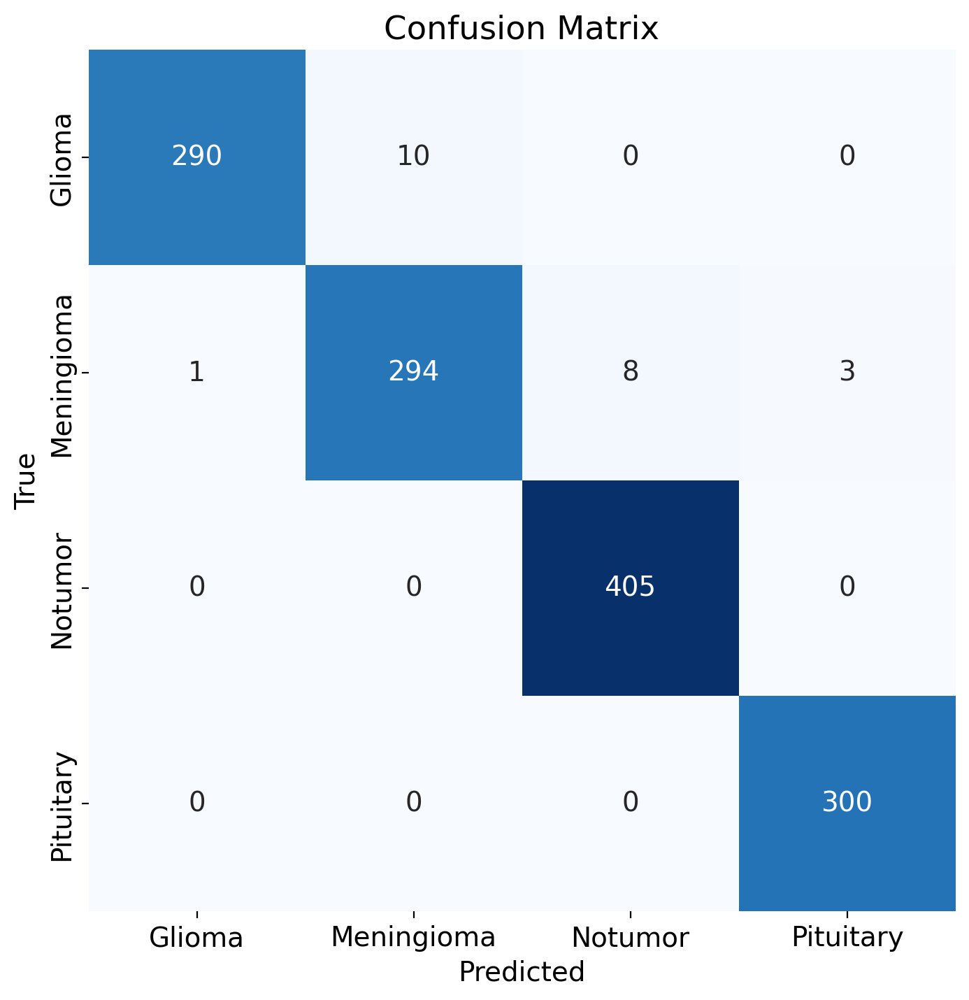

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.996564  0.966667  0.981387       300
  Meningioma   0.967105  0.960784  0.963934       306
     Notumor   0.980630  1.000000  0.990220       405
   Pituitary   0.990099  1.000000  0.995025       300

    accuracy                       0.983219      1311
   macro avg   0.983599  0.981863  0.982642      1311
weighted avg   0.983286  0.983219  0.983163      1311



In [21]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (5, 5), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 2
    Conv2D(64, (5, 5), activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 3
    Conv2D(128, (5, 5), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_17"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_51 (Conv2D)              │ (None, 146, 146, 32)   │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_34 (MaxPooling2D) │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_52 (Conv2D)              │ (None, 32, 32, 64)     │        51,264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_35 (MaxPooling2D) │ (None, 8, 8, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_53 (Conv2D)              │ (None, 4, 4, 128)      │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_17 (Flatten)            │ (None, 2048)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 512)            │     1,049,088 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_17 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,309,764 (5.00 MB)

 Trainable params: 1,309,764 (5.00 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_51 has kernel size: (5, 5)
Layer conv2d_52 has kernel size: (5, 5)
Layer conv2d_53 has kernel size: (5, 5)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 49s 244ms/step - accuracy: 0.5357 - loss: 1.0307 - val_accuracy: 0.6797 - val_loss: 0.7839 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 1s 11ms/step - accuracy: 0.6562 - loss: 0.7067

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.6562 - loss: 0.7067 - val_accuracy: 1.0000 - val_loss: 0.3233 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 223ms/step - accuracy: 0.8067 - loss: 0.5186 - val_accuracy: 0.7859 - val_loss: 0.4820 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 342us/step - accuracy: 0.8750 - loss: 0.4914 - val_accuracy: 0.9677 - val_loss: 0.2104 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - accuracy: 0.8481 - loss: 0.3900 - val_accuracy: 0.8031 - val_loss: 0.5033 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 323us/step - accuracy: 0.9062 - loss: 0.3214 - val_accuracy: 0.9032 - val_loss: 0.3982 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.8819 - loss: 0.3061 - val_accuracy: 0.8398 - val_loss: 0.3806 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 333us/step - accuracy: 0.9688 - loss: 0.177

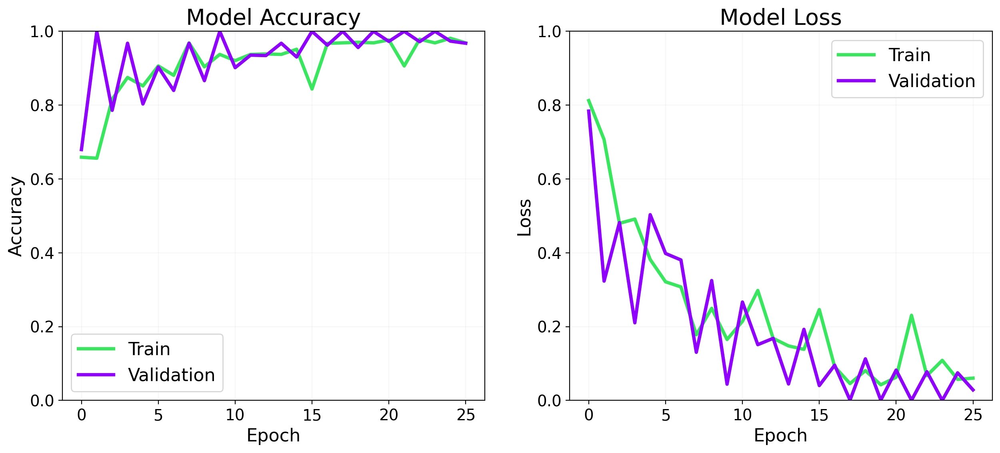

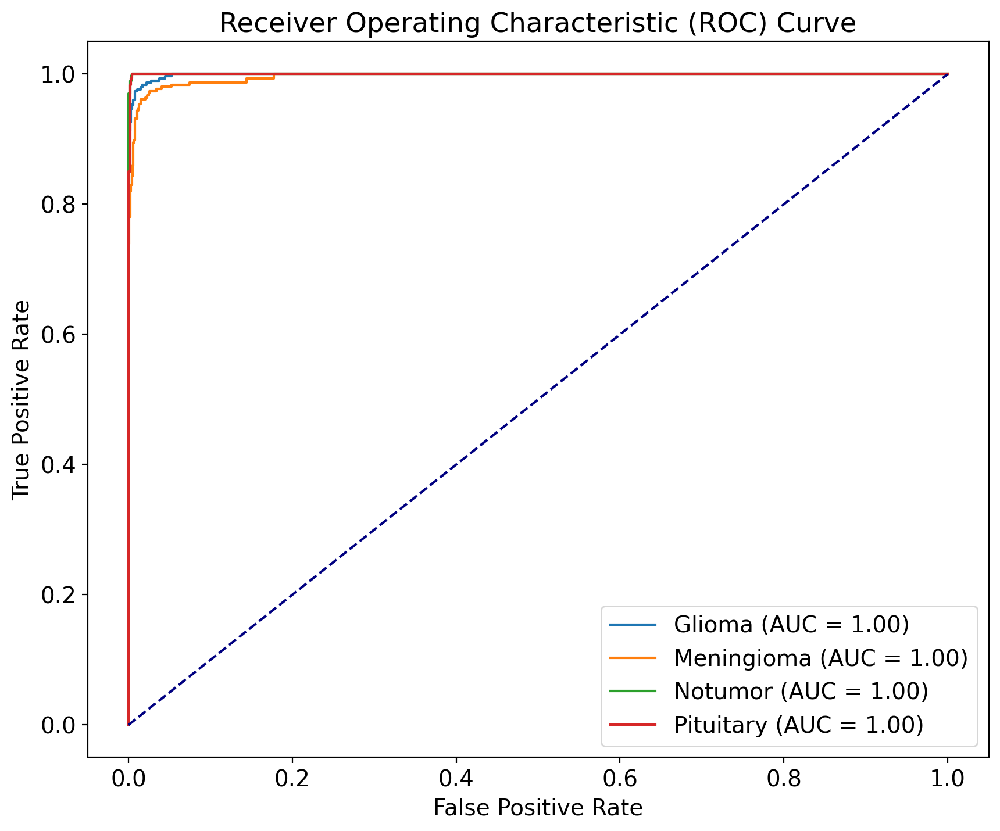

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step


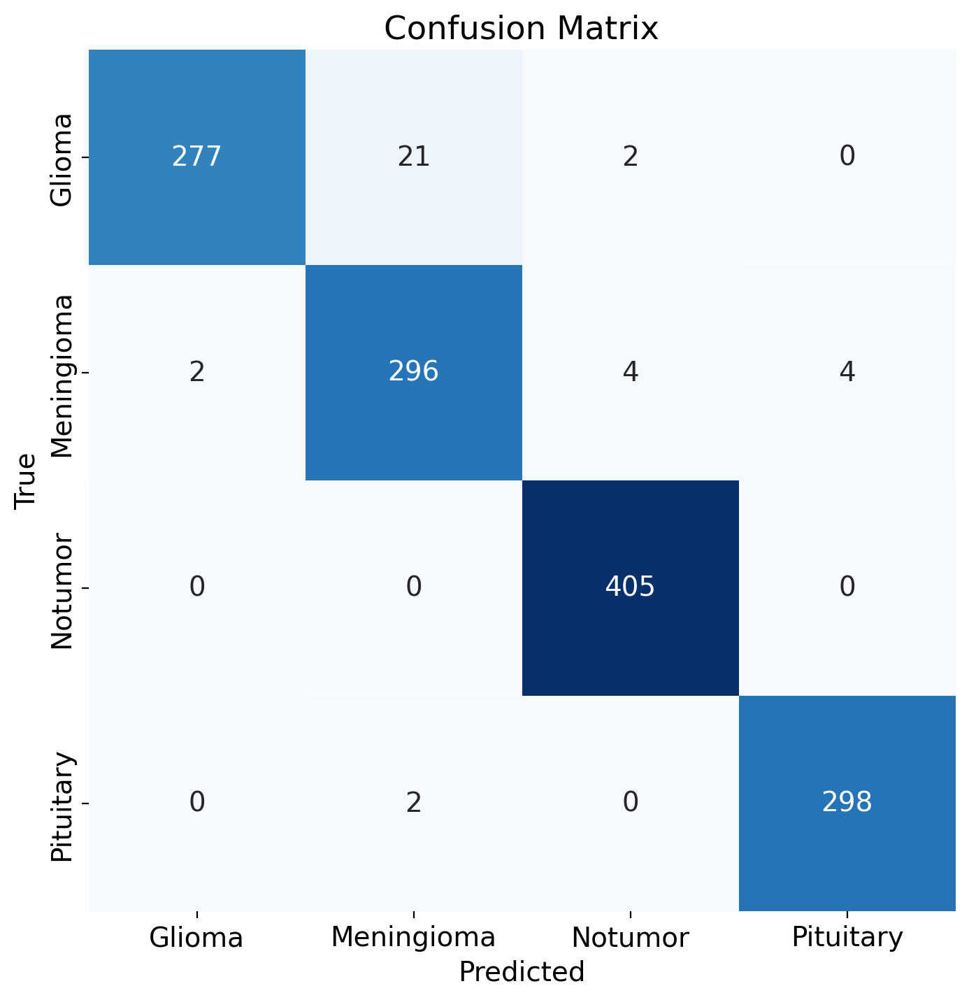

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.992832  0.923333  0.956822       300
  Meningioma   0.927900  0.967320  0.947200       306
     Notumor   0.985401  1.000000  0.992647       405
   Pituitary   0.986755  0.993333  0.990033       300

    accuracy                       0.973303      1311
   macro avg   0.973222  0.970997  0.971676      1311
weighted avg   0.973990  0.973303  0.973243      1311



In [22]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (5, 5), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 2
    Conv2D(64, (5, 5), activation="relu"),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 3
    Conv2D(128, (5, 5), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_18"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_54 (Conv2D)              │ (None, 146, 146, 32)   │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_36 (MaxPooling2D) │ (None, 29, 29, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_55 (Conv2D)              │ (None, 25, 25, 64)     │        51,264 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_37 (MaxPooling2D) │ (None, 5, 5, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_56 (Conv2D)              │ (None, 1, 1, 128)      │       204,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_18 (Flatten)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_18 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 326,724 (1.25 MB)

 Trainable params: 326,724 (1.25 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_54 has kernel size: (5, 5)
Layer conv2d_55 has kernel size: (5, 5)
Layer conv2d_56 has kernel size: (5, 5)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - accuracy: 0.5372 - loss: 0.9940 - val_accuracy: 0.7266 - val_loss: 0.8559 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 1s 10ms/step - accuracy: 0.8438 - loss: 0.3774

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.8438 - loss: 0.3774 - val_accuracy: 0.9355 - val_loss: 0.1980 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 43s 234ms/step - accuracy: 0.7789 - loss: 0.5369 - val_accuracy: 0.7047 - val_loss: 0.7368 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 376us/step - accuracy: 0.8125 - loss: 0.4147 - val_accuracy: 1.0000 - val_loss: 0.0776 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 43s 231ms/step - accuracy: 0.8393 - loss: 0.4218 - val_accuracy: 0.8086 - val_loss: 0.4591 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 368us/step - accuracy: 0.8750 - loss: 0.3314 - val_accuracy: 1.0000 - val_loss: 0.1152 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 43s 231ms/step - accuracy: 0.8651 - loss: 0.3569 - val_accuracy: 0.8195 - val_loss: 0.5322 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 335us/step - accuracy: 0.8750 - loss: 0.401

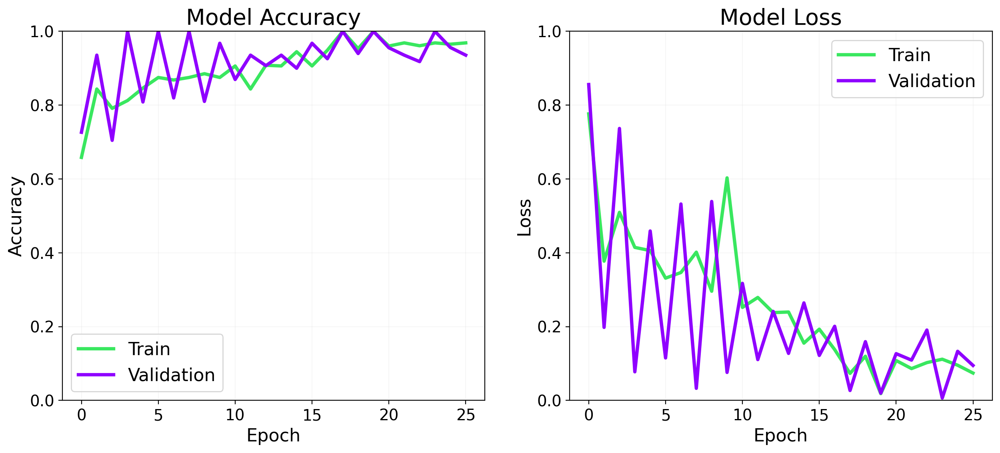

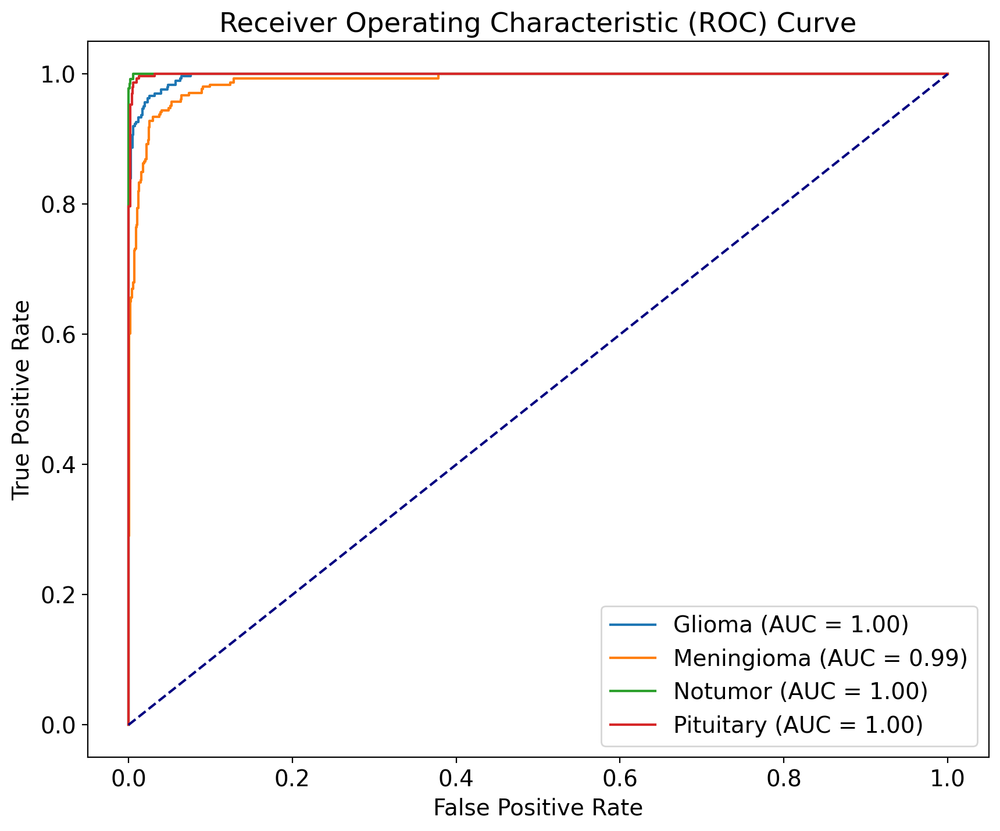

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step


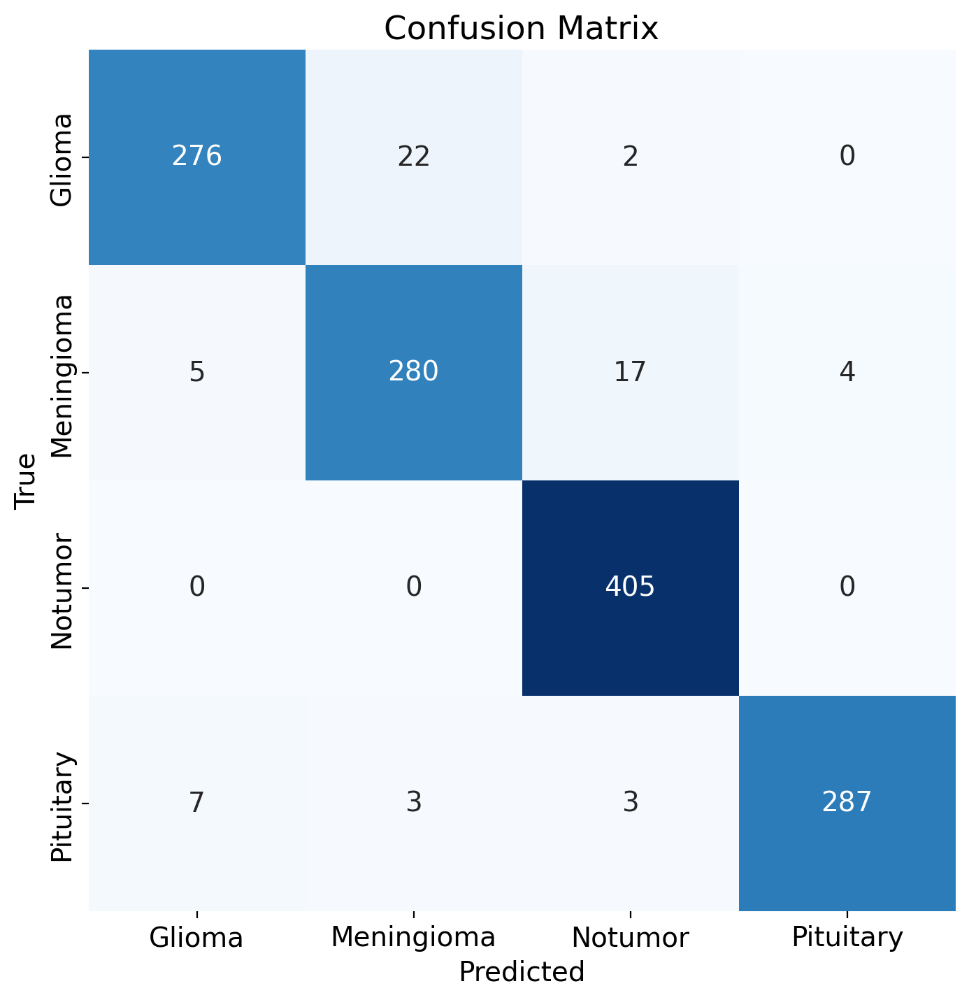

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.958333  0.920000  0.938776       300
  Meningioma   0.918033  0.915033  0.916530       306
     Notumor   0.948478  1.000000  0.973558       405
   Pituitary   0.986254  0.956667  0.971235       300

    accuracy                       0.951945      1311
   macro avg   0.952775  0.947925  0.950025      1311
weighted avg   0.952271  0.951945  0.951756      1311



In [23]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (5, 5), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(5, 5)),

    # Convolutional layer 2
    Conv2D(64, (5, 5), activation="relu"),
    MaxPooling2D(pool_size=(5, 5)),

    # Convolutional layer 3
    Conv2D(128, (5, 5), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_19"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_57 (Conv2D)              │ (None, 145, 145, 32)   │         3,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_38 (MaxPooling2D) │ (None, 72, 72, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_58 (Conv2D)              │ (None, 67, 67, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_39 (MaxPooling2D) │ (None, 33, 33, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_59 (Conv2D)              │ (None, 28, 28, 128)    │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_19 (Flatten)            │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 512)            │    51,380,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_19 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 51,755,108 (197.43 MB)

 Trainable params: 51,755,108 (197.43 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_57 has kernel size: (6, 6)
Layer conv2d_58 has kernel size: (6, 6)
Layer conv2d_59 has kernel size: (6, 6)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 52s 259ms/step - accuracy: 0.5748 - loss: 1.0158 - val_accuracy: 0.7469 - val_loss: 0.6563 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - accuracy: 0.7500 - loss: 0.5296

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.7500 - loss: 0.5296 - val_accuracy: 0.4516 - val_loss: 1.0580 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 228ms/step - accuracy: 0.7992 - loss: 0.5015 - val_accuracy: 0.8352 - val_loss: 0.4283 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 356us/step - accuracy: 0.7500 - loss: 0.5627 - val_accuracy: 0.9355 - val_loss: 0.3099 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 228ms/step - accuracy: 0.8513 - loss: 0.3853 - val_accuracy: 0.8109 - val_loss: 0.4389 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 268us/step - accuracy: 0.9062 - loss: 0.2530 - val_accuracy: 0.9355 - val_loss: 0.2586 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 229ms/step - accuracy: 0.8804 - loss: 0.3031 - val_accuracy: 0.8438 - val_loss: 0.4056 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - accuracy: 0.9375 - loss: 0.232

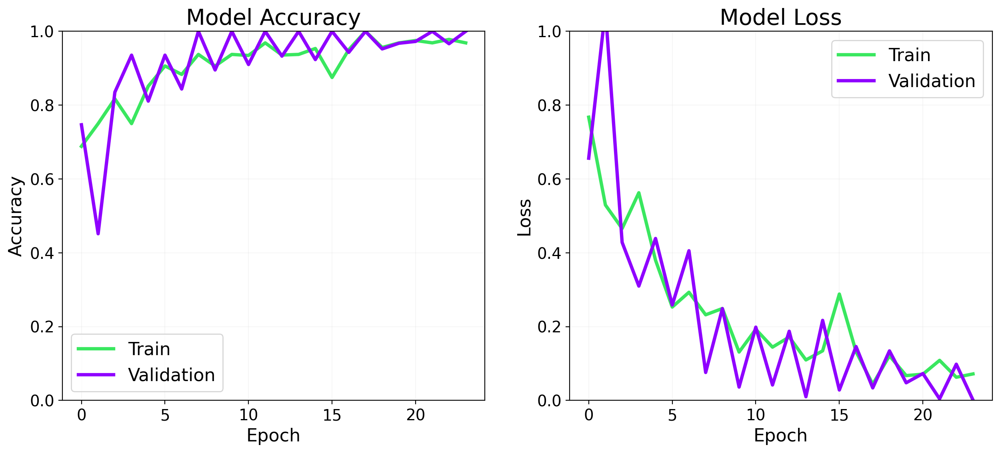

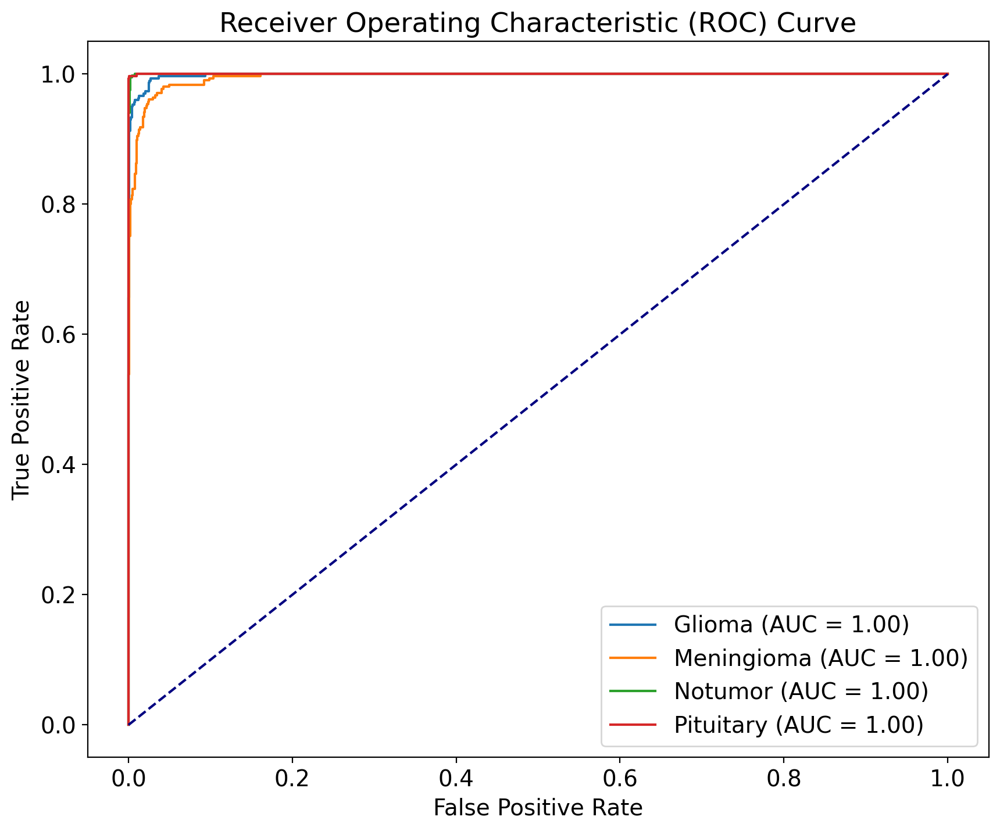

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step


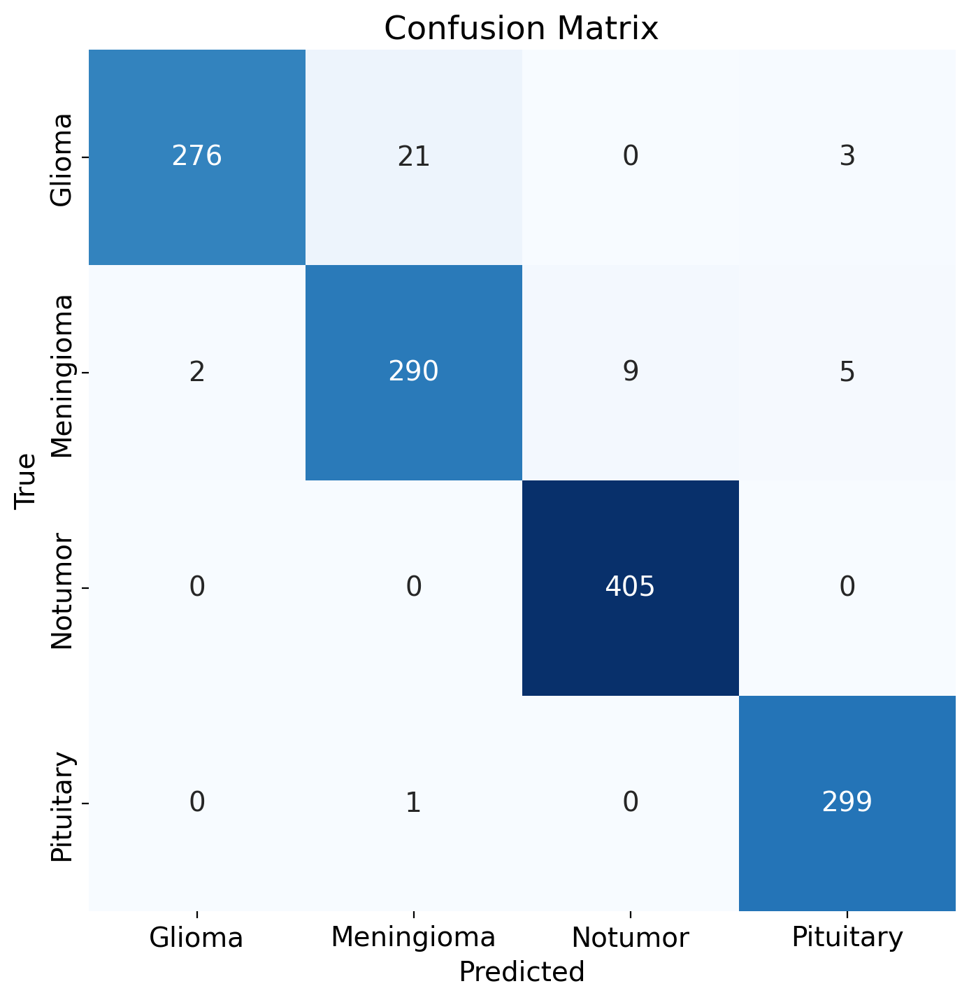

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.992806  0.920000  0.955017       300
  Meningioma   0.929487  0.947712  0.938511       306
     Notumor   0.978261  1.000000  0.989011       405
   Pituitary   0.973941  0.996667  0.985173       300

    accuracy                       0.968726      1311
   macro avg   0.968624  0.966095  0.966928      1311
weighted avg   0.969217  0.968726  0.968567      1311



In [24]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (6, 6), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 2
    Conv2D(64, (6, 6), activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 3
    Conv2D(128, (6, 6), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_20"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_60 (Conv2D)              │ (None, 145, 145, 32)   │         3,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_40 (MaxPooling2D) │ (None, 48, 48, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_61 (Conv2D)              │ (None, 43, 43, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_41 (MaxPooling2D) │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_62 (Conv2D)              │ (None, 9, 9, 128)      │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_20 (Flatten)            │ (None, 10368)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_40 (Dense)                │ (None, 512)            │     5,308,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_20 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,683,300 (21.68 MB)

 Trainable params: 5,683,300 (21.68 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_60 has kernel size: (6, 6)
Layer conv2d_61 has kernel size: (6, 6)
Layer conv2d_62 has kernel size: (6, 6)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 51s 257ms/step - accuracy: 0.5143 - loss: 1.0404 - val_accuracy: 0.7258 - val_loss: 0.6260 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.7500 - loss: 0.4540

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7500 - loss: 0.4540 - val_accuracy: 0.9032 - val_loss: 0.3230 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - accuracy: 0.8029 - loss: 0.5091 - val_accuracy: 0.8109 - val_loss: 0.4501 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 310us/step - accuracy: 0.7500 - loss: 0.4384 - val_accuracy: 1.0000 - val_loss: 0.1221 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 230ms/step - accuracy: 0.8562 - loss: 0.3629 - val_accuracy: 0.8164 - val_loss: 0.4770 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - accuracy: 0.9375 - loss: 0.2540 - val_accuracy: 0.9677 - val_loss: 0.0700 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.8834 - loss: 0.3026 - val_accuracy: 0.8836 - val_loss: 0.2855 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - accuracy: 0.8750 - loss: 0.188

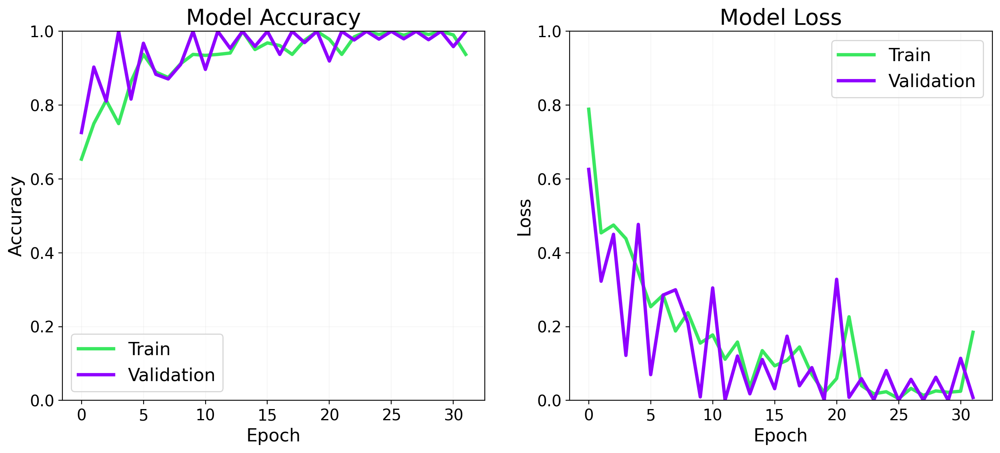

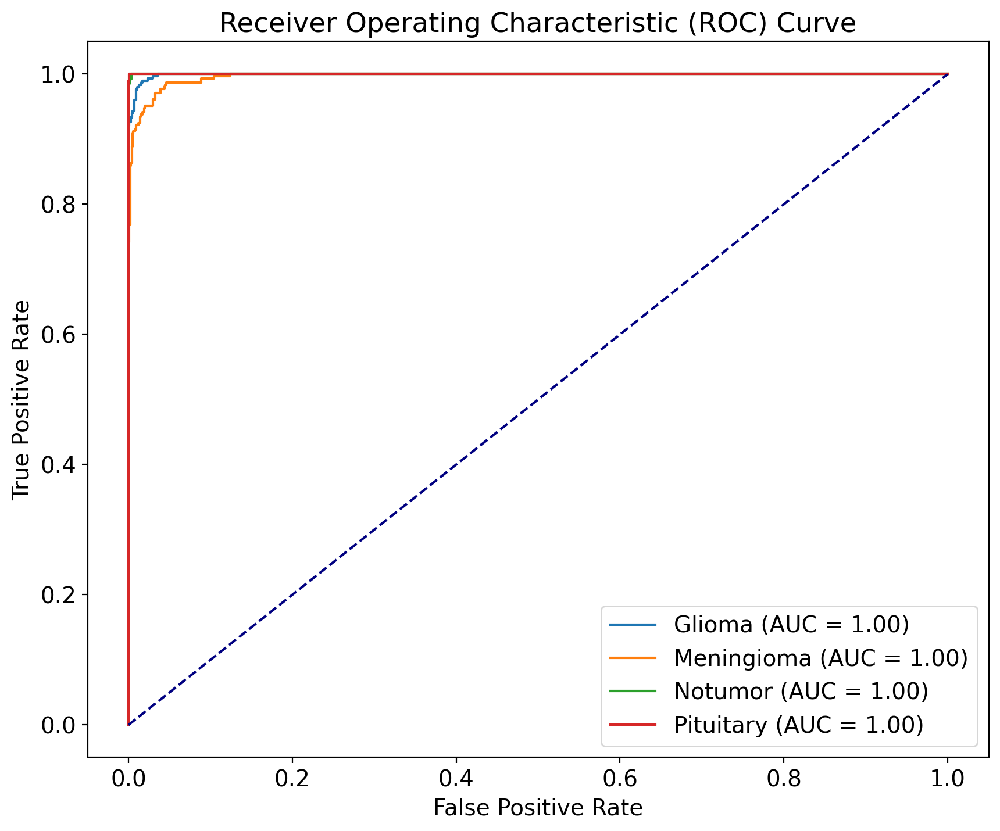

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step


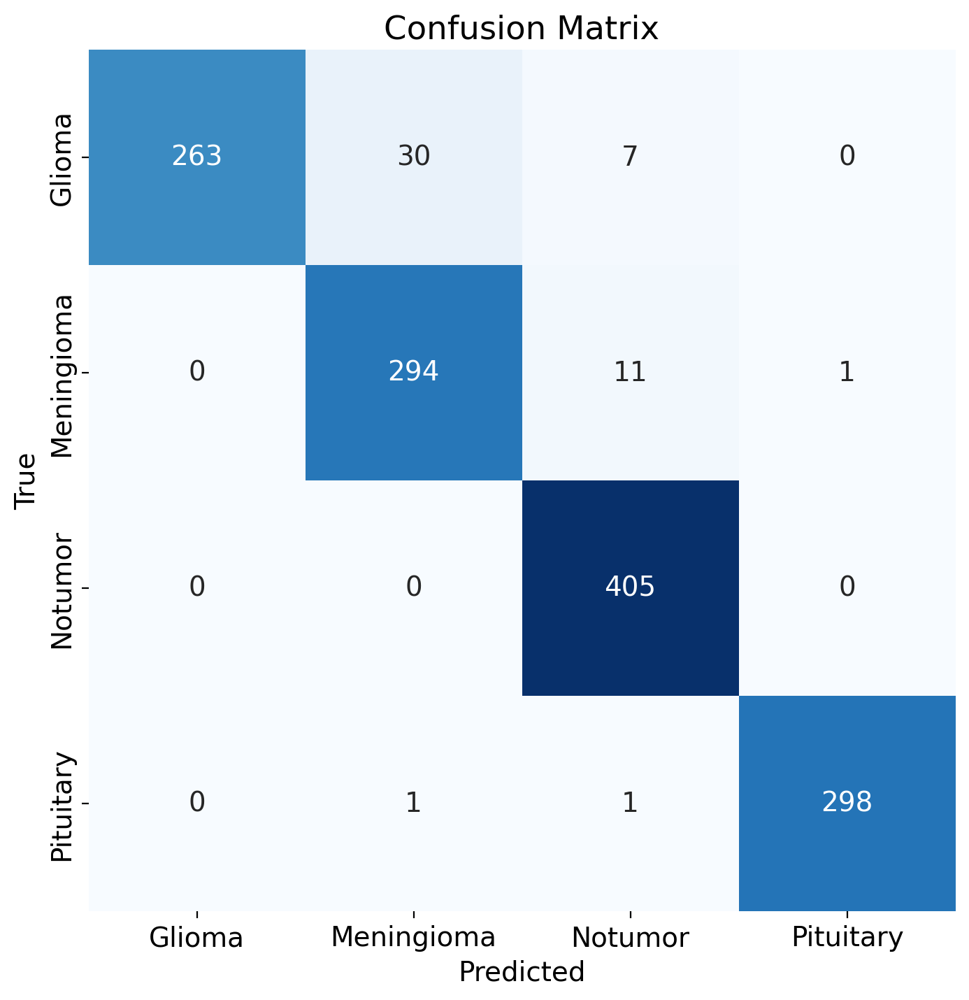

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   1.000000  0.876667  0.934281       300
  Meningioma   0.904615  0.960784  0.931854       306
     Notumor   0.955189  1.000000  0.977081       405
   Pituitary   0.996656  0.993333  0.994992       300

    accuracy                       0.961098      1311
   macro avg   0.964115  0.957696  0.959552      1311
weighted avg   0.963128  0.961098  0.960829      1311



In [25]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (6, 6), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 2
    Conv2D(64, (6, 6), activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 3
    Conv2D(128, (6, 6), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_21"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_63 (Conv2D)              │ (None, 145, 145, 32)   │         3,488 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_42 (MaxPooling2D) │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_64 (Conv2D)              │ (None, 31, 31, 64)     │        73,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_43 (MaxPooling2D) │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_65 (Conv2D)              │ (None, 2, 2, 128)      │       295,040 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_21 (Flatten)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_21 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 637,028 (2.43 MB)

 Trainable params: 637,028 (2.43 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_63 has kernel size: (6, 6)
Layer conv2d_64 has kernel size: (6, 6)
Layer conv2d_65 has kernel size: (6, 6)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 48s 242ms/step - accuracy: 0.5237 - loss: 1.0022 - val_accuracy: 0.7391 - val_loss: 0.6114 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.7812 - loss: 0.4205

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - accuracy: 0.7812 - loss: 0.4205 - val_accuracy: 0.9032 - val_loss: 0.3438 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.8014 - loss: 0.5058 - val_accuracy: 0.8109 - val_loss: 0.4932 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - accuracy: 0.9062 - loss: 0.2465 - val_accuracy: 0.9355 - val_loss: 0.2491 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.8535 - loss: 0.3861 - val_accuracy: 0.8336 - val_loss: 0.4231 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 327us/step - accuracy: 0.8750 - loss: 0.2151 - val_accuracy: 0.8710 - val_loss: 0.2957 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 226ms/step - accuracy: 0.8894 - loss: 0.2978 - val_accuracy: 0.8531 - val_loss: 0.3788 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - accuracy: 0.9062 - loss: 0.202

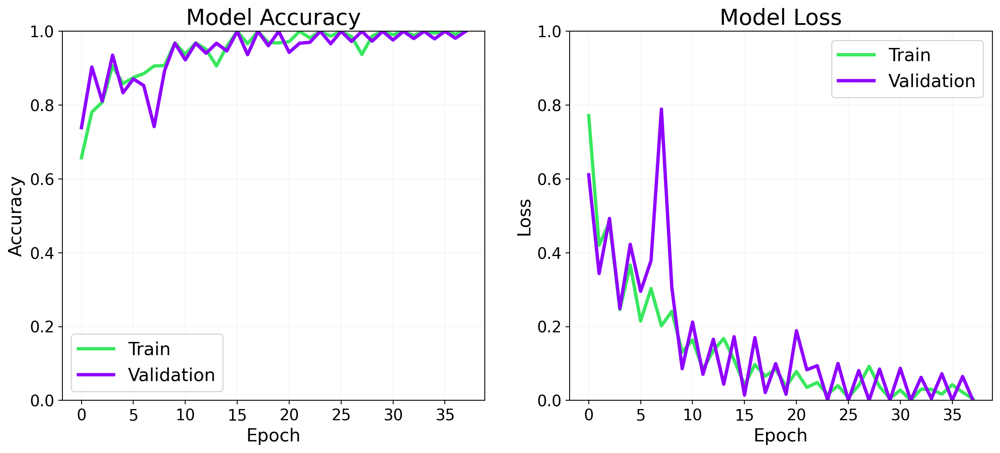

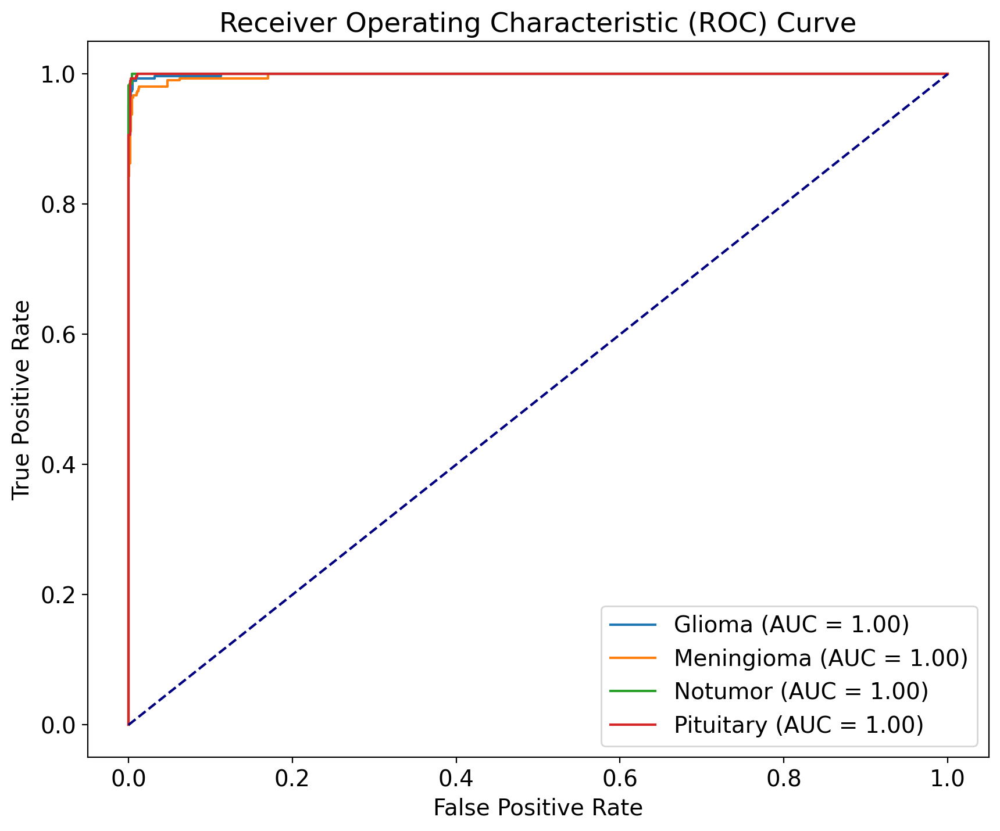

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step


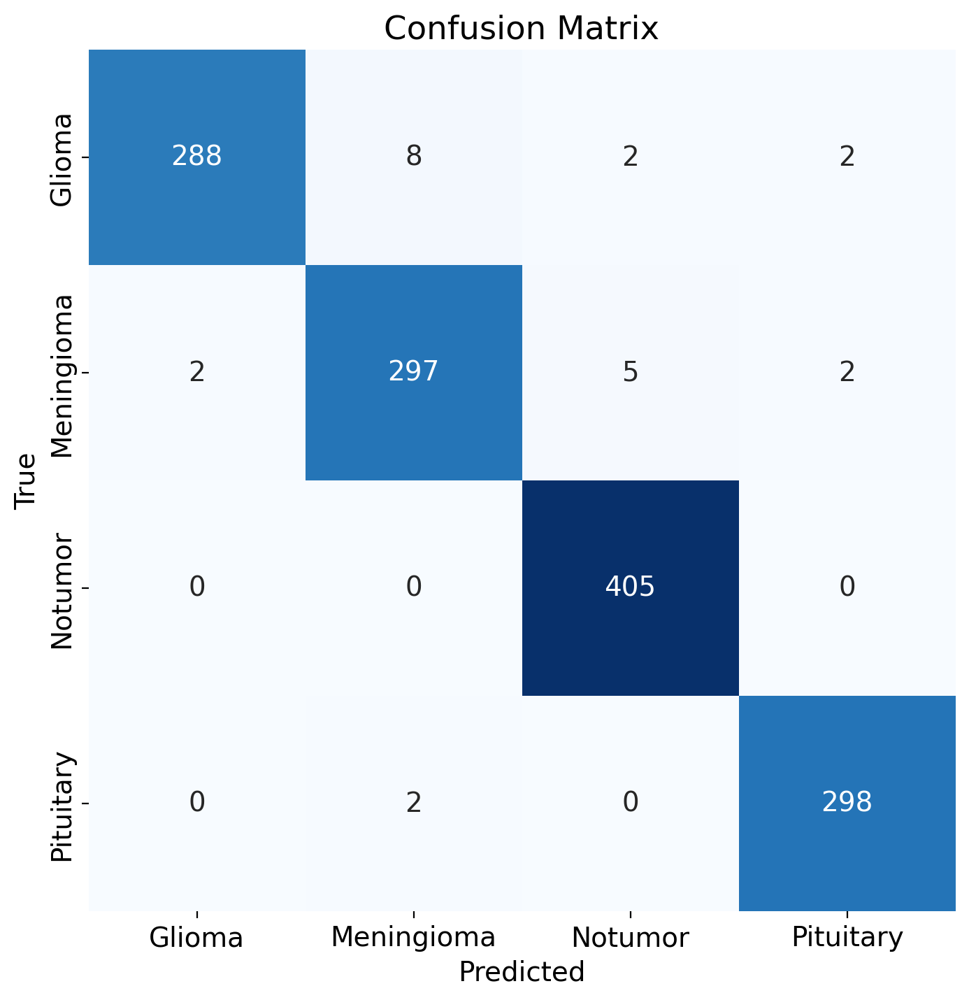

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.993103  0.960000  0.976271       300
  Meningioma   0.967427  0.970588  0.969005       306
     Notumor   0.983010  1.000000  0.991432       405
   Pituitary   0.986755  0.993333  0.990033       300

    accuracy                       0.982456      1311
   macro avg   0.982574  0.980980  0.981685      1311
weighted avg   0.982539  0.982456  0.982408      1311



In [26]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (6, 6), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 2
    Conv2D(64, (6, 6), activation="relu"),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 3
    Conv2D(128, (6, 6), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_22"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_66 (Conv2D)              │ (None, 144, 144, 32)   │         4,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_44 (MaxPooling2D) │ (None, 72, 72, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_67 (Conv2D)              │ (None, 66, 66, 64)     │       100,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_45 (MaxPooling2D) │ (None, 33, 33, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_68 (Conv2D)              │ (None, 27, 27, 128)    │       401,536 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_22 (Flatten)            │ (None, 93312)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ (None, 512)            │    47,776,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_22 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 48,284,996 (184.19 MB)

 Trainable params: 48,284,996 (184.19 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_66 has kernel size: (7, 7)
Layer conv2d_67 has kernel size: (7, 7)
Layer conv2d_68 has kernel size: (7, 7)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 54s 263ms/step - accuracy: 0.4714 - loss: 1.5527 - val_accuracy: 0.7445 - val_loss: 0.5980 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 5s 28ms/step - accuracy: 0.8750 - loss: 0.3385

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.8750 - loss: 0.3385 - val_accuracy: 0.8710 - val_loss: 0.5021 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.7904 - loss: 0.5256 - val_accuracy: 0.7758 - val_loss: 0.5189 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 250us/step - accuracy: 0.8125 - loss: 0.3646 - val_accuracy: 0.9355 - val_loss: 0.2232 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.8303 - loss: 0.4226 - val_accuracy: 0.8359 - val_loss: 0.4583 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 249us/step - accuracy: 0.7812 - loss: 0.4902 - val_accuracy: 0.9677 - val_loss: 0.1209 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - accuracy: 0.8758 - loss: 0.3260 - val_accuracy: 0.8664 - val_loss: 0.3183 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 234us/step - accuracy: 0.9375 - loss: 0.274

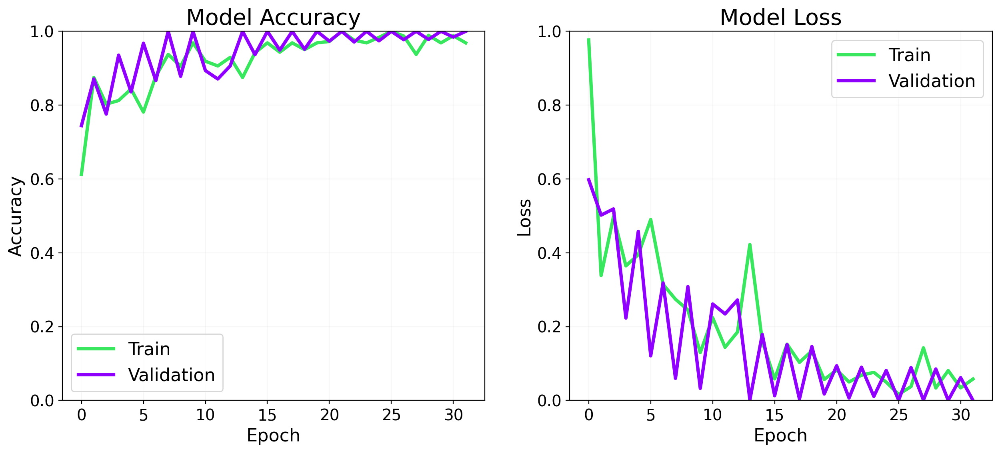

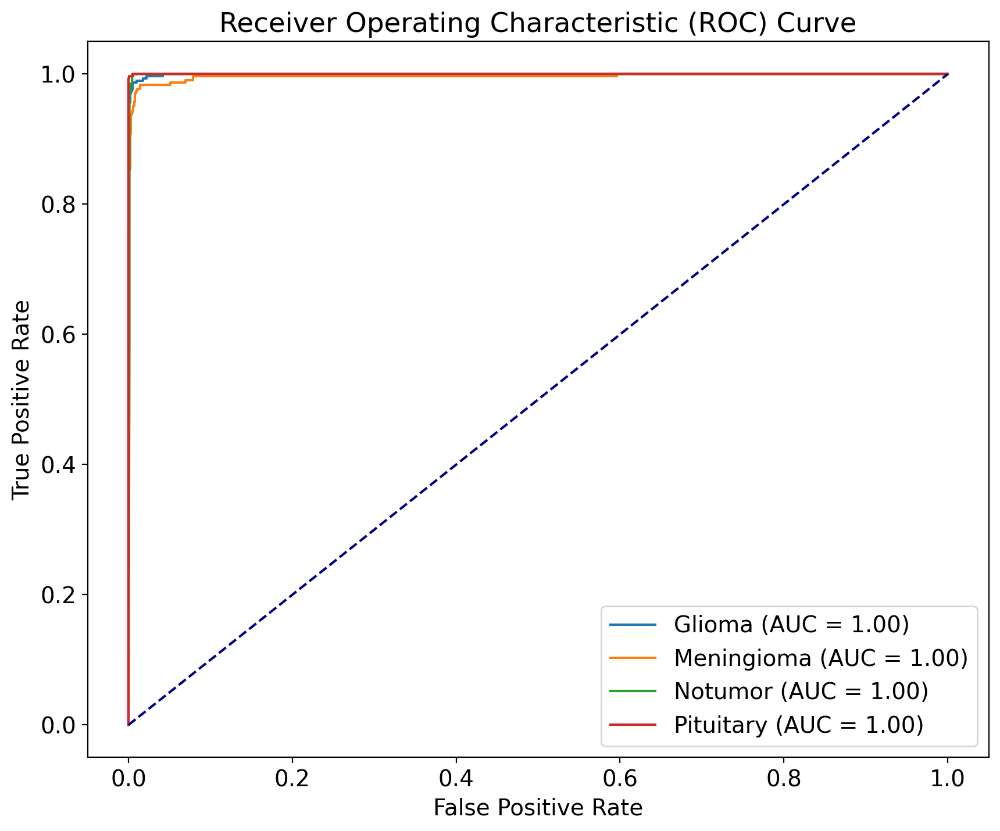

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step


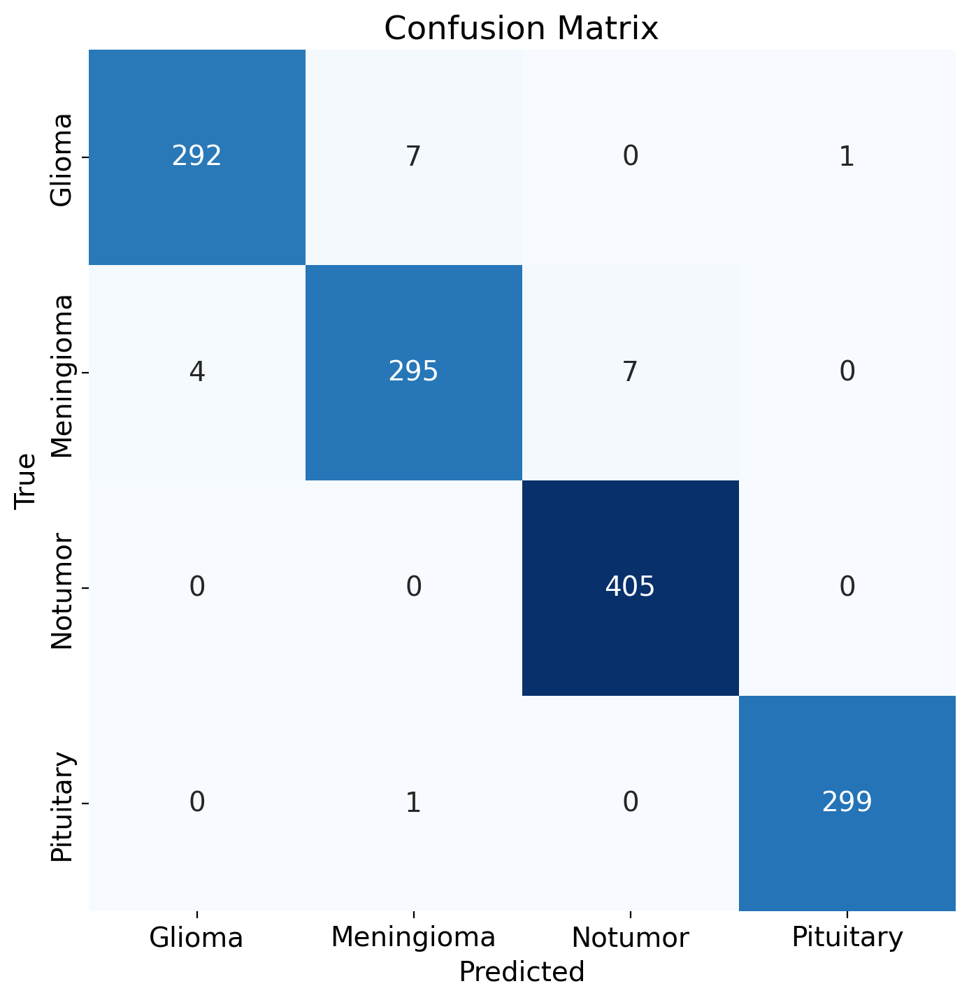

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.986486  0.973333  0.979866       300
  Meningioma   0.973597  0.964052  0.968801       306
     Notumor   0.983010  1.000000  0.991432       405
   Pituitary   0.996667  0.996667  0.996667       300

    accuracy                       0.984744      1311
   macro avg   0.984940  0.983513  0.984191      1311
weighted avg   0.984734  0.984744  0.984701      1311



In [27]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (7, 7), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 2
    Conv2D(64, (7, 7), activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 3
    Conv2D(128, (7, 7), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_23"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_69 (Conv2D)              │ (None, 144, 144, 32)   │         4,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_46 (MaxPooling2D) │ (None, 48, 48, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_70 (Conv2D)              │ (None, 42, 42, 64)     │       100,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_47 (MaxPooling2D) │ (None, 14, 14, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_71 (Conv2D)              │ (None, 8, 8, 128)      │       401,536 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_23 (Flatten)            │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 512)            │     4,194,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_23 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,703,556 (17.94 MB)

 Trainable params: 4,703,556 (17.94 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_69 has kernel size: (7, 7)
Layer conv2d_70 has kernel size: (7, 7)
Layer conv2d_71 has kernel size: (7, 7)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 50s 249ms/step - accuracy: 0.4992 - loss: 1.0866 - val_accuracy: 0.7094 - val_loss: 0.7000 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.7812 - loss: 0.7727

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.7812 - loss: 0.7727 - val_accuracy: 0.9355 - val_loss: 0.3219 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 222ms/step - accuracy: 0.7633 - loss: 0.5489 - val_accuracy: 0.7836 - val_loss: 0.5191 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 291us/step - accuracy: 0.8750 - loss: 0.6547 - val_accuracy: 0.8710 - val_loss: 0.4462 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.8501 - loss: 0.3864 - val_accuracy: 0.8031 - val_loss: 0.4879 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - accuracy: 0.7500 - loss: 0.4910 - val_accuracy: 0.9677 - val_loss: 0.1984 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 222ms/step - accuracy: 0.8803 - loss: 0.3091 - val_accuracy: 0.8602 - val_loss: 0.3544 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 302us/step - accuracy: 0.9062 - loss: 0.158

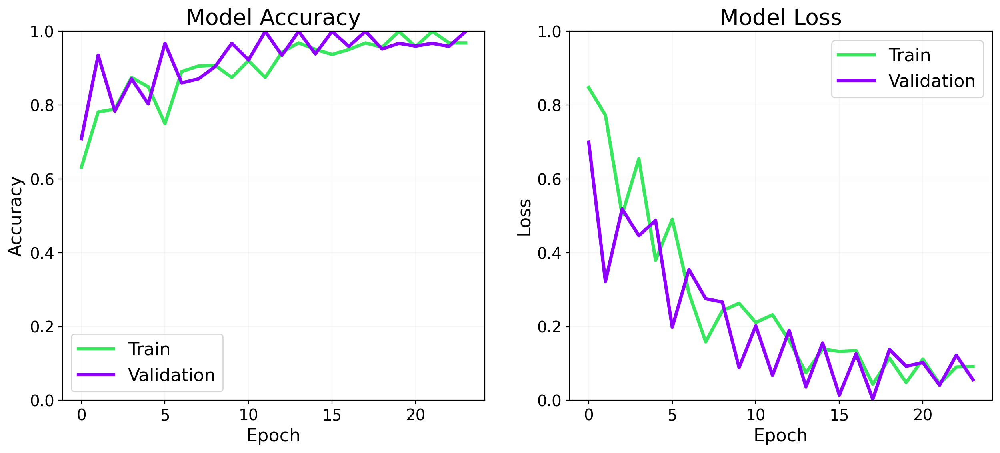

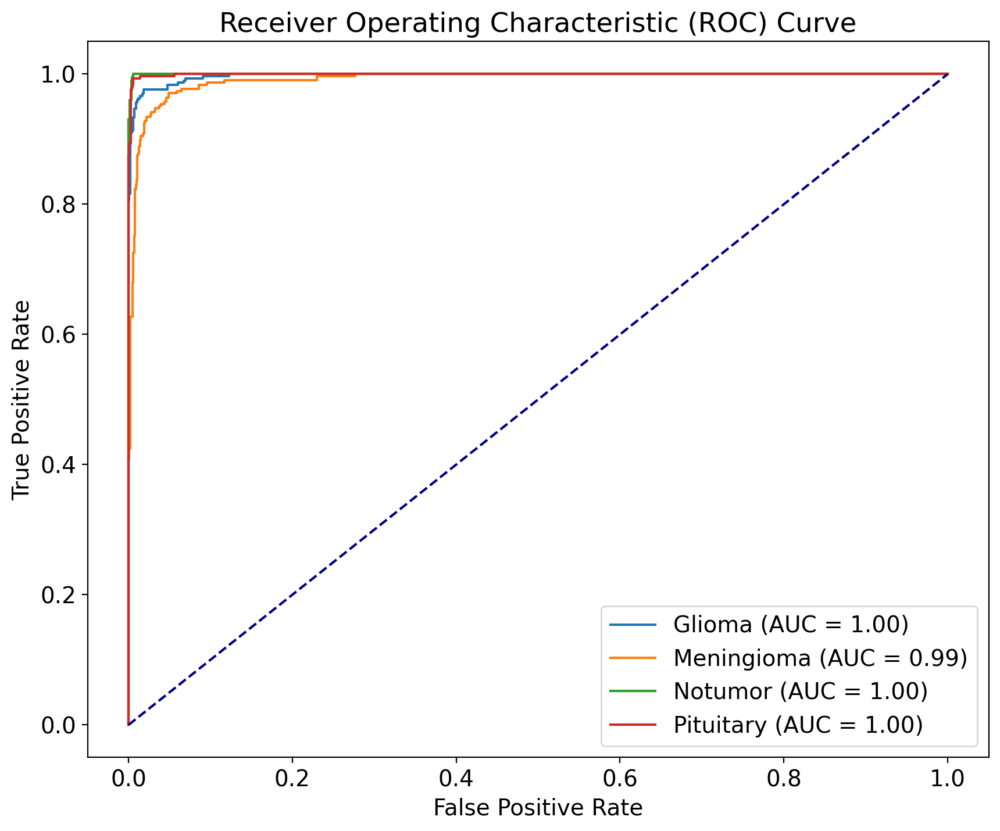

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step


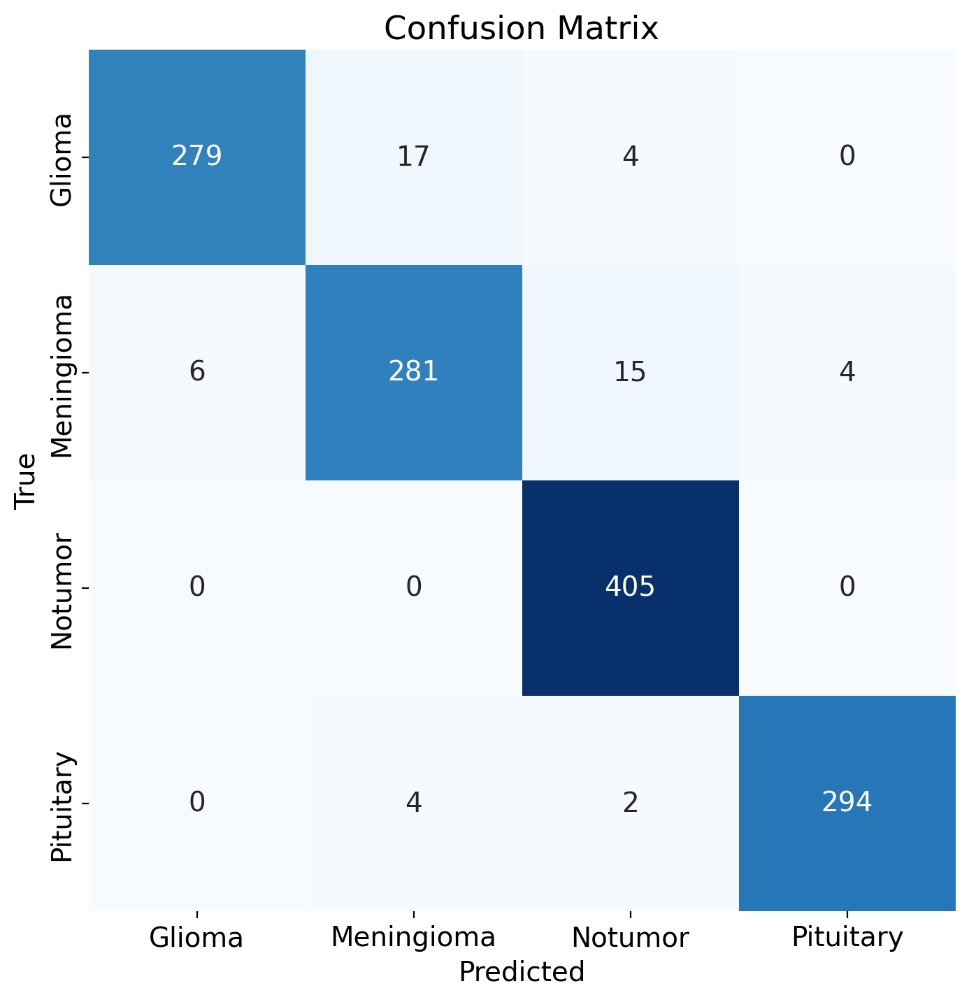

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.978947  0.930000  0.953846       300
  Meningioma   0.930464  0.918301  0.924342       306
     Notumor   0.950704  1.000000  0.974729       405
   Pituitary   0.986577  0.980000  0.983278       300

    accuracy                       0.960336      1311
   macro avg   0.961673  0.957075  0.959049      1311
weighted avg   0.960652  0.960336  0.960146      1311



In [28]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (7, 7), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 2
    Conv2D(64, (7, 7), activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 3
    Conv2D(128, (7, 7), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_24"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_72 (Conv2D)              │ (None, 144, 144, 32)   │         4,736 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_48 (MaxPooling2D) │ (None, 36, 36, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_73 (Conv2D)              │ (None, 30, 30, 64)     │       100,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_49 (MaxPooling2D) │ (None, 7, 7, 64)       │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_74 (Conv2D)              │ (None, 1, 1, 128)      │       401,536 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_24 (Flatten)            │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_48 (Dense)                │ (None, 512)            │        66,048 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_24 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 574,788 (2.19 MB)

 Trainable params: 574,788 (2.19 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_72 has kernel size: (7, 7)
Layer conv2d_73 has kernel size: (7, 7)
Layer conv2d_74 has kernel size: (7, 7)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 49s 245ms/step - accuracy: 0.5661 - loss: 0.9707 - val_accuracy: 0.7211 - val_loss: 0.6638 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 2s 12ms/step - accuracy: 0.7188 - loss: 0.5486

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 2ms/step - accuracy: 0.7188 - loss: 0.5486 - val_accuracy: 0.9032 - val_loss: 0.4044 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 223ms/step - accuracy: 0.7935 - loss: 0.5195 - val_accuracy: 0.7797 - val_loss: 0.4828 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 364us/step - accuracy: 0.8750 - loss: 0.2671 - val_accuracy: 0.9677 - val_loss: 0.1833 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 219ms/step - accuracy: 0.8401 - loss: 0.3887 - val_accuracy: 0.8000 - val_loss: 0.4428 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 315us/step - accuracy: 0.7500 - loss: 0.5799 - val_accuracy: 1.0000 - val_loss: 0.0404 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 226ms/step - accuracy: 0.8922 - loss: 0.2821 - val_accuracy: 0.8375 - val_loss: 0.4275 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 316us/step - accuracy: 0.9062 - loss: 0.241

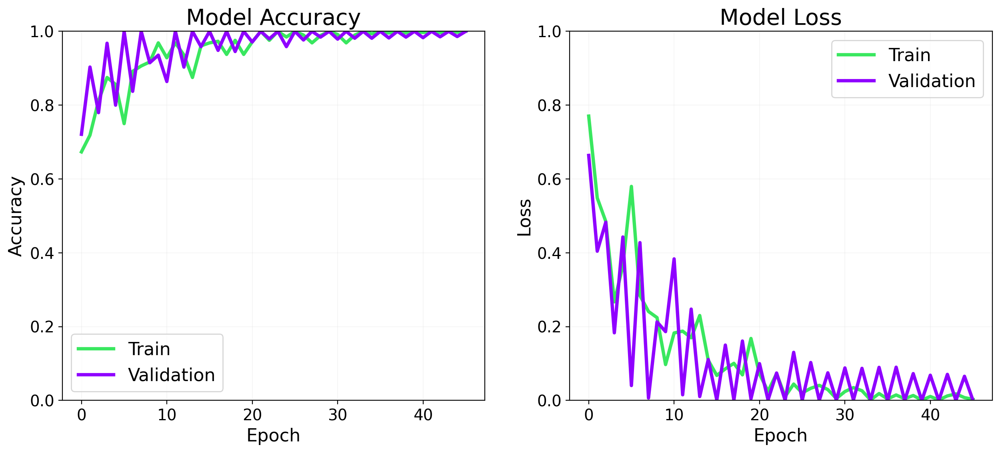

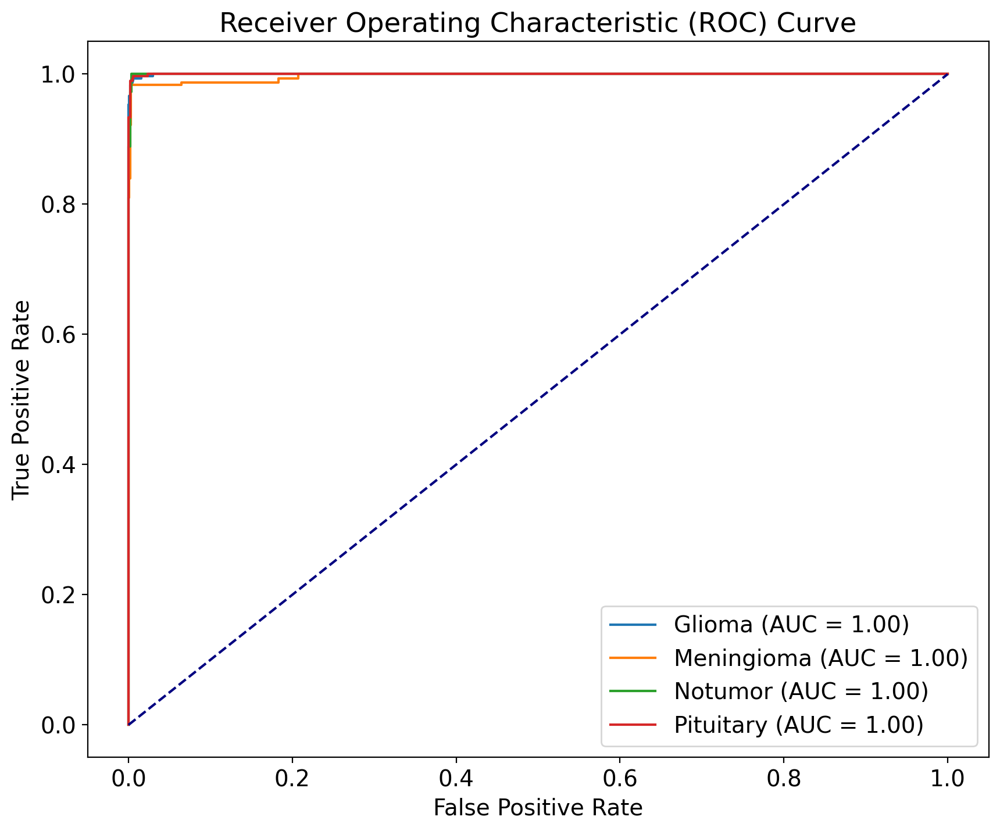

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 55ms/step


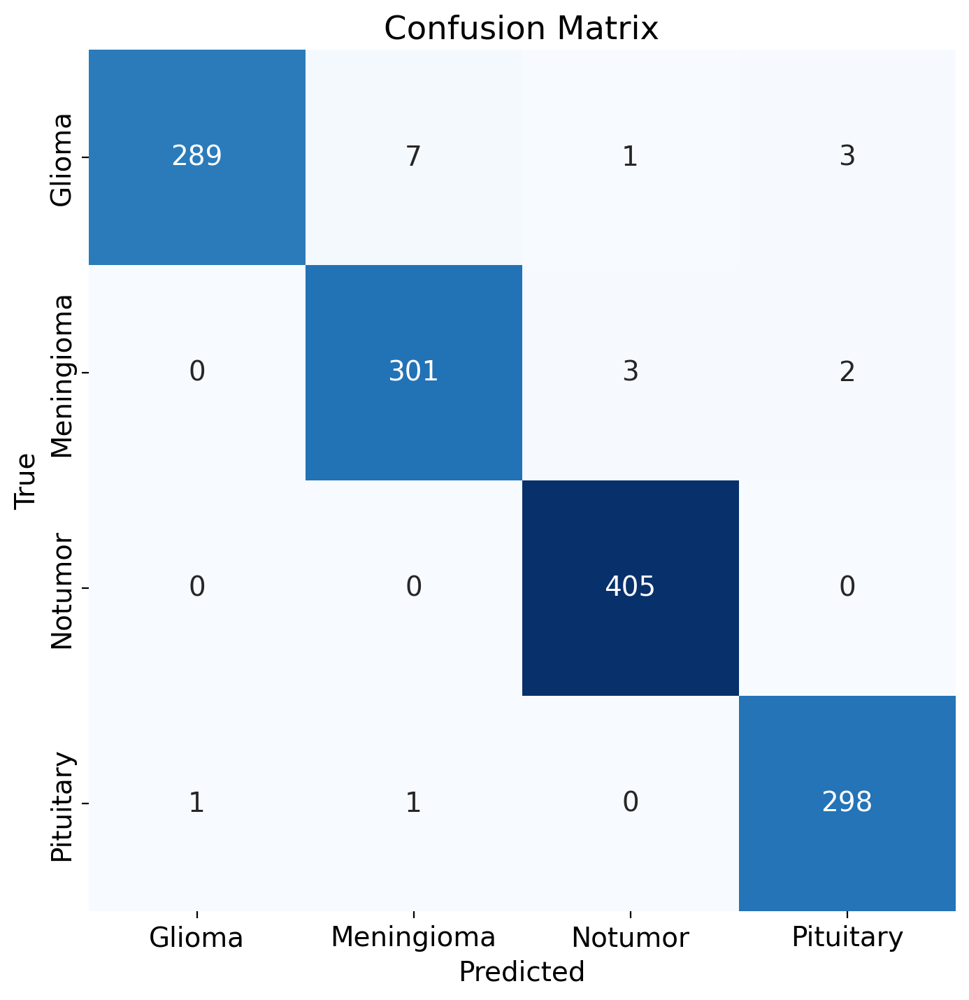

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.996552  0.963333  0.979661       300
  Meningioma   0.974110  0.983660  0.978862       306
     Notumor   0.990220  1.000000  0.995086       405
   Pituitary   0.983498  0.993333  0.988391       300

    accuracy                       0.986270      1311
   macro avg   0.986095  0.985082  0.985500      1311
weighted avg   0.986371  0.986270  0.986237      1311



In [29]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (7, 7), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 2
    Conv2D(64, (7, 7), activation="relu"),
    MaxPooling2D(pool_size=(4, 4)),

    # Convolutional layer 3
    Conv2D(128, (7, 7), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_25"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_75 (Conv2D)              │ (None, 143, 143, 32)   │         6,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_50 (MaxPooling2D) │ (None, 71, 71, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_76 (Conv2D)              │ (None, 64, 64, 64)     │       131,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_51 (MaxPooling2D) │ (None, 32, 32, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_77 (Conv2D)              │ (None, 25, 25, 128)    │       524,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_25 (Flatten)            │ (None, 80000)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_50 (Dense)                │ (None, 512)            │    40,960,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_25 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 41,624,292 (158.78 MB)

 Trainable params: 41,624,292 (158.78 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_75 has kernel size: (8, 8)
Layer conv2d_76 has kernel size: (8, 8)
Layer conv2d_77 has kernel size: (8, 8)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 52s 257ms/step - accuracy: 0.5071 - loss: 1.2722 - val_accuracy: 0.7586 - val_loss: 0.6175 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - accuracy: 0.8125 - loss: 0.4588

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - accuracy: 0.8125 - loss: 0.4588 - val_accuracy: 0.8387 - val_loss: 0.6942 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 228ms/step - accuracy: 0.8071 - loss: 0.5240 - val_accuracy: 0.7852 - val_loss: 0.6085 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 254us/step - accuracy: 0.8438 - loss: 0.3623 - val_accuracy: 0.9677 - val_loss: 0.2113 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.8468 - loss: 0.4063 - val_accuracy: 0.8141 - val_loss: 0.4891 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 281us/step - accuracy: 0.8750 - loss: 0.4473 - val_accuracy: 1.0000 - val_loss: 0.1527 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.8813 - loss: 0.3135 - val_accuracy: 0.8297 - val_loss: 0.4778 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 272us/step - accuracy: 0.8750 - loss: 0.311

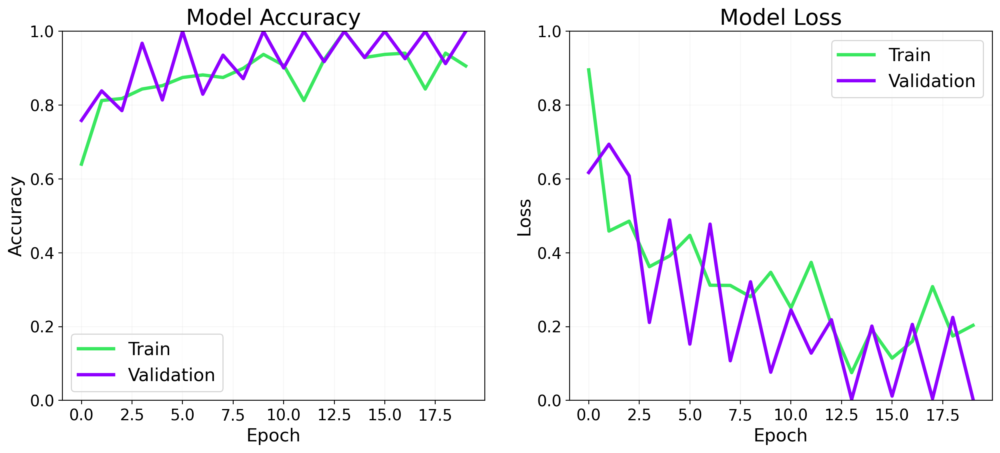

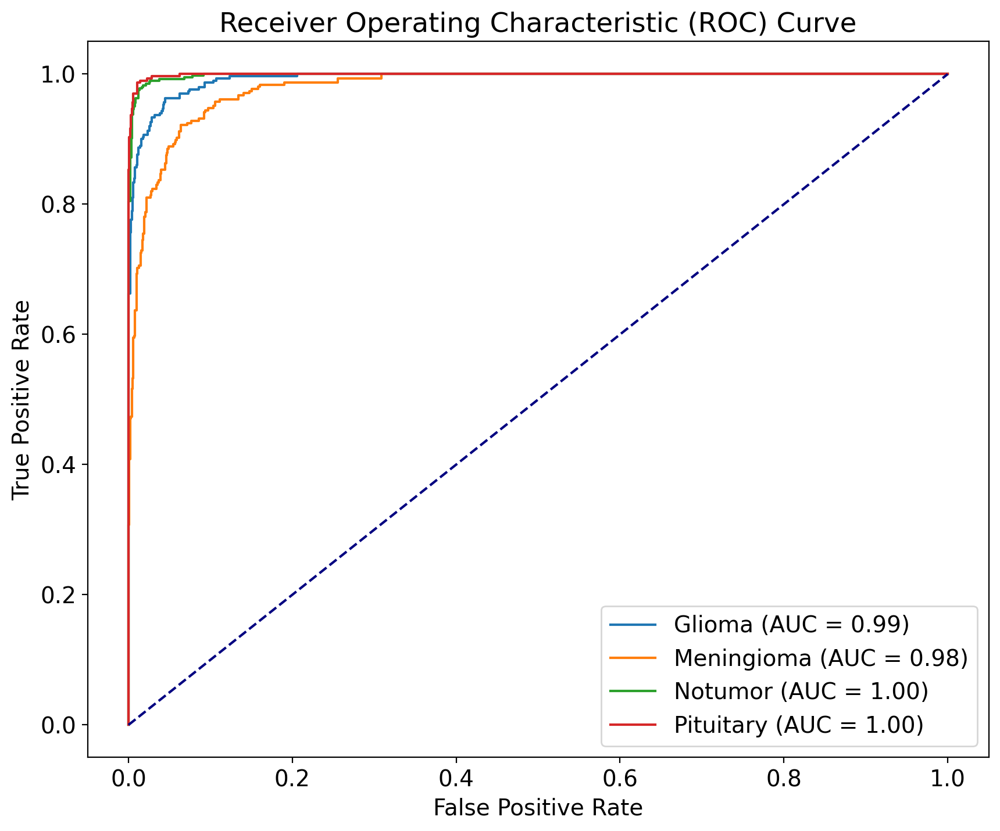

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step


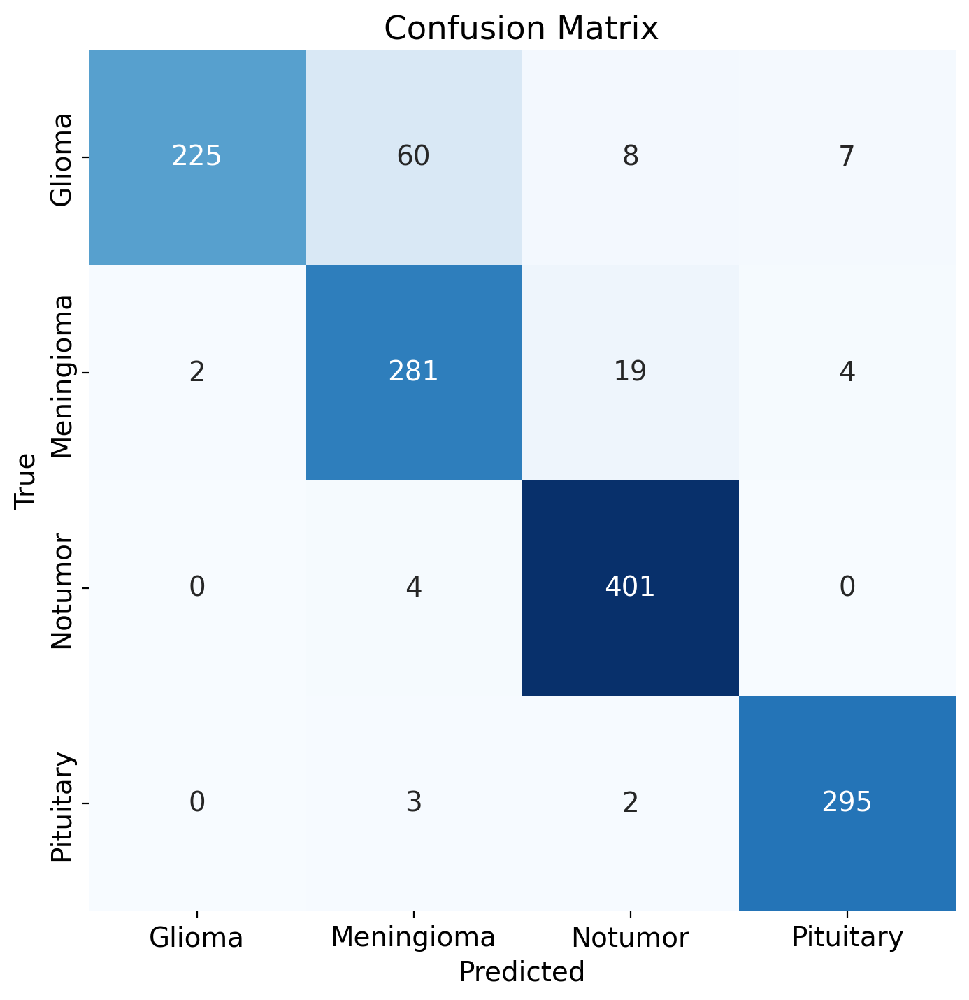

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.991189  0.750000  0.853890       300
  Meningioma   0.807471  0.918301  0.859327       306
     Notumor   0.932558  0.990123  0.960479       405
   Pituitary   0.964052  0.983333  0.973597       300

    accuracy                       0.916857      1311
   macro avg   0.923818  0.910439  0.911823      1311
weighted avg   0.923985  0.916857  0.915480      1311



In [30]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (8, 8), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 2
    Conv2D(64, (8, 8), activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 3
    Conv2D(128, (8, 8), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_26"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_78 (Conv2D)              │ (None, 143, 143, 32)   │         6,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_52 (MaxPooling2D) │ (None, 47, 47, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_79 (Conv2D)              │ (None, 40, 40, 64)     │       131,136 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_53 (MaxPooling2D) │ (None, 13, 13, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_80 (Conv2D)              │ (None, 6, 6, 128)      │       524,416 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_26 (Flatten)            │ (None, 4608)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ (None, 512)            │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_26 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_53 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 3,023,588 (11.53 MB)

 Trainable params: 3,023,588 (11.53 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_78 has kernel size: (8, 8)
Layer conv2d_79 has kernel size: (8, 8)
Layer conv2d_80 has kernel size: (8, 8)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 48s 241ms/step - accuracy: 0.4400 - loss: 1.2129 - val_accuracy: 0.7047 - val_loss: 0.7485 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.8438 - loss: 0.3364

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8438 - loss: 0.3364 - val_accuracy: 0.8710 - val_loss: 0.3187 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 222ms/step - accuracy: 0.7949 - loss: 0.5250 - val_accuracy: 0.7758 - val_loss: 0.5817 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 326us/step - accuracy: 0.8438 - loss: 0.4137 - val_accuracy: 0.8710 - val_loss: 0.5813 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 222ms/step - accuracy: 0.8520 - loss: 0.3905 - val_accuracy: 0.7977 - val_loss: 0.4946 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - accuracy: 0.8750 - loss: 0.2730 - val_accuracy: 0.8710 - val_loss: 0.3892 - learning_rate: 0.0010
Epoch 7/64
176/178 ━━━━━━━━━━━━━━━━━━━━ 0s 215ms/step - accuracy: 0.8751 - loss: 0.3358
Epoch 7: ReduceLROnPlateau reducing learning rate to 0.0005000000237487257.
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 226ms/step - accuracy: 0.8753 - loss: 0.3352

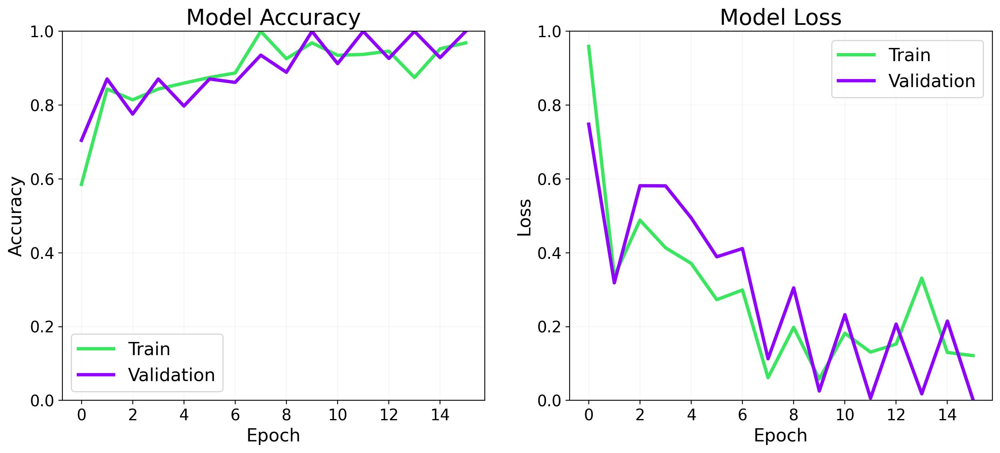

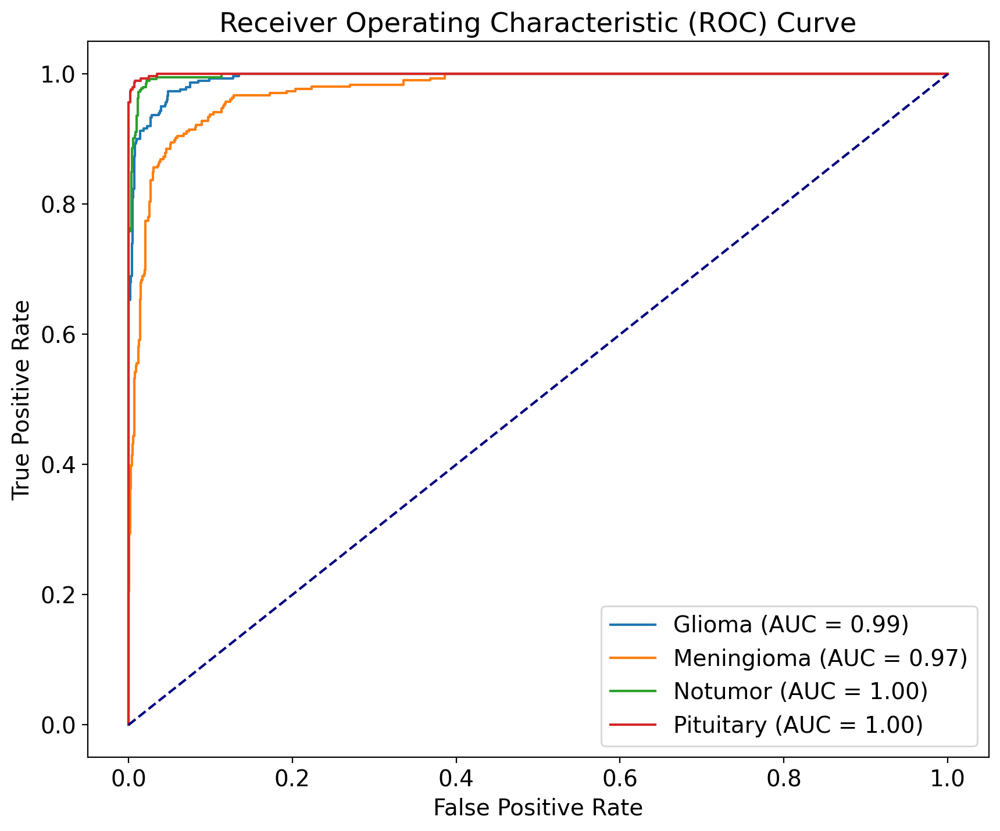

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step


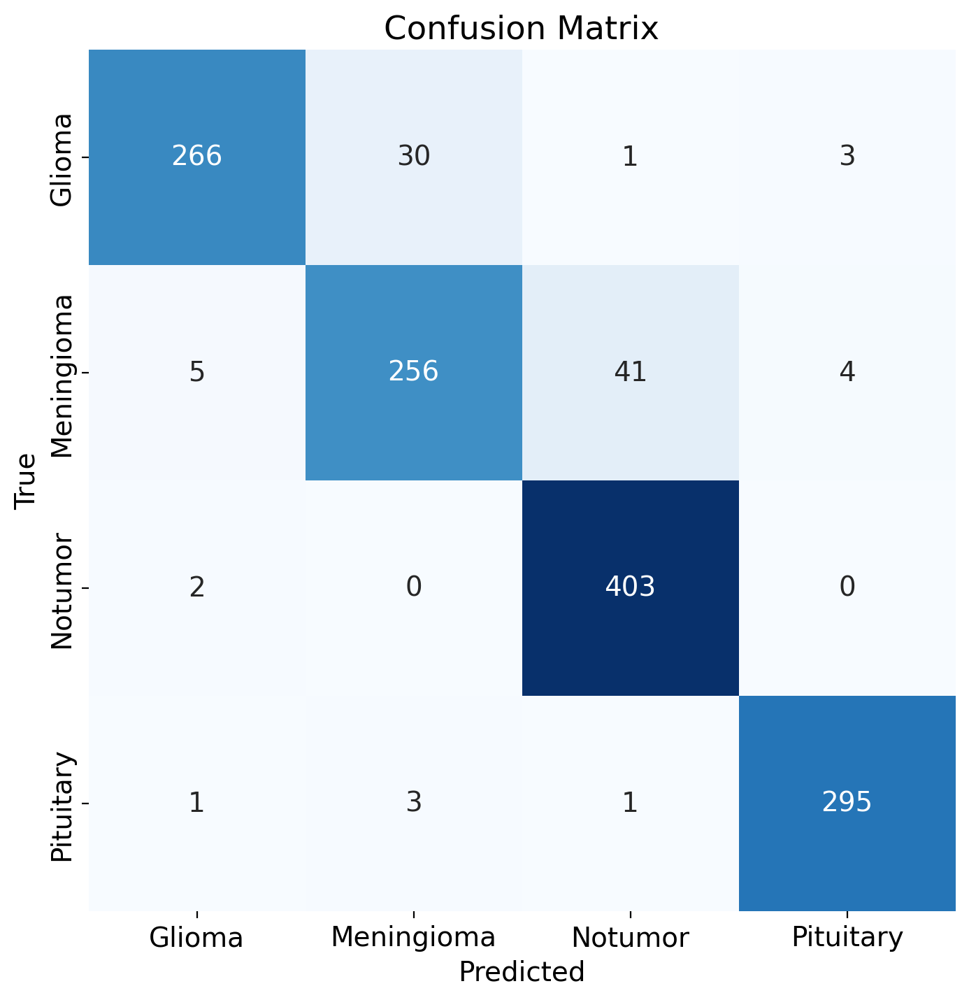

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.970803  0.886667  0.926829       300
  Meningioma   0.885813  0.836601  0.860504       306
     Notumor   0.903587  0.995062  0.947121       405
   Pituitary   0.976821  0.983333  0.980066       300

    accuracy                       0.930587      1311
   macro avg   0.934256  0.925416  0.928630      1311
weighted avg   0.931578  0.930587  0.929799      1311



In [31]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (8, 8), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 2
    Conv2D(64, (8, 8), activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 3
    Conv2D(128, (8, 8), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_27"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_81 (Conv2D)              │ (None, 142, 142, 32)   │         7,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_54 (MaxPooling2D) │ (None, 71, 71, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_82 (Conv2D)              │ (None, 63, 63, 64)     │       165,952 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_55 (MaxPooling2D) │ (None, 31, 31, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_83 (Conv2D)              │ (None, 23, 23, 128)    │       663,680 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_27 (Flatten)            │ (None, 67712)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ (None, 512)            │    34,669,056 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_27 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 35,508,548 (135.45 MB)

 Trainable params: 35,508,548 (135.45 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_81 has kernel size: (9, 9)
Layer conv2d_82 has kernel size: (9, 9)
Layer conv2d_83 has kernel size: (9, 9)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 55s 263ms/step - accuracy: 0.5276 - loss: 1.5292 - val_accuracy: 0.7617 - val_loss: 0.6064 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 4s 27ms/step - accuracy: 0.7812 - loss: 0.4919

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7812 - loss: 0.4919 - val_accuracy: 0.8387 - val_loss: 0.4525 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 222ms/step - accuracy: 0.8190 - loss: 0.4684 - val_accuracy: 0.8023 - val_loss: 0.5344 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 249us/step - accuracy: 0.9062 - loss: 0.1607 - val_accuracy: 1.0000 - val_loss: 0.0767 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 43s 232ms/step - accuracy: 0.8682 - loss: 0.3402 - val_accuracy: 0.8539 - val_loss: 0.3563 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 250us/step - accuracy: 0.9062 - loss: 0.2198 - val_accuracy: 1.0000 - val_loss: 0.1032 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 44s 237ms/step - accuracy: 0.8964 - loss: 0.2715 - val_accuracy: 0.9039 - val_loss: 0.2557 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 295us/step - accuracy: 0.9375 - loss: 0.230

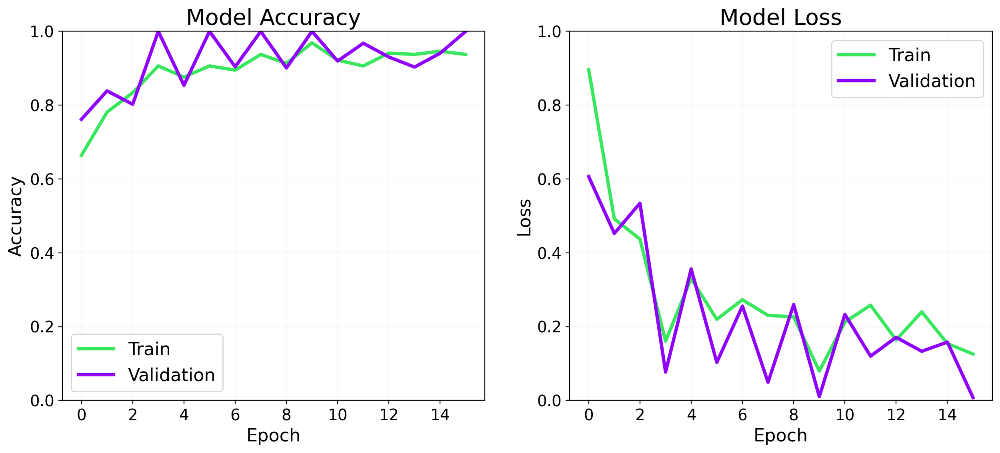

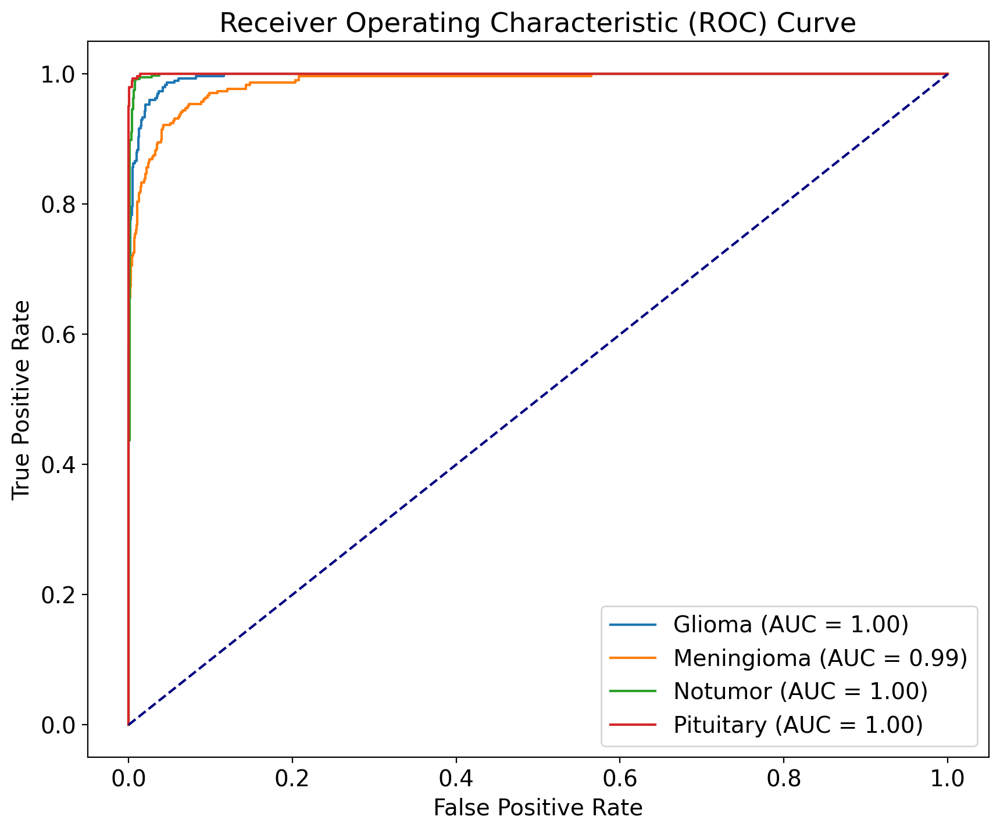

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step


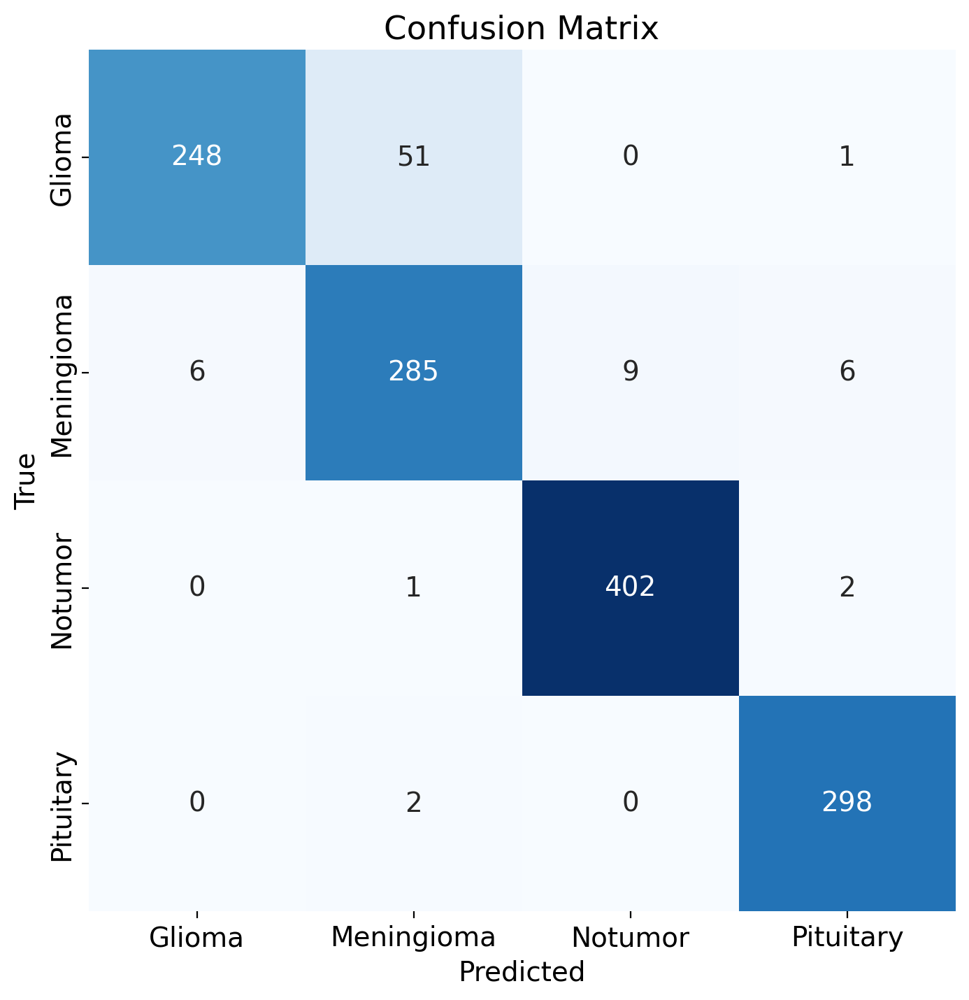

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 61ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.976378  0.826667  0.895307       300
  Meningioma   0.840708  0.931373  0.883721       306
     Notumor   0.978102  0.992593  0.985294       405
   Pituitary   0.970684  0.993333  0.981878       300

    accuracy                       0.940503      1311
   macro avg   0.941468  0.935991  0.936550      1311
weighted avg   0.943941  0.940503  0.940212      1311



In [32]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (9, 9), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 2
    Conv2D(64, (9, 9), activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 3
    Conv2D(128, (9, 9), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_28"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_84 (Conv2D)              │ (None, 142, 142, 32)   │         7,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_56 (MaxPooling2D) │ (None, 47, 47, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_85 (Conv2D)              │ (None, 39, 39, 64)     │       165,952 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_57 (MaxPooling2D) │ (None, 13, 13, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_86 (Conv2D)              │ (None, 5, 5, 128)      │       663,680 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_28 (Flatten)            │ (None, 3200)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_56 (Dense)                │ (None, 512)            │     1,638,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_28 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_57 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,478,404 (9.45 MB)

 Trainable params: 2,478,404 (9.45 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_84 has kernel size: (9, 9)
Layer conv2d_85 has kernel size: (9, 9)
Layer conv2d_86 has kernel size: (9, 9)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 49s 243ms/step - accuracy: 0.4790 - loss: 1.1154 - val_accuracy: 0.7484 - val_loss: 0.7065 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 2s 17ms/step - accuracy: 0.8750 - loss: 0.3737

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8750 - loss: 0.3737 - val_accuracy: 0.8387 - val_loss: 0.6828 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 222ms/step - accuracy: 0.8207 - loss: 0.4702 - val_accuracy: 0.7781 - val_loss: 0.5301 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 345us/step - accuracy: 0.9375 - loss: 0.2291 - val_accuracy: 0.8710 - val_loss: 0.3823 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 223ms/step - accuracy: 0.8547 - loss: 0.3665 - val_accuracy: 0.8102 - val_loss: 0.4973 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 305us/step - accuracy: 0.9062 - loss: 0.3503 - val_accuracy: 1.0000 - val_loss: 0.0444 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.8865 - loss: 0.2972 - val_accuracy: 0.8727 - val_loss: 0.3034 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 341us/step - accuracy: 0.9375 - loss: 0.259

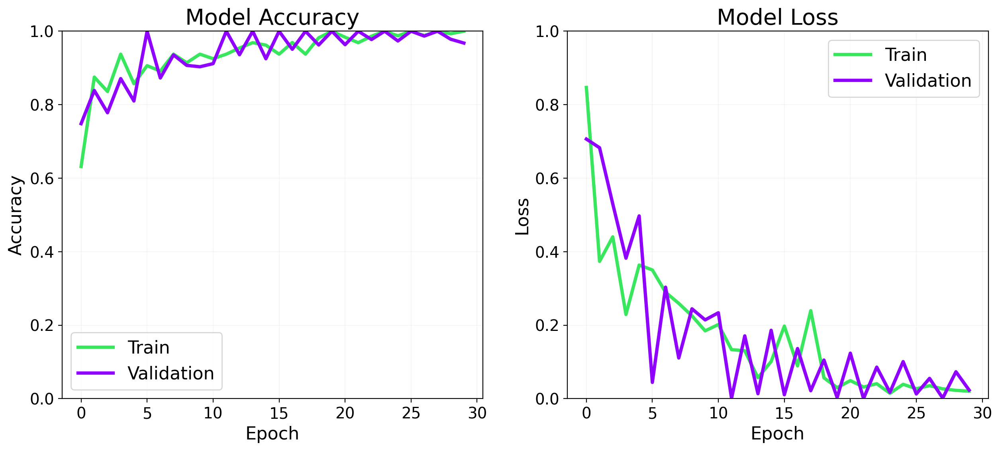

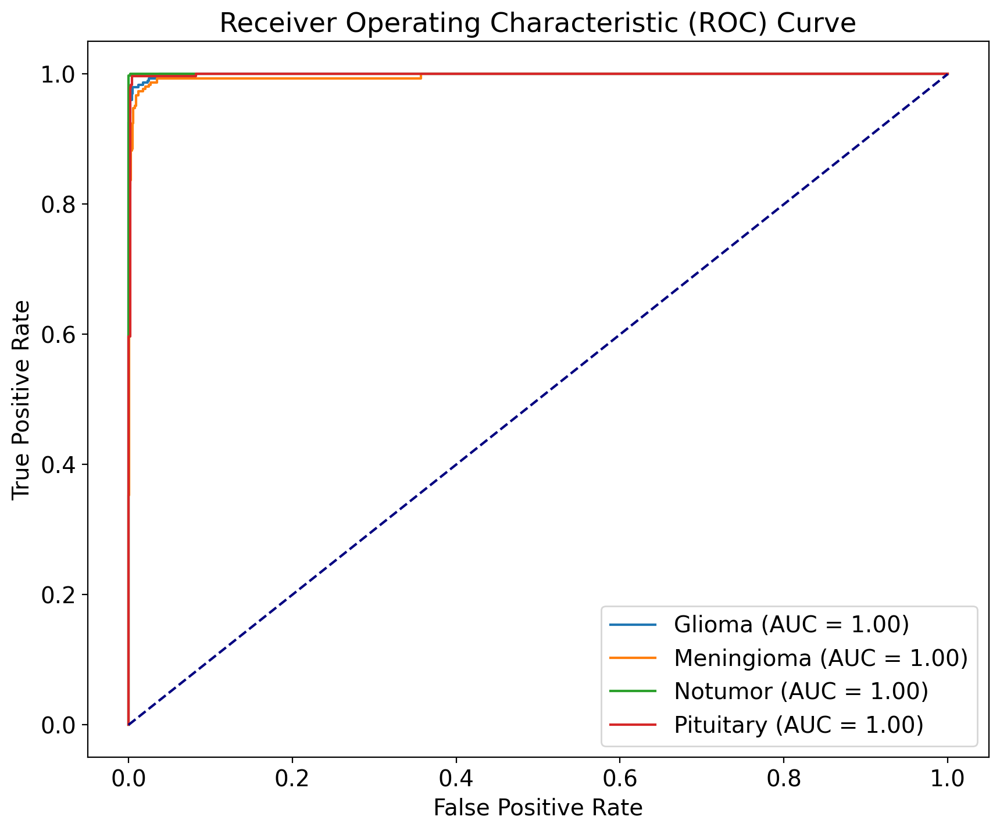

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step


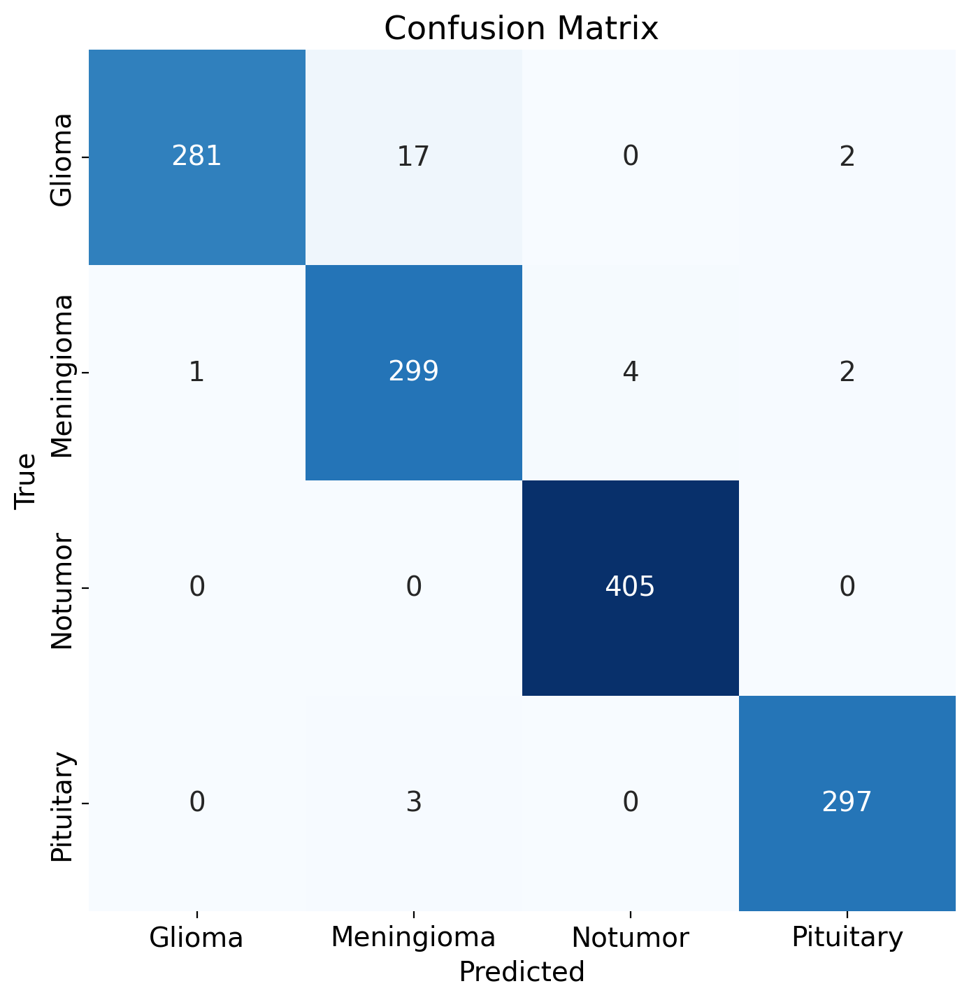

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 65ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.996454  0.936667  0.965636       300
  Meningioma   0.937304  0.977124  0.956800       306
     Notumor   0.990220  1.000000  0.995086       405
   Pituitary   0.986711  0.990000  0.988353       300

    accuracy                       0.977879      1311
   macro avg   0.977672  0.975948  0.976469      1311
weighted avg   0.978492  0.977879  0.977870      1311



In [33]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (9, 9), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 2
    Conv2D(64, (9, 9), activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 3
    Conv2D(128, (9, 9), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_29"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_87 (Conv2D)              │ (None, 141, 141, 32)   │         9,632 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_58 (MaxPooling2D) │ (None, 70, 70, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_88 (Conv2D)              │ (None, 61, 61, 64)     │       204,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_59 (MaxPooling2D) │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_89 (Conv2D)              │ (None, 21, 21, 128)    │       819,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_29 (Flatten)            │ (None, 56448)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_58 (Dense)                │ (None, 512)            │    28,901,888 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_29 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_59 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 29,937,764 (114.20 MB)

 Trainable params: 29,937,764 (114.20 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_87 has kernel size: (10, 10)
Layer conv2d_88 has kernel size: (10, 10)
Layer conv2d_89 has kernel size: (10, 10)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 54s 263ms/step - accuracy: 0.4583 - loss: 1.6202 - val_accuracy: 0.7055 - val_loss: 0.7525 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - accuracy: 0.7500 - loss: 0.8052

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7500 - loss: 0.8052 - val_accuracy: 0.9355 - val_loss: 0.4671 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 226ms/step - accuracy: 0.7964 - loss: 0.5321 - val_accuracy: 0.8086 - val_loss: 0.4768 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - accuracy: 0.9062 - loss: 0.2859 - val_accuracy: 0.9677 - val_loss: 0.3489 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 43s 231ms/step - accuracy: 0.8582 - loss: 0.3946 - val_accuracy: 0.7812 - val_loss: 0.6054 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 396us/step - accuracy: 0.9062 - loss: 0.3748 - val_accuracy: 1.0000 - val_loss: 0.0816 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 229ms/step - accuracy: 0.8588 - loss: 0.3736 - val_accuracy: 0.8500 - val_loss: 0.3817 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 245us/step - accuracy: 0.8750 - loss: 0.343

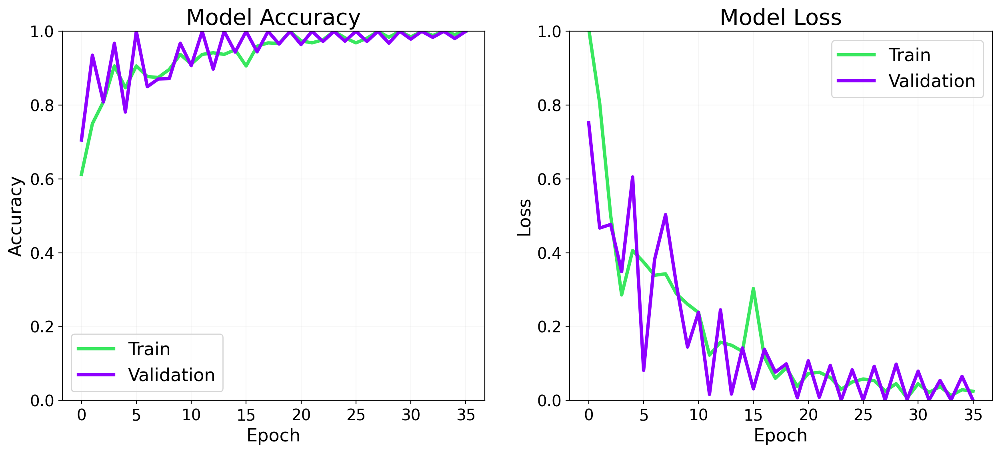

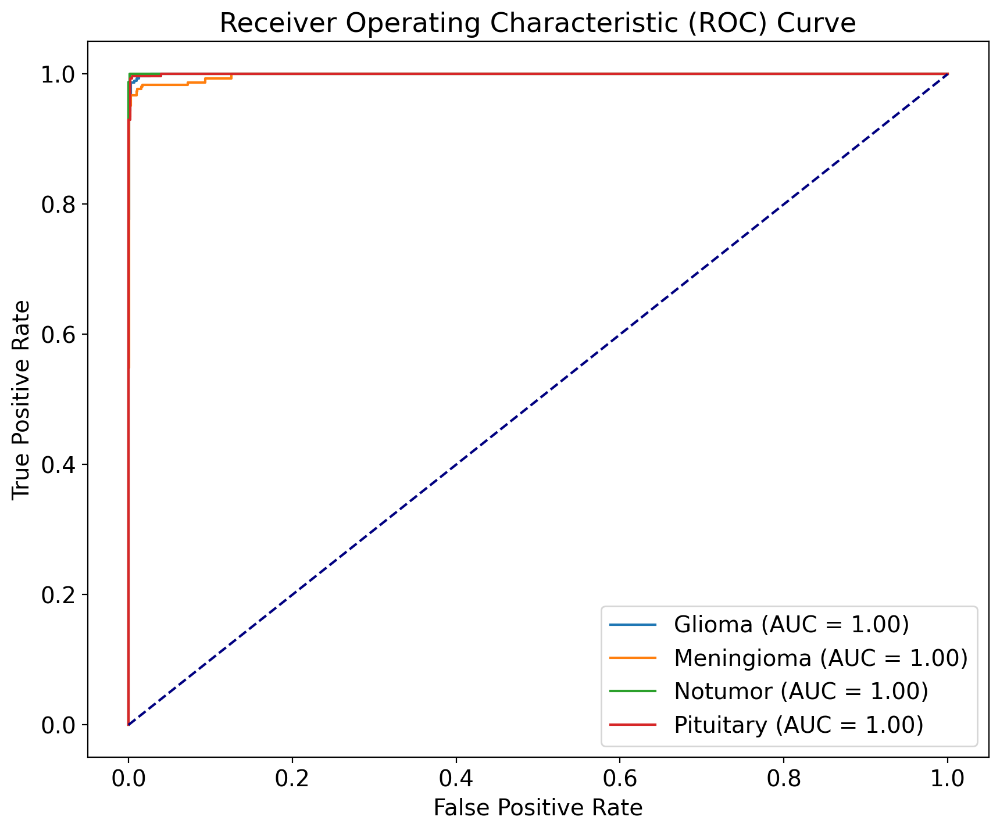

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step


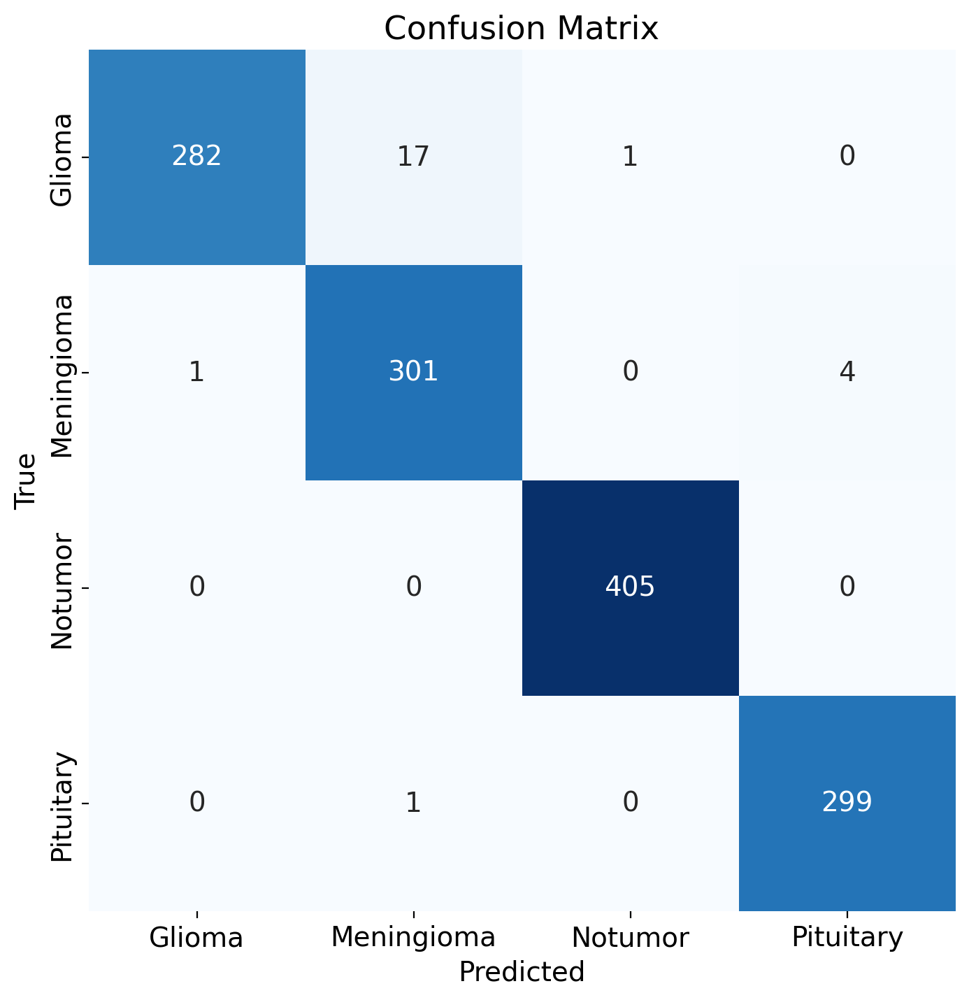

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.996466  0.940000  0.967410       300
  Meningioma   0.943574  0.983660  0.963200       306
     Notumor   0.997537  1.000000  0.998767       405
   Pituitary   0.986799  0.996667  0.991708       300

    accuracy                       0.981693      1311
   macro avg   0.981094  0.980082  0.980271      1311
weighted avg   0.982239  0.981693  0.981674      1311



In [34]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (10, 10), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 2
    Conv2D(64, (10, 10), activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 3
    Conv2D(128, (10, 10), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_30"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_90 (Conv2D)              │ (None, 141, 141, 32)   │         9,632 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_60 (MaxPooling2D) │ (None, 47, 47, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_91 (Conv2D)              │ (None, 38, 38, 64)     │       204,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_61 (MaxPooling2D) │ (None, 12, 12, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_92 (Conv2D)              │ (None, 3, 3, 128)      │       819,328 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_30 (Flatten)            │ (None, 1152)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_60 (Dense)                │ (None, 512)            │       590,336 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_30 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_61 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,626,212 (6.20 MB)

 Trainable params: 1,626,212 (6.20 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_90 has kernel size: (10, 10)
Layer conv2d_91 has kernel size: (10, 10)
Layer conv2d_92 has kernel size: (10, 10)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 49s 246ms/step - accuracy: 0.4913 - loss: 1.0811 - val_accuracy: 0.6945 - val_loss: 0.7766 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.6562 - loss: 0.7398

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.6562 - loss: 0.7398 - val_accuracy: 0.9032 - val_loss: 0.4119 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - accuracy: 0.7845 - loss: 0.5631 - val_accuracy: 0.7578 - val_loss: 0.6142 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 439us/step - accuracy: 0.8750 - loss: 0.2814 - val_accuracy: 0.8387 - val_loss: 0.3680 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.8247 - loss: 0.4471 - val_accuracy: 0.8031 - val_loss: 0.4793 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 303us/step - accuracy: 0.8125 - loss: 0.4799 - val_accuracy: 0.9677 - val_loss: 0.1196 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.8575 - loss: 0.3636 - val_accuracy: 0.8578 - val_loss: 0.3717 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 325us/step - accuracy: 0.9375 - loss: 0.372

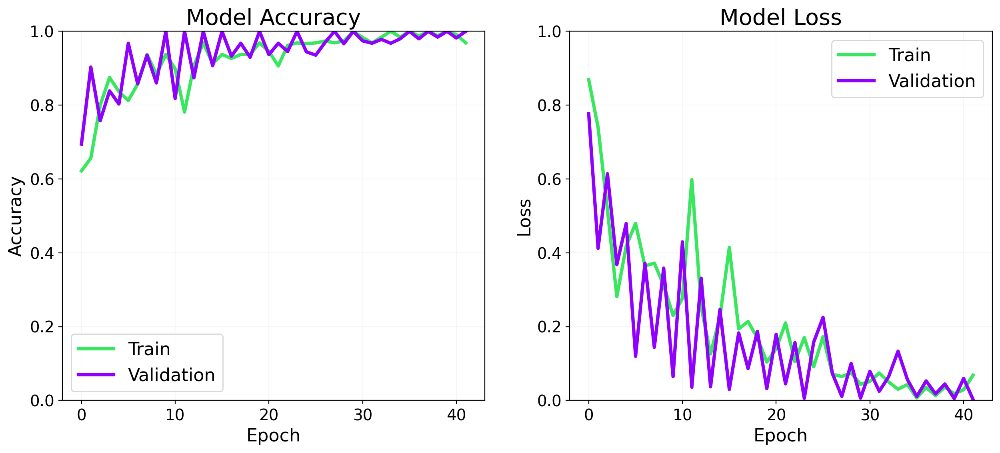

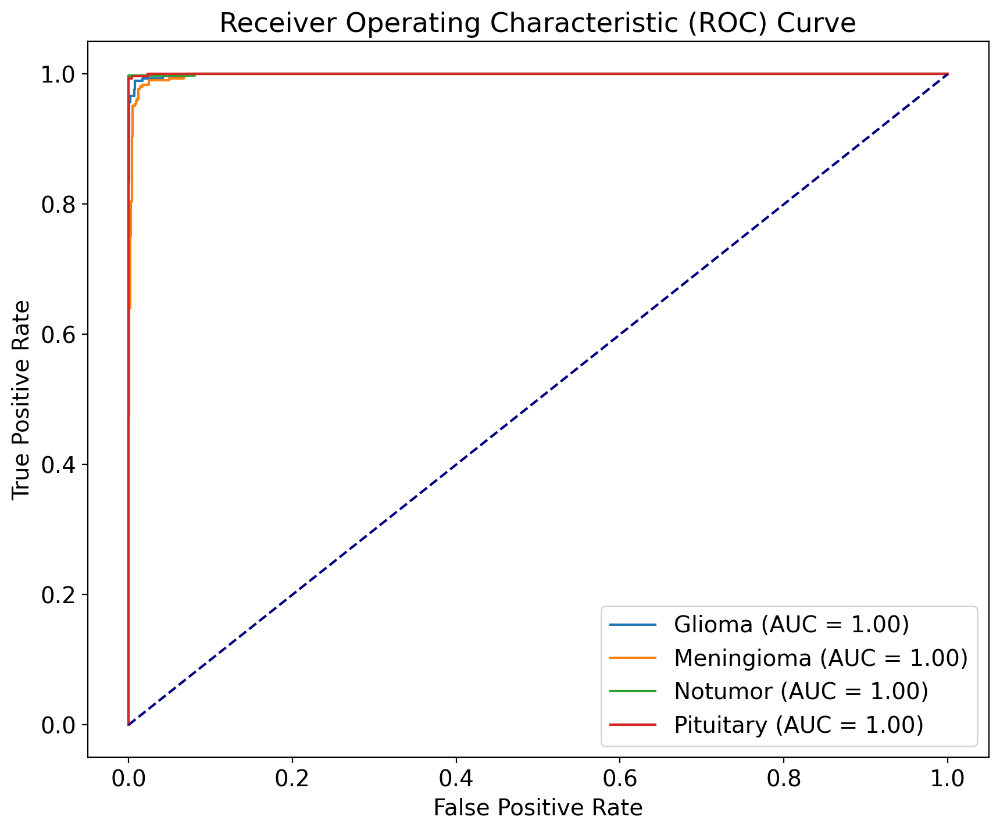

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 59ms/step


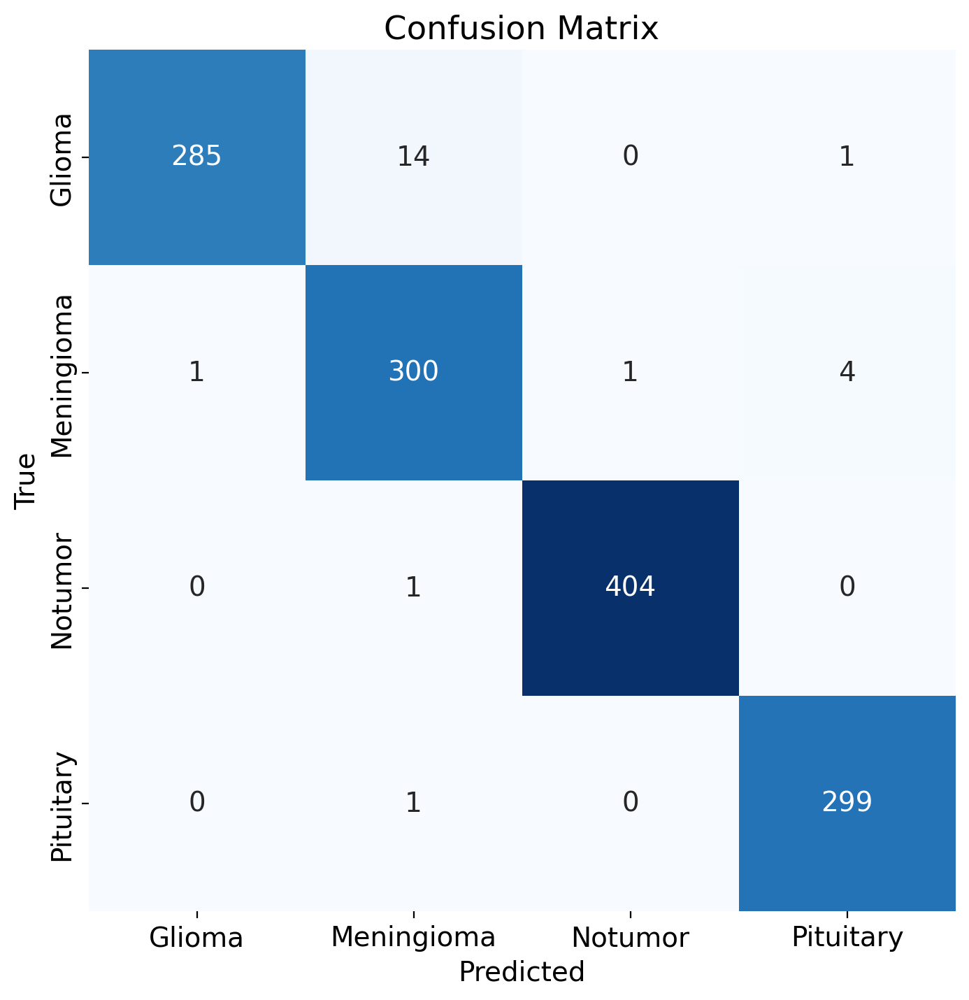

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 70ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.996503  0.950000  0.972696       300
  Meningioma   0.949367  0.980392  0.964630       306
     Notumor   0.997531  0.997531  0.997531       405
   Pituitary   0.983553  0.996667  0.990066       300

    accuracy                       0.982456      1311
   macro avg   0.981739  0.981147  0.981231      1311
weighted avg   0.982855  0.982456  0.982460      1311



In [35]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (10, 10), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 2
    Conv2D(64, (10, 10), activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 3
    Conv2D(128, (10, 10), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_31"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_93 (Conv2D)              │ (None, 140, 140, 32)   │        11,648 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_62 (MaxPooling2D) │ (None, 70, 70, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_94 (Conv2D)              │ (None, 60, 60, 64)     │       247,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_63 (MaxPooling2D) │ (None, 30, 30, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_95 (Conv2D)              │ (None, 20, 20, 128)    │       991,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_31 (Flatten)            │ (None, 51200)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_62 (Dense)                │ (None, 512)            │    26,214,912 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_31 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_63 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,467,844 (104.78 MB)

 Trainable params: 27,467,844 (104.78 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_93 has kernel size: (11, 11)
Layer conv2d_94 has kernel size: (11, 11)
Layer conv2d_95 has kernel size: (11, 11)
Epoch 1/64


2024-11-30 09:21:14.202430: E external/local_xla/xla/service/slow_operation_alarm.cc:65] Trying algorithm eng0{} for conv (f32[64,32,11,11]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,32,70,70]{3,2,1,0}, f32[32,64,60,60]{3,2,1,0}), window={size=11x11}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0}} is taking a while...
2024-11-30 09:21:14.297432: E external/local_xla/xla/service/slow_operation_alarm.cc:133] The operation took 1.095129195s
Trying algorithm eng0{} for conv (f32[64,32,11,11]{3,2,1,0}, u8[0]{0}) custom-call(f32[32,32,70,70]{3,2,1,0}, f32[32,64,60,60]{3,2,1,0}), window={size=11x11}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardFilter", backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv

178/178 ━━━━━━━━━━━━━━━━━━━━ 56s 270ms/step - accuracy: 0.4676 - loss: 1.3569 - val_accuracy: 0.6844 - val_loss: 0.8921 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 5s 29ms/step - accuracy: 0.6562 - loss: 0.8515

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.6562 - loss: 0.8515 - val_accuracy: 0.7097 - val_loss: 0.8096 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 226ms/step - accuracy: 0.7904 - loss: 0.5742 - val_accuracy: 0.7437 - val_loss: 0.6454 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - accuracy: 0.6562 - loss: 0.7821 - val_accuracy: 0.7419 - val_loss: 0.8465 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 228ms/step - accuracy: 0.8386 - loss: 0.4291 - val_accuracy: 0.8102 - val_loss: 0.4995 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 245us/step - accuracy: 0.7812 - loss: 0.5144 - val_accuracy: 0.8065 - val_loss: 0.6194 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 229ms/step - accuracy: 0.8410 - loss: 0.4027 - val_accuracy: 0.8234 - val_loss: 0.4569 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 218us/step - accuracy: 0.9375 - loss: 0.278

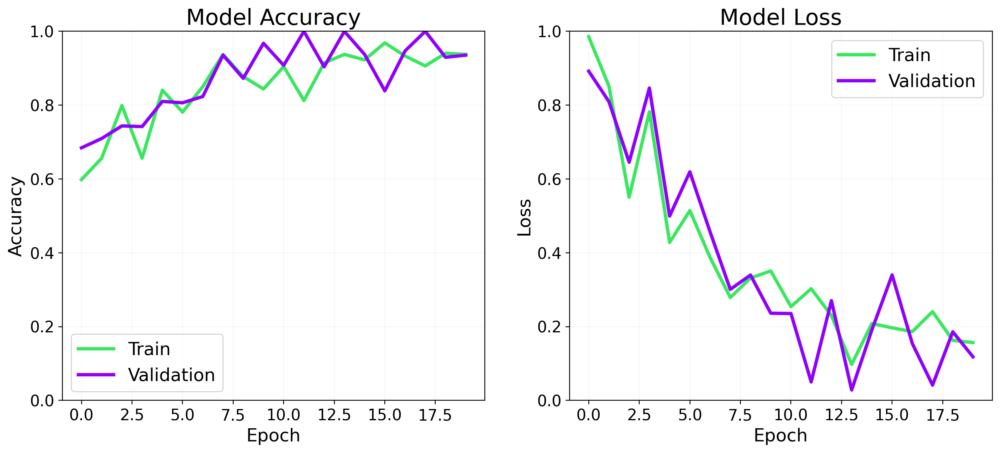

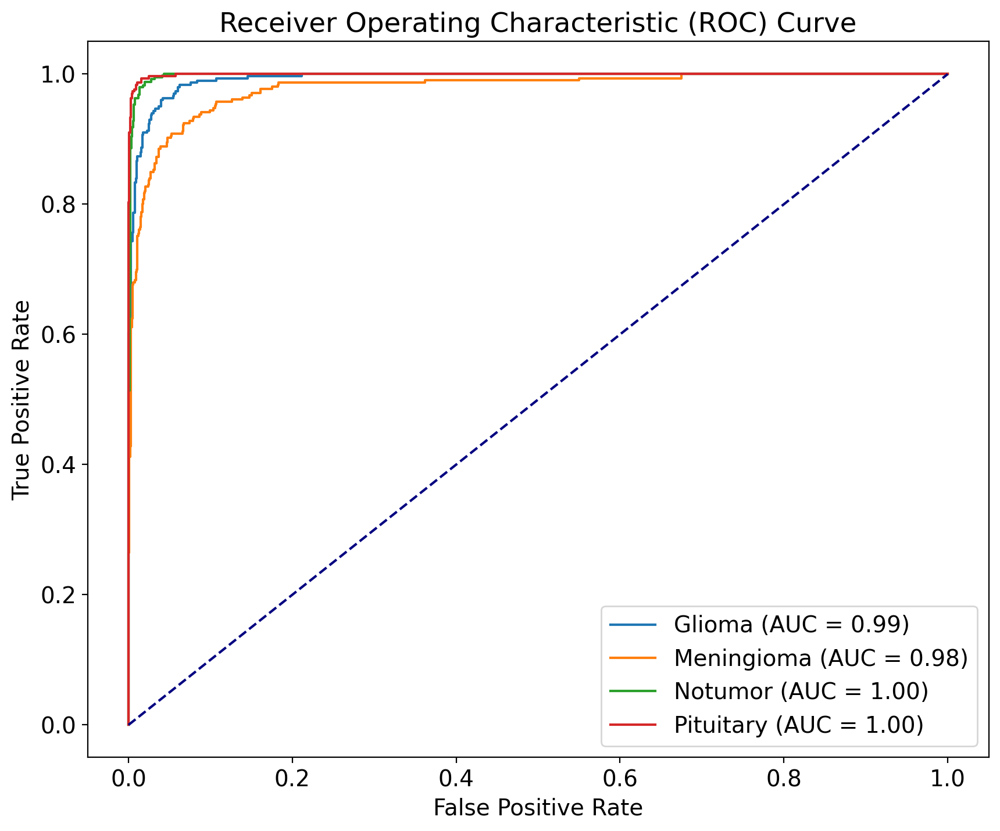

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 60ms/step


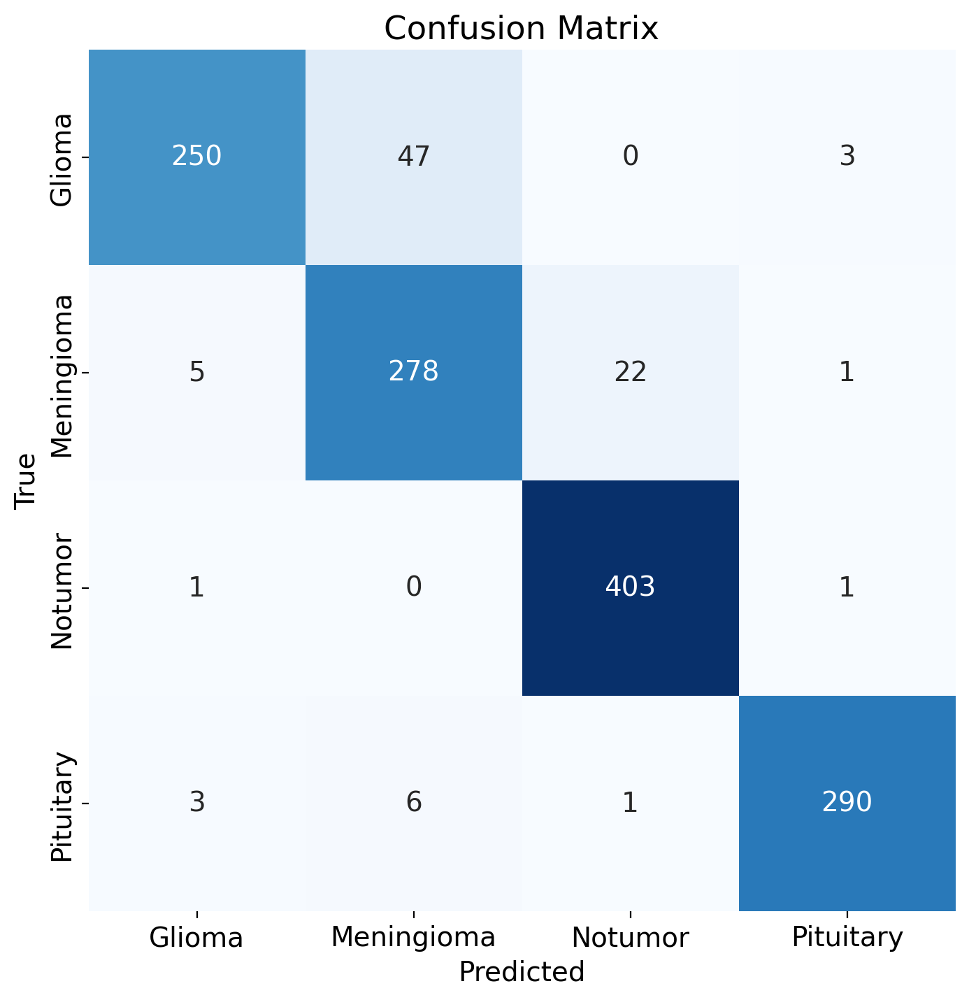

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 58ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.965251  0.833333  0.894454       300
  Meningioma   0.839879  0.908497  0.872841       306
     Notumor   0.946009  0.995062  0.969916       405
   Pituitary   0.983051  0.966667  0.974790       300

    accuracy                       0.931350      1311
   macro avg   0.933548  0.925890  0.928000      1311
weighted avg   0.934117  0.931350  0.931105      1311



In [36]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (11, 11), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 2
    Conv2D(64, (11, 11), activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 3
    Conv2D(128, (11, 11), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_32"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_96 (Conv2D)              │ (None, 140, 140, 32)   │        11,648 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_64 (MaxPooling2D) │ (None, 46, 46, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_97 (Conv2D)              │ (None, 36, 36, 64)     │       247,872 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_65 (MaxPooling2D) │ (None, 12, 12, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_98 (Conv2D)              │ (None, 2, 2, 128)      │       991,360 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_32 (Flatten)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_64 (Dense)                │ (None, 512)            │       262,656 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_32 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_65 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,515,588 (5.78 MB)

 Trainable params: 1,515,588 (5.78 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_96 has kernel size: (11, 11)
Layer conv2d_97 has kernel size: (11, 11)
Layer conv2d_98 has kernel size: (11, 11)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 49s 244ms/step - accuracy: 0.4793 - loss: 1.1170 - val_accuracy: 0.7289 - val_loss: 0.6979 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 4s 26ms/step - accuracy: 0.8125 - loss: 0.5704

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8125 - loss: 0.5704 - val_accuracy: 0.9677 - val_loss: 0.2076 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 223ms/step - accuracy: 0.8172 - loss: 0.4828 - val_accuracy: 0.7977 - val_loss: 0.4680 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 270us/step - accuracy: 0.7500 - loss: 0.5603 - val_accuracy: 0.9677 - val_loss: 0.2223 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 222ms/step - accuracy: 0.8589 - loss: 0.3575 - val_accuracy: 0.8398 - val_loss: 0.3823 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 298us/step - accuracy: 0.8750 - loss: 0.2033 - val_accuracy: 0.9677 - val_loss: 0.1086 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 230ms/step - accuracy: 0.8835 - loss: 0.3023 - val_accuracy: 0.8719 - val_loss: 0.3208 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 300us/step - accuracy: 0.8750 - loss: 0.510

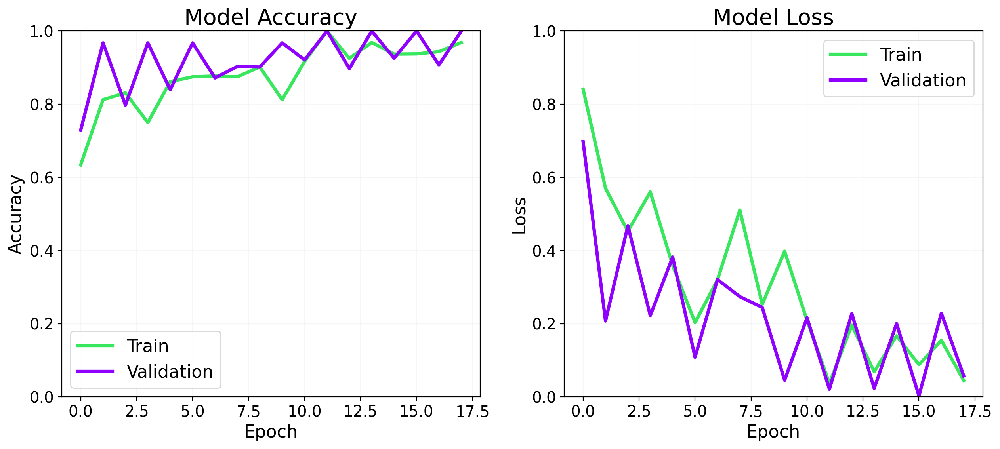

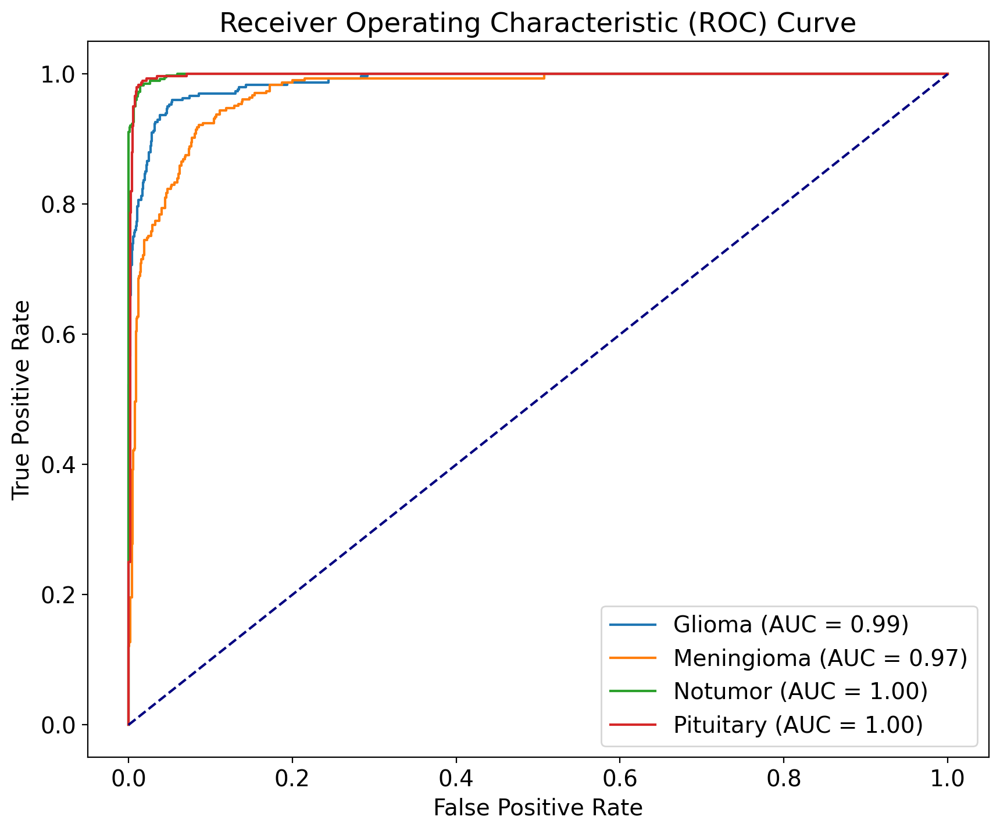

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 63ms/step


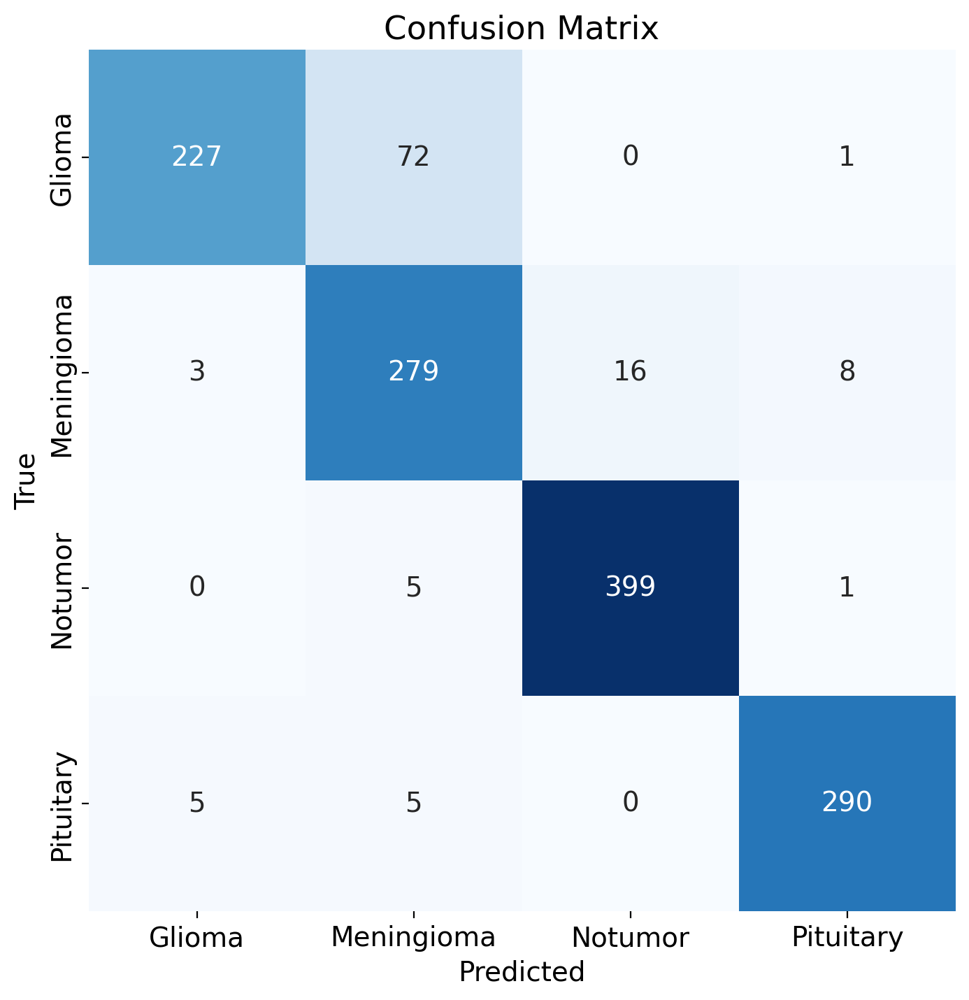

41/41 ━━━━━━━━━━━━━━━━━━━━ 3s 62ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.965957  0.756667  0.848598       300
  Meningioma   0.772853  0.911765  0.836582       306
     Notumor   0.961446  0.985185  0.973171       405
   Pituitary   0.966667  0.966667  0.966667       300

    accuracy                       0.911518      1311
   macro avg   0.916731  0.905071  0.906254      1311
weighted avg   0.919654  0.911518  0.911295      1311



In [37]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (11, 11), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 2
    Conv2D(64, (11, 11), activation="relu"),
    MaxPooling2D(pool_size=(3, 3)),

    # Convolutional layer 3
    Conv2D(128, (11, 11), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))

/opt/conda/lib/python3.10/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_33"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_99 (Conv2D)              │ (None, 139, 139, 32)   │        13,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_66 (MaxPooling2D) │ (None, 69, 69, 32)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_100 (Conv2D)             │ (None, 58, 58, 64)     │       294,976 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_67 (MaxPooling2D) │ (None, 29, 29, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_101 (Conv2D)             │ (None, 18, 18, 128)    │     1,179,776 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_33 (Flatten)            │ (None, 41472)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_66 (Dense)                │ (None, 512)            │    21,234,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_33 (Dropout)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_67 (Dense)                │ (None, 4)              │         2,052 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 22,724,836 (86.69 MB)

 Trainable params: 22,724,836 (86.69 MB)

 Non-trainable params: 0 (0.00 B)

Layer conv2d_99 has kernel size: (12, 12)
Layer conv2d_100 has kernel size: (12, 12)
Layer conv2d_101 has kernel size: (12, 12)
Epoch 1/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 53s 257ms/step - accuracy: 0.4006 - loss: 2.3690 - val_accuracy: 0.6938 - val_loss: 0.8930 - learning_rate: 0.0010
Epoch 2/64
  1/178 ━━━━━━━━━━━━━━━━━━━━ 4s 25ms/step - accuracy: 0.7812 - loss: 0.7294

/opt/conda/lib/python3.10/contextlib.py:153: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self.gen.throw(typ, value, traceback)


178/178 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step - accuracy: 0.7812 - loss: 0.7294 - val_accuracy: 0.5484 - val_loss: 1.0311 - learning_rate: 0.0010
Epoch 3/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 225ms/step - accuracy: 0.8046 - loss: 0.5230 - val_accuracy: 0.7898 - val_loss: 0.4852 - learning_rate: 0.0010
Epoch 4/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 334us/step - accuracy: 0.7188 - loss: 0.7622 - val_accuracy: 0.9677 - val_loss: 0.2286 - learning_rate: 0.0010
Epoch 5/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 42s 227ms/step - accuracy: 0.8418 - loss: 0.4178 - val_accuracy: 0.8172 - val_loss: 0.4245 - learning_rate: 0.0010
Epoch 6/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 245us/step - accuracy: 0.9062 - loss: 0.3220 - val_accuracy: 0.9032 - val_loss: 0.4218 - learning_rate: 0.0010
Epoch 7/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 41s 224ms/step - accuracy: 0.8689 - loss: 0.3297 - val_accuracy: 0.8266 - val_loss: 0.4200 - learning_rate: 0.0010
Epoch 8/64
178/178 ━━━━━━━━━━━━━━━━━━━━ 0s 292us/step - accuracy: 0.8750 - loss: 0.396

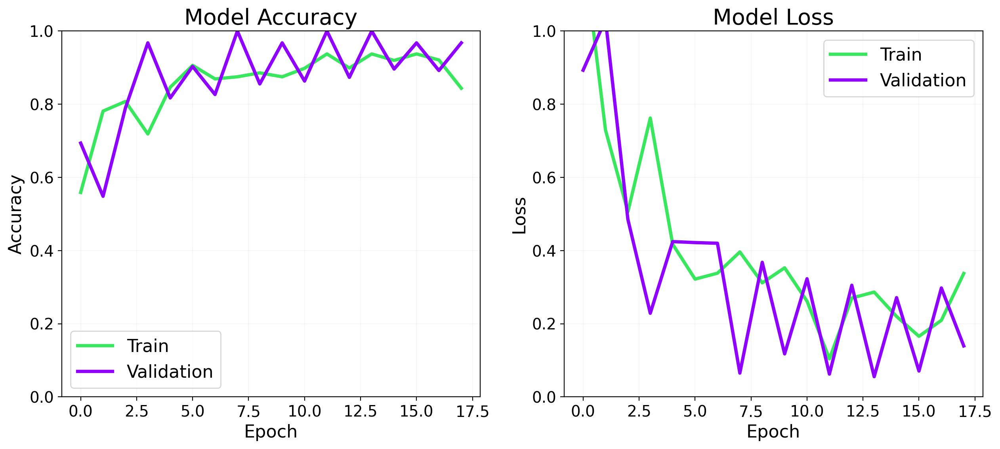

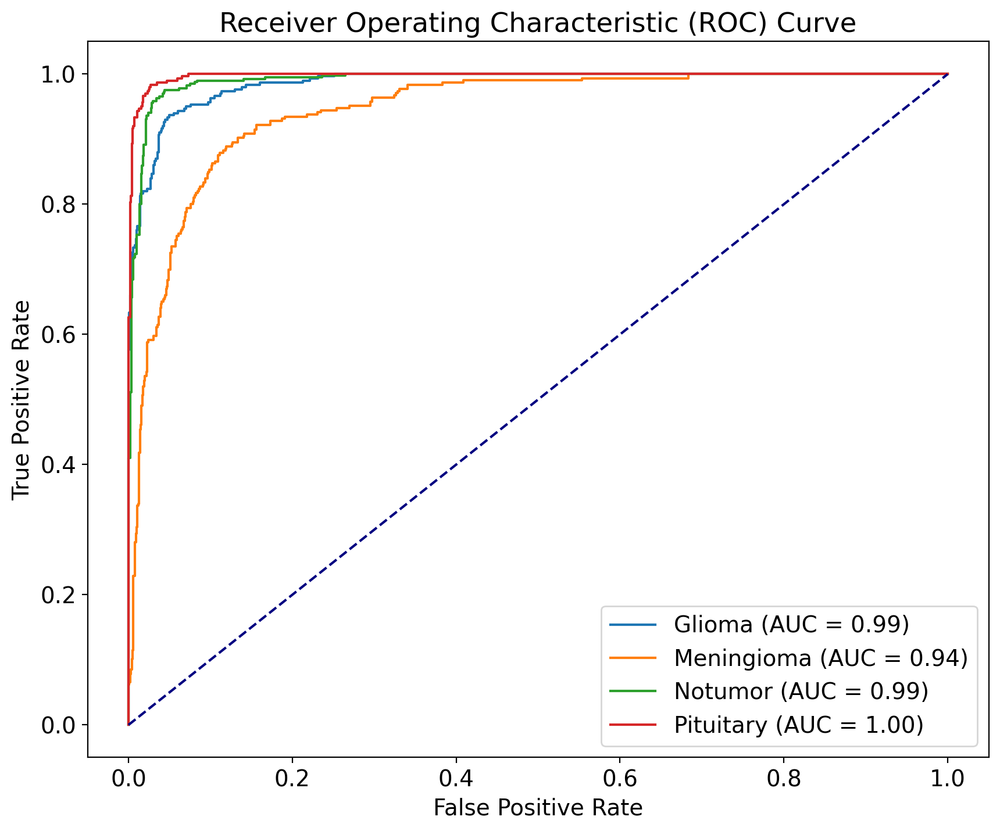

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 57ms/step


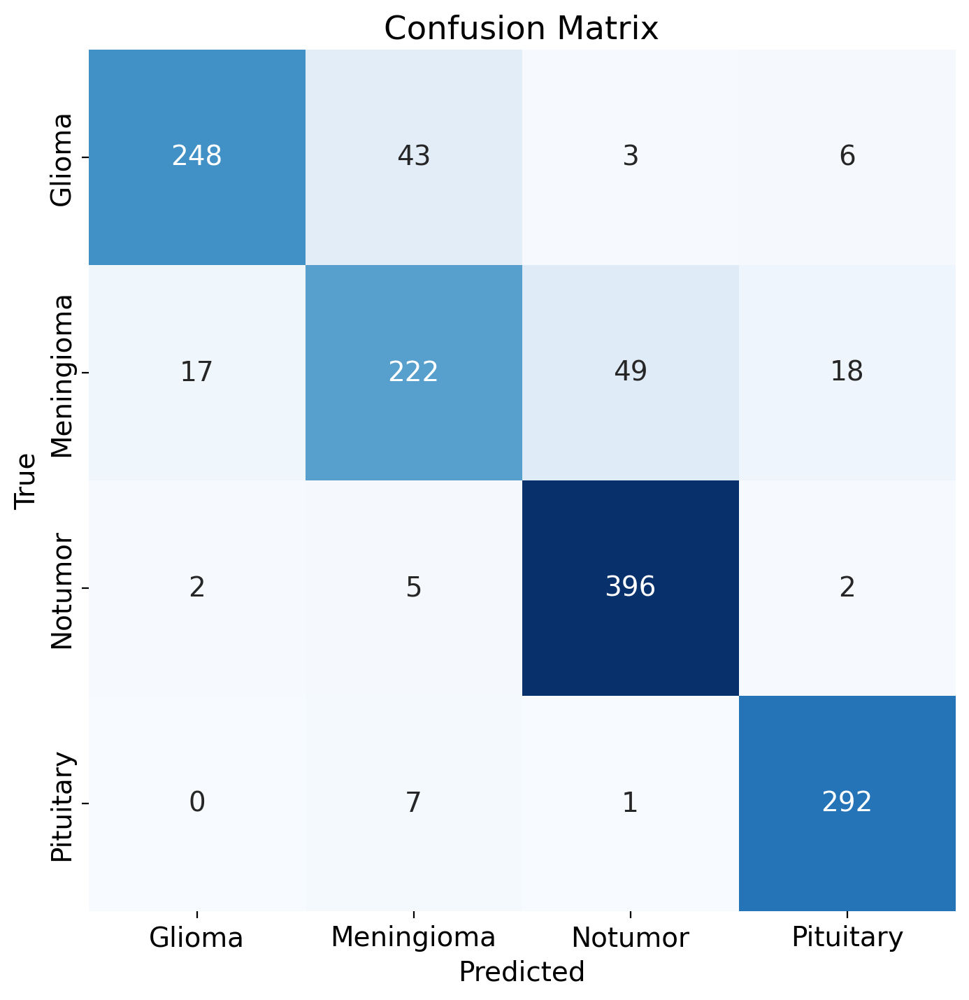

41/41 ━━━━━━━━━━━━━━━━━━━━ 2s 56ms/step
Classification Report:
              precision    recall  f1-score   support

      Glioma   0.928839  0.826667  0.874780       300
  Meningioma   0.801444  0.725490  0.761578       306
     Notumor   0.881960  0.977778  0.927400       405
   Pituitary   0.918239  0.973333  0.944984       300

    accuracy                       0.883295      1311
   macro avg   0.882620  0.875817  0.877185      1311
weighted avg   0.882196  0.883295  0.880678      1311



In [38]:
# Define the model architecture 
model = models.Sequential([
    
    # Convolutional layer 1
    Conv2D(32, (12, 12), activation="relu", input_shape=image_shape),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 2
    Conv2D(64, (12, 12), activation="relu"),
    MaxPooling2D(pool_size=(2, 2)),

    # Convolutional layer 3
    Conv2D(128, (12, 12), activation="relu"),
    Flatten(),

    # Full connect layers
    Dense(512, activation="relu"),
    Dropout(0.35, seed=SEED),
    Dense(N_TYPES, activation="softmax")
])
model.summary()
# Display the kernel size for each convolutional layer
for layer in model.layers:
    if isinstance(layer, Conv2D):
        print(f"Layer {layer.name} has kernel size: {layer.kernel_size}")
from tensorflow.keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1=0.869, beta_2=0.995)

model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics= ['accuracy'])
# Stop training if loss doesn't keep decreasing.
model_es = EarlyStopping(monitor='loss', min_delta=1e-9, patience=6, verbose=True)
model_rlr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=True)

# Training the model
history = model.fit(train_generator,
                    steps_per_epoch=steps_per_epoch,
                    epochs=epochs,
                    validation_data=test_generator,
                    validation_steps=validation_steps,
                    callbacks=[model_es, model_rlr])

# Get predictions
y_true = test_generator.classes
#y_pred_prob = model.predict(test_generator, steps=np.ceil(test_generator.samples / test_generator.batch_size), verbose=1)
y_pred_prob = model.predict(test_generator, steps=int(np.ceil(test_generator.samples / test_generator.batch_size)), verbose=1)

# Binarize the true labels
class_names = list(train_generator.class_indices.keys())
y_true_bin = label_binarize(y_true, classes=list(train_generator.class_indices.values()))

_, ax = plt.subplots(ncols=2, figsize=(15, 6))


# Plot the training and validation accuracy over epochs
ax[0].plot(history.history['accuracy'], linewidth=3, color='#39e75f')  # Training accuracy in pink
ax[0].plot(history.history['val_accuracy'], linewidth=3, color='#8f00ff')  # Validation accuracy in red
ax[0].set_title('Model Accuracy', fontsize=20)
ax[0].set_xlabel('Epoch', fontsize=16)
ax[0].set_ylabel('Accuracy', fontsize=16)
ax[0].set_ylim(0, 1)  # Set y-axis range
ax[0].legend(['Train', 'Validation'], fontsize=16)
ax[0].grid(alpha=0.1)

# Plot the training and validation loss over epochs
ax[1].plot(history.history['loss'], linewidth=3, color='#39e75f')  # Training loss in pink
ax[1].plot(history.history['val_loss'], linewidth=3, color='#8f00ff')  # Validation loss in red
ax[1].set_title('Model Loss', fontsize=20)
ax[1].set_xlabel('Epoch', fontsize=16)
ax[1].set_ylabel('Loss', fontsize=16)
ax[1].set_ylim(0, 1)  # Set y-axis range
ax[1].legend(['Train', 'Validation'], fontsize=16)
ax[1].grid(alpha=0.1)

plt.show()
# Plot ROC curve for each class
plt.figure(figsize=(10, 8))
for i, class_name in enumerate(class_names):
    class_name_title_case = class_name.title()  # Convert to title case
    fpr, tpr, _ = roc_curve(y_true_bin[:, i], y_pred_prob[:, i])
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, label=f'{class_name_title_case} (AUC = {roc_auc:.2f})')

# Plot diagonal line (random classifier)
plt.plot([0, 1], [0, 1], color='navy', linestyle='--')

# Labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend(loc='lower right')
plt.show()
# Plotting confusion matrix
confusion_matrix = CM(CNN_model=model, test_generator=test_generator, categories=class_indices_train_list)

plt.figure(figsize=(8,8))
sns.heatmap(confusion_matrix, annot=True, fmt="d", cmap="Blues", cbar=False)
plt.title("Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.xticks(ticks=np.arange(N_TYPES) + 0.5,
           labels=[name.title() for name in class_indices_train_list], ha='center')
plt.yticks(ticks=np.arange(N_TYPES) + 0.5, 
           labels=[name.title() for name in class_indices_train_list], va='center')
plt.show()
# Classification Report
from sklearn.metrics import classification_report

# Assuming `test_generator` provides true labels and your model outputs predictions
# Obtain true labels and predicted labels
y_true = test_generator.classes  # True labels from test generator
y_pred = np.argmax(model.predict(test_generator), axis=1)  # Predicted labels from the model

# Print the classification report
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=[name.title() for name in class_indices_train_list], digits=6))